# EGS: Validation Checks (FULL)

In [1]:
%matplotlib inline
#%config InlineBackend.figure_format = 'svg'

import matplotlib.pyplot as plt
plt.rc('figure', figsize=(10, 6))
plt.style.use('ggplot')

import numpy as np
from astropy.table import Table
import itertools


In [2]:
catname = "../../dmu1/dmu1_ml_EGS/data/master_catalogue_egs_20180406.fits"
master_catalogue = Table.read(catname)

print("Number of sources in master catalogue: ", len(master_catalogue))

Number of sources in master catalogue:  1412613


In [3]:
field = master_catalogue["field"][0]
field = field.rstrip()    # remove whitespaces at the end of the sting
print(field)

EGS


In [4]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

## 1/ Magnitude errors

In [19]:
u_bands = ["Megacam u",                                  "MMT u"]
g_bands = ["Megacam g", "SUPRIME g", "GPC1 g", "BASS g", "MMT g"] 
r_bands = ["Megacam r", "SUPRIME r", "GPC1 r", "BASS r"]
i_bands = ["Megacam i", "SUPRIME i", "GPC1 i",           "MMT i"]
z_bands = ["Megacam z", "SUPRIME z", "GPC1 z", "BASS z", "MMT z"]
y_bands = [             "SUPRIME y", "GPC1 y"]
J_bands = [                                             "WIRCAM J",  "WIRCS J",                "UKIDSS J", "OMEGA2000 J"]
H_bands = [                                             "WIRCAM H"]
K_bands = [                                             "WIRCAM Ks", "WIRCS K", "NEWFIRM K",              "OMEGA2000 Ks"]

all_bands = [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands, J_bands, K_bands]

irac_bands = ["IRAC i1", "IRAC i2", "IRAC i3", "IRAC i4"]

opt_mags = u_bands + g_bands + r_bands + i_bands + z_bands + y_bands
ir_mags = J_bands + H_bands + K_bands + irac_bands

other_bands = ["WFC3 F140W", "WFC3 F160W", "WFC3 F125W", "ACS F606W", "ACS F814W",
               "NEWFIRM J1", "NEWFIRM J2", "NEWFIRM J3", "NEWFIRM H1", "NEWFIRM H2"]


all_mags = opt_mags + ir_mags + other_bands

In [17]:
# No aperture magnitude -> add empty columns
for mag in ["MMT u", "MMT g", "MMT i", "MMT z", "WIRCS J", "OMEGA2000 J", "OMEGA2000 Ks", "IRAC i1", "IRAC i2", "IRAC i3", "IRAC i4"]:
    basecol = mag.replace(" ", "_").lower()
    m_ap_col, merr_ap_col = "m_ap_{}".format(basecol), "merr_ap_{}".format(basecol)
    
    master_catalogue[m_ap_col] = [np.nan] * len(master_catalogue)
    master_catalogue[merr_ap_col] = [np.nan] * len(master_catalogue)



## 1/ Magnitude errors

In [20]:
def mag_vs_err(x, y, fig, ax, labels=("x", "y"), savefig=False):

    x_label, y_label = labels
    print(x_label)

    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & (x!=99.) & (y!=99.)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
   
    if len(x) == 0:
        print("No sources have {} values.".format(x_label))
        print("")
        return
  
    #"""
    if len(x) > 0:
        print("    Error max: {:.0f}".format(np.max(y)))
        err10 = y > 10
        if len(x[err10]) > 0:
            print("    magerr > 10: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err10]), np.min(x[err10])))
        else:
            print("    magerr > 10: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err10]), np.nan))
        err100 = y > 100
        if len(x[err100]) > 0:
            print("    magerr > 100: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err100]), np.min(x[err100])))
        else:
            print("    magerr > 100: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err100]), np.nan))
        err1000 = y > 1000
        if len(x[err1000]) > 0:
            print("    magerr > 1000: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err1000]), np.min(x[err1000])))
        else:
            print("    magerr > 1000: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err1000]), np.nan))
    else:
        print("    no data")
    print("")
    #"""

    # Plot
    ax.set_yscale('log')    # to place before scatter to avoid issues
    ax.scatter(x, y, marker='.', alpha=0.1, s=50)
    ax.invert_xaxis()
    ax.set_xlabel(labels[0])
    ax.set_ylabel(labels[1])

    # Save ex. fig
    if savefig:
        survey_label = ((x_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_magVSmagerr_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')

        

Megacam u mag (aperture)
    Error max: 89
    magerr > 10: Number of objects = 567, min mag = 31.3
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

Megacam u mag (total)
    Error max: 535
    magerr > 10: Number of objects = 781, min mag = 29.7
    magerr > 100: Number of objects = 24, min mag = 33.7
    magerr > 1000: Number of objects = 0, min mag = nan



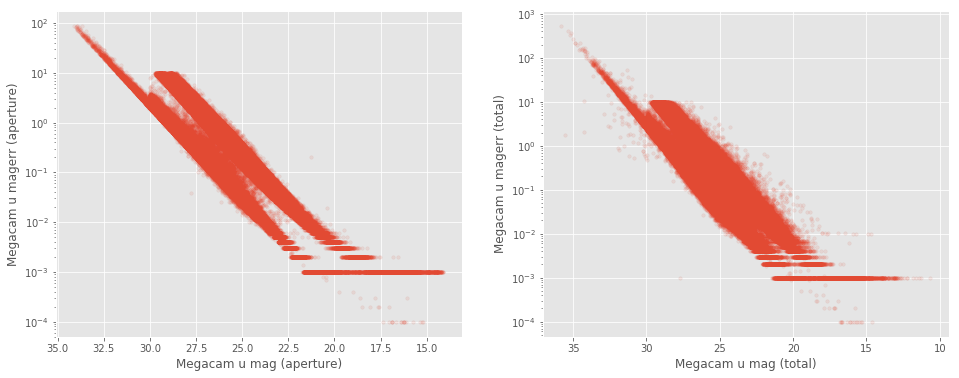

MMT u mag (aperture)
No sources have MMT u mag (aperture) values.

MMT u mag (total)
    Error max: 59
    magerr > 10: Number of objects = 7, min mag = 29.0
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



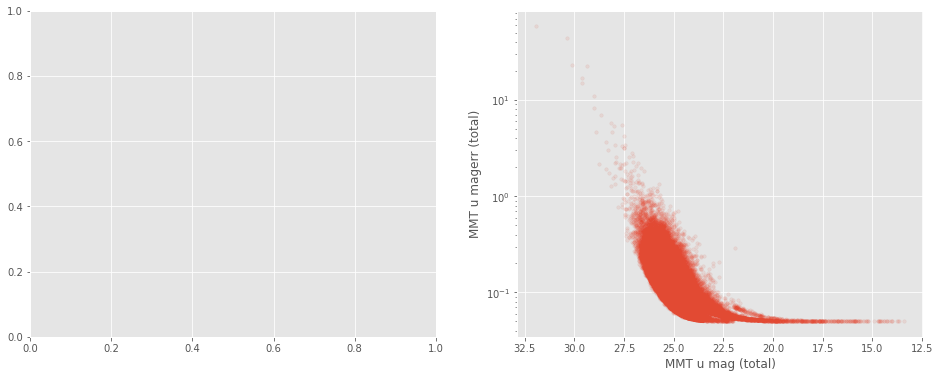

Megacam g mag (aperture)
    Error max: 89
    magerr > 10: Number of objects = 306, min mag = 31.8
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

Megacam g mag (total)
    Error max: 831
    magerr > 10: Number of objects = 389, min mag = 30.2
    magerr > 100: Number of objects = 13, min mag = 33.9
    magerr > 1000: Number of objects = 0, min mag = nan



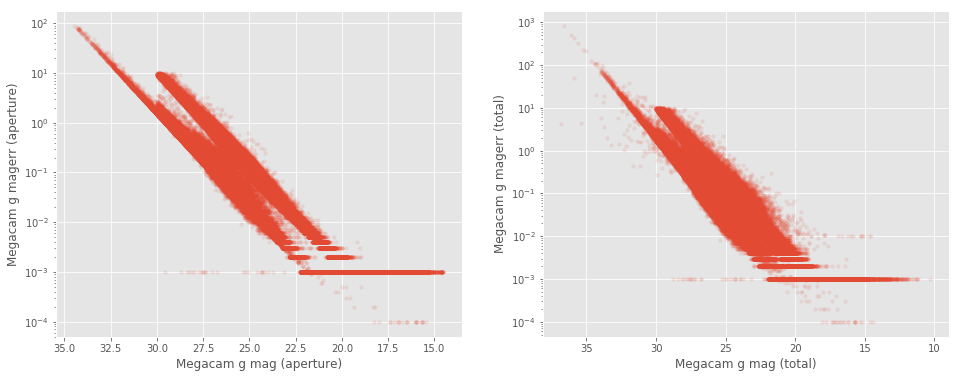

SUPRIME g mag (aperture)
    Error max: 11279396765696
    magerr > 10: Number of objects = 2914, min mag = 30.1
    magerr > 100: Number of objects = 1105, min mag = 32.6
    magerr > 1000: Number of objects = 531, min mag = 35.2

SUPRIME g mag (total)
    Error max: 141385252864
    magerr > 10: Number of objects = 2469, min mag = 28.5
    magerr > 100: Number of objects = 772, min mag = 30.1
    magerr > 1000: Number of objects = 351, min mag = 34.8



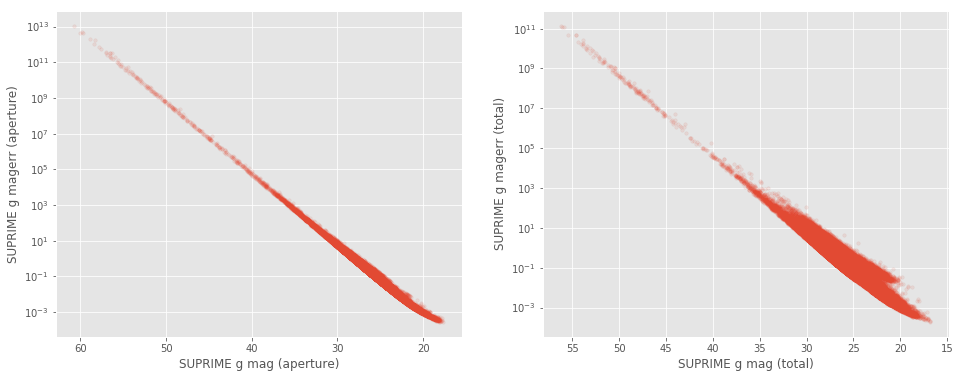

GPC1 g mag (aperture)
    Error max: 4258
    magerr > 10: Number of objects = 344, min mag = 24.7
    magerr > 100: Number of objects = 41, min mag = 27.7
    magerr > 1000: Number of objects = 5, min mag = 29.9

GPC1 g mag (total)
    Error max: 3020
    magerr > 10: Number of objects = 326, min mag = 22.2
    magerr > 100: Number of objects = 27, min mag = 27.3
    magerr > 1000: Number of objects = 4, min mag = 30.4



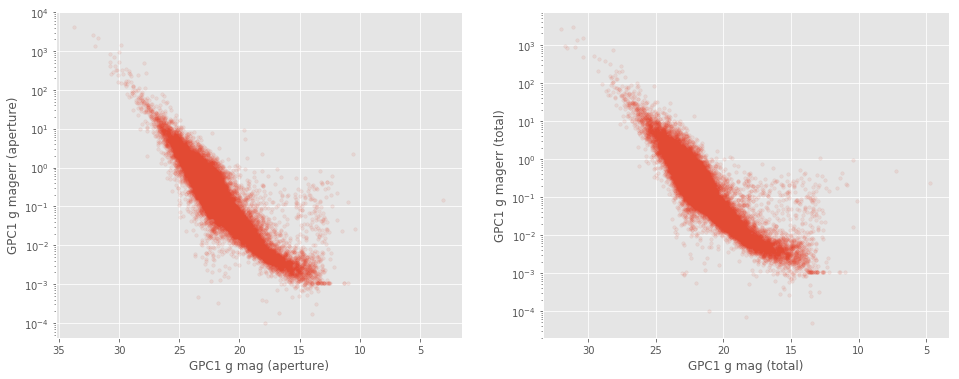

BASS g mag (aperture)
    Error max: 3200
    magerr > 10: Number of objects = 193, min mag = 27.8
    magerr > 100: Number of objects = 22, min mag = 31.1
    magerr > 1000: Number of objects = 2, min mag = 34.2

BASS g mag (total)
    Error max: 4120
    magerr > 10: Number of objects = 223, min mag = 25.2
    magerr > 100: Number of objects = 27, min mag = 30.0
    magerr > 1000: Number of objects = 3, min mag = 33.5



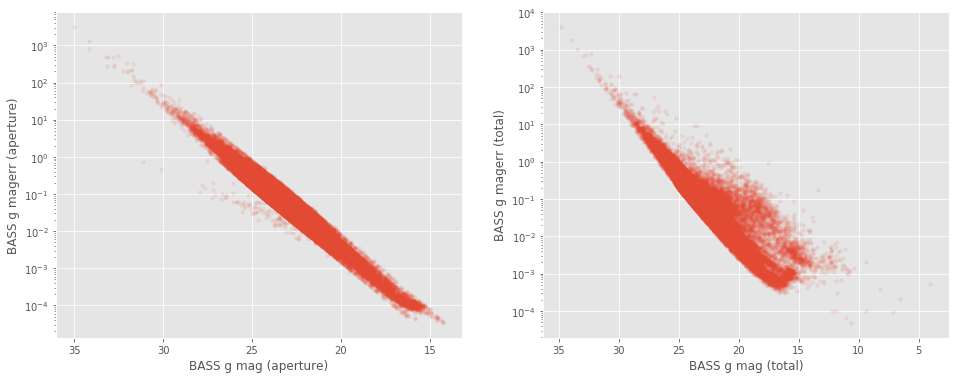

MMT g mag (aperture)
No sources have MMT g mag (aperture) values.

MMT g mag (total)
    Error max: 102
    magerr > 10: Number of objects = 4, min mag = 29.7
    magerr > 100: Number of objects = 1, min mag = 32.2
    magerr > 1000: Number of objects = 0, min mag = nan



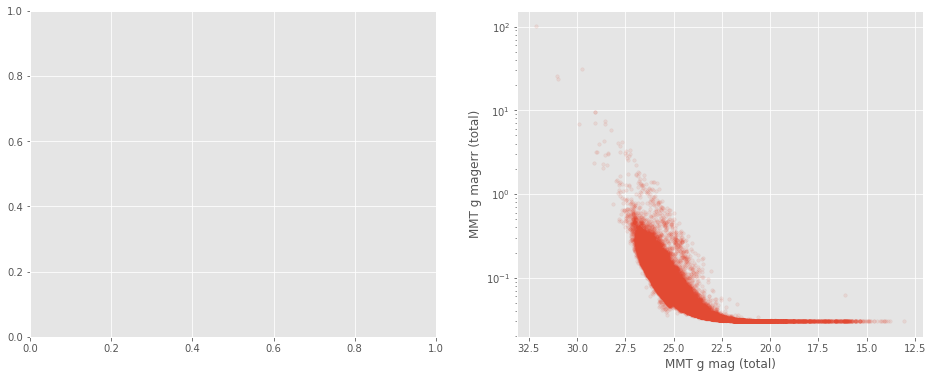

Megacam r mag (aperture)
    Error max: 89
    magerr > 10: Number of objects = 318, min mag = 31.3
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

Megacam r mag (total)
    Error max: 412
    magerr > 10: Number of objects = 307, min mag = 30.0
    magerr > 100: Number of objects = 8, min mag = 33.2
    magerr > 1000: Number of objects = 0, min mag = nan



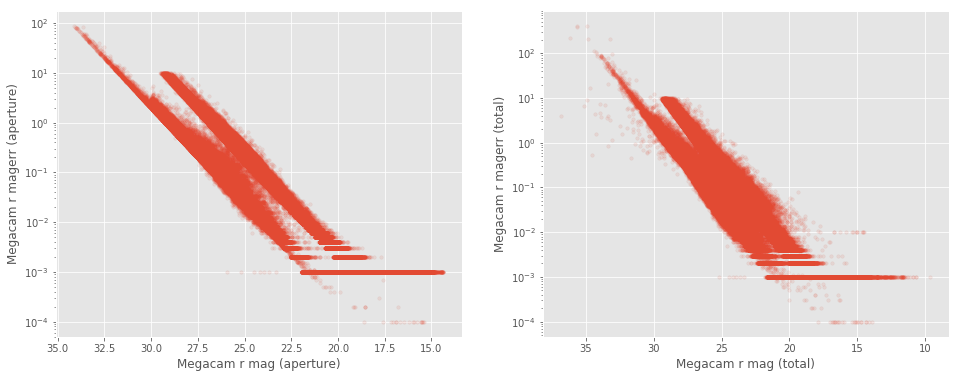

SUPRIME r mag (aperture)
    Error max: 7032768512
    magerr > 10: Number of objects = 2781, min mag = 29.3
    magerr > 100: Number of objects = 976, min mag = 32.2
    magerr > 1000: Number of objects = 467, min mag = 34.5

SUPRIME r mag (total)
    Error max: 13185206272
    magerr > 10: Number of objects = 2377, min mag = 27.6
    magerr > 100: Number of objects = 632, min mag = 30.4
    magerr > 1000: Number of objects = 254, min mag = 33.1



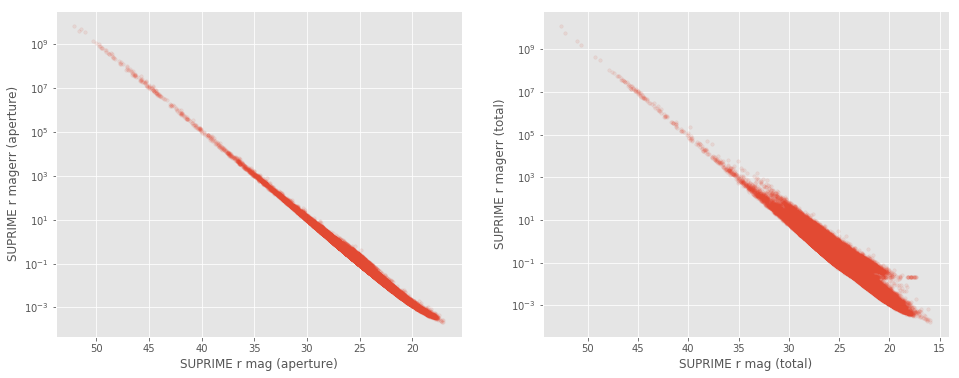

GPC1 r mag (aperture)
    Error max: 3817
    magerr > 10: Number of objects = 90, min mag = 11.5
    magerr > 100: Number of objects = 10, min mag = 27.0
    magerr > 1000: Number of objects = 1, min mag = 32.0

GPC1 r mag (total)
    Error max: 22150
    magerr > 10: Number of objects = 99, min mag = 11.8
    magerr > 100: Number of objects = 9, min mag = 27.4
    magerr > 1000: Number of objects = 1, min mag = 34.0



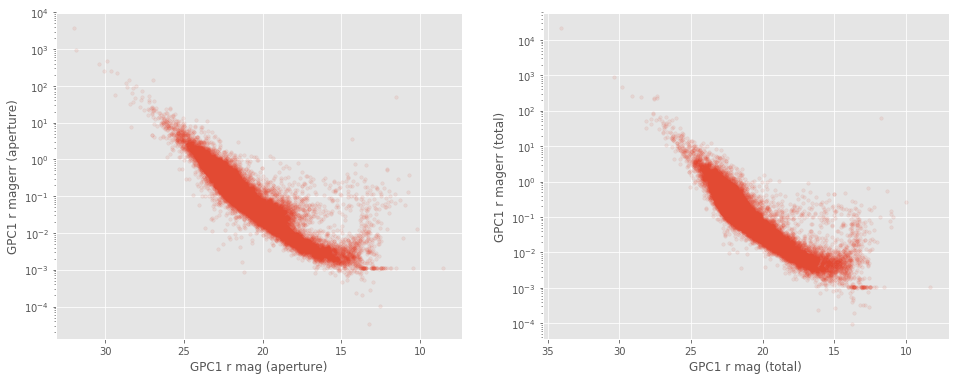

BASS r mag (aperture)
    Error max: 5129
    magerr > 10: Number of objects = 318, min mag = 27.0
    magerr > 100: Number of objects = 31, min mag = 29.7
    magerr > 1000: Number of objects = 6, min mag = 32.9

BASS r mag (total)
    Error max: 11015
    magerr > 10: Number of objects = 287, min mag = 21.7
    magerr > 100: Number of objects = 34, min mag = 24.4
    magerr > 1000: Number of objects = 6, min mag = 32.0



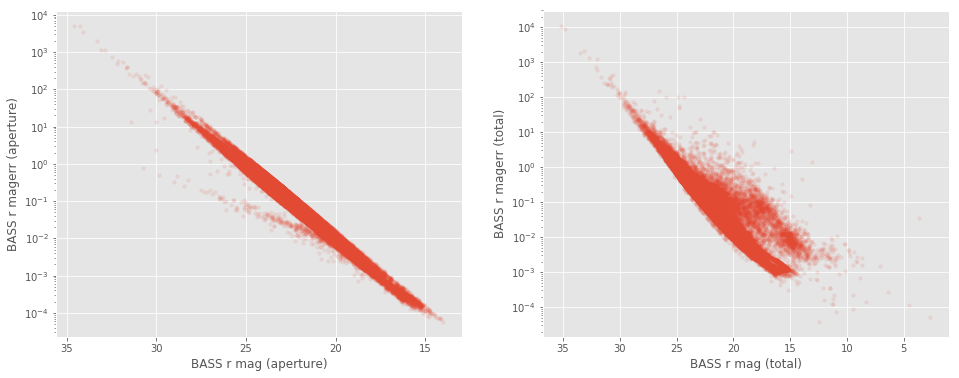

Megacam i mag (aperture)
    Error max: 88
    magerr > 10: Number of objects = 293, min mag = 30.9
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

Megacam i mag (total)
    Error max: 3162
    magerr > 10: Number of objects = 328, min mag = 29.9
    magerr > 100: Number of objects = 10, min mag = 32.8
    magerr > 1000: Number of objects = 3, min mag = 36.4



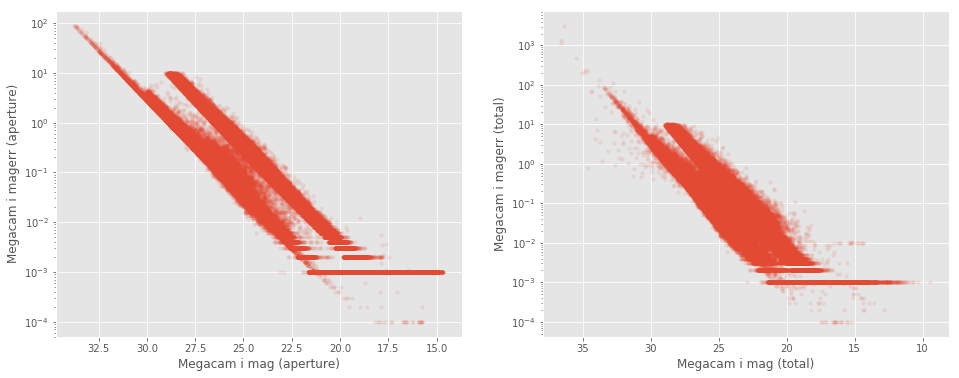

SUPRIME i mag (aperture)
    Error max: 7480136704
    magerr > 10: Number of objects = 567, min mag = 29.5
    magerr > 100: Number of objects = 166, min mag = 32.1
    magerr > 1000: Number of objects = 88, min mag = 34.7

SUPRIME i mag (total)
    Error max: 291780800
    magerr > 10: Number of objects = 1152, min mag = 27.7
    magerr > 100: Number of objects = 147, min mag = 30.3
    magerr > 1000: Number of objects = 38, min mag = 32.9



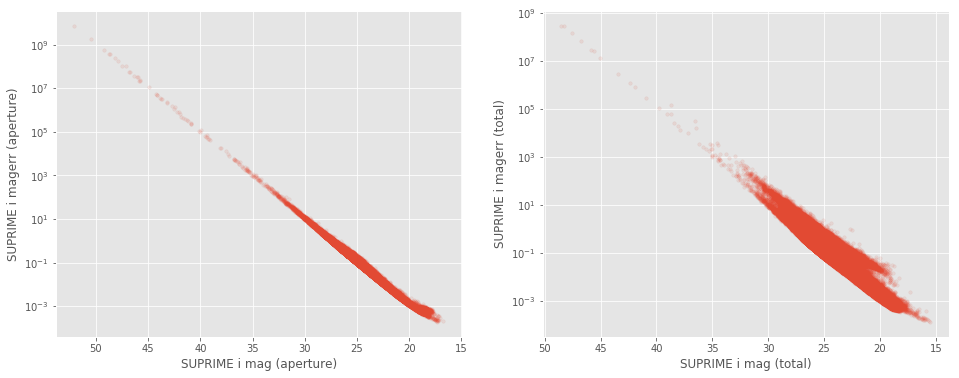

GPC1 i mag (aperture)
    Error max: 210
    magerr > 10: Number of objects = 36, min mag = 23.8
    magerr > 100: Number of objects = 4, min mag = 27.5
    magerr > 1000: Number of objects = 0, min mag = nan

GPC1 i mag (total)
    Error max: 917
    magerr > 10: Number of objects = 41, min mag = 23.1
    magerr > 100: Number of objects = 5, min mag = 27.6
    magerr > 1000: Number of objects = 0, min mag = nan



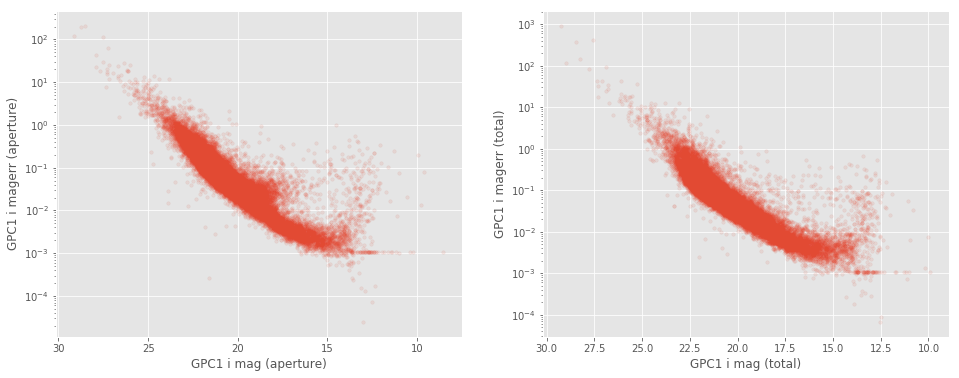

MMT i mag (aperture)
No sources have MMT i mag (aperture) values.

MMT i mag (total)
    Error max: 629
    magerr > 10: Number of objects = 15, min mag = 27.7
    magerr > 100: Number of objects = 1, min mag = 32.0
    magerr > 1000: Number of objects = 0, min mag = nan



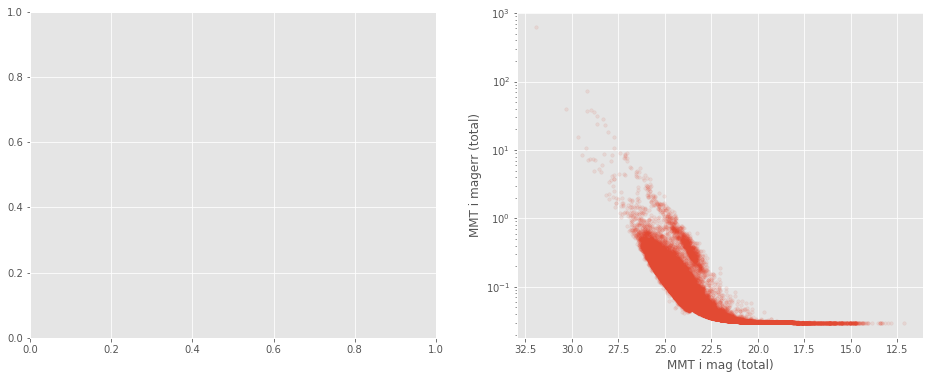

Megacam z mag (aperture)
    Error max: 89
    magerr > 10: Number of objects = 409, min mag = 30.0
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

Megacam z mag (total)
    Error max: 5029
    magerr > 10: Number of objects = 579, min mag = 28.9
    magerr > 100: Number of objects = 18, min mag = 32.9
    magerr > 1000: Number of objects = 2, min mag = 35.7



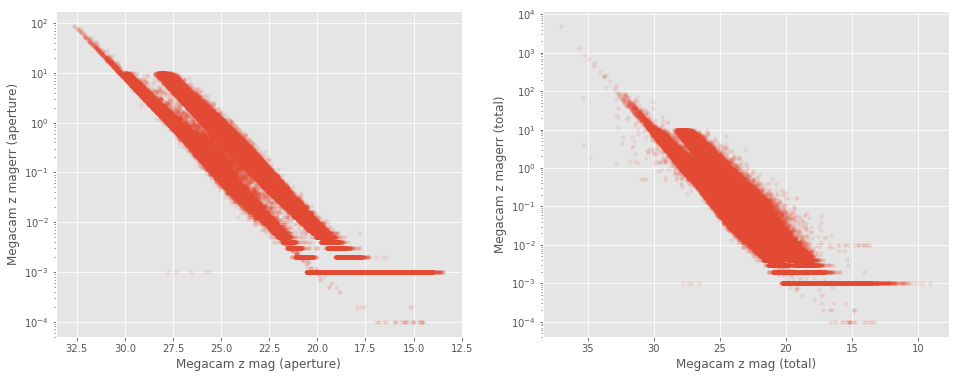

SUPRIME z mag (aperture)
    Error max: 33707974656
    magerr > 10: Number of objects = 6199, min mag = 28.6
    magerr > 100: Number of objects = 2012, min mag = 31.1
    magerr > 1000: Number of objects = 775, min mag = 33.5

SUPRIME z mag (total)
    Error max: 8110551040
    magerr > 10: Number of objects = 4468, min mag = 26.6
    magerr > 100: Number of objects = 1099, min mag = 29.3
    magerr > 1000: Number of objects = 399, min mag = 32.2



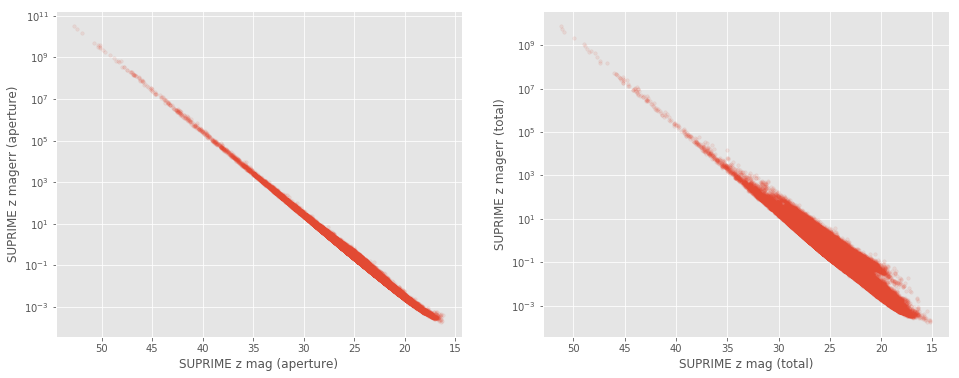

GPC1 z mag (aperture)
    Error max: 2533
    magerr > 10: Number of objects = 51, min mag = 24.1
    magerr > 100: Number of objects = 2, min mag = 26.9
    magerr > 1000: Number of objects = 1, min mag = 31.6

GPC1 z mag (total)
    Error max: 3192
    magerr > 10: Number of objects = 67, min mag = 23.4
    magerr > 100: Number of objects = 6, min mag = 26.8
    magerr > 1000: Number of objects = 2, min mag = 29.5



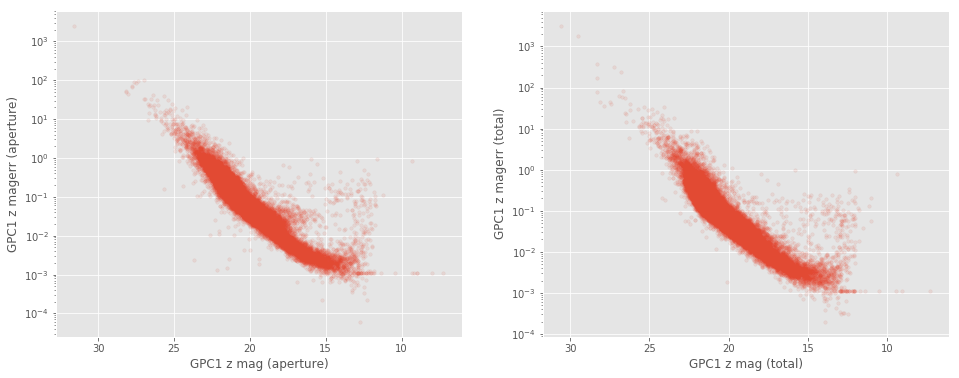

BASS z mag (aperture)
    Error max: 13350
    magerr > 10: Number of objects = 1006, min mag = 25.7
    magerr > 100: Number of objects = 96, min mag = 28.3
    magerr > 1000: Number of objects = 10, min mag = 30.9

BASS z mag (total)
    Error max: 2490
    magerr > 10: Number of objects = 480, min mag = 14.2
    magerr > 100: Number of objects = 50, min mag = 23.8
    magerr > 1000: Number of objects = 6, min mag = 31.4



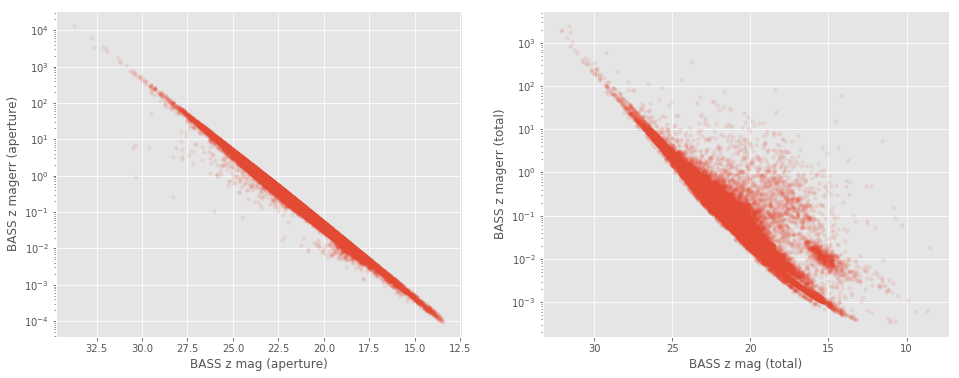

MMT z mag (aperture)
No sources have MMT z mag (aperture) values.

MMT z mag (total)
    Error max: 224
    magerr > 10: Number of objects = 12, min mag = 28.6
    magerr > 100: Number of objects = 2, min mag = 31.5
    magerr > 1000: Number of objects = 0, min mag = nan



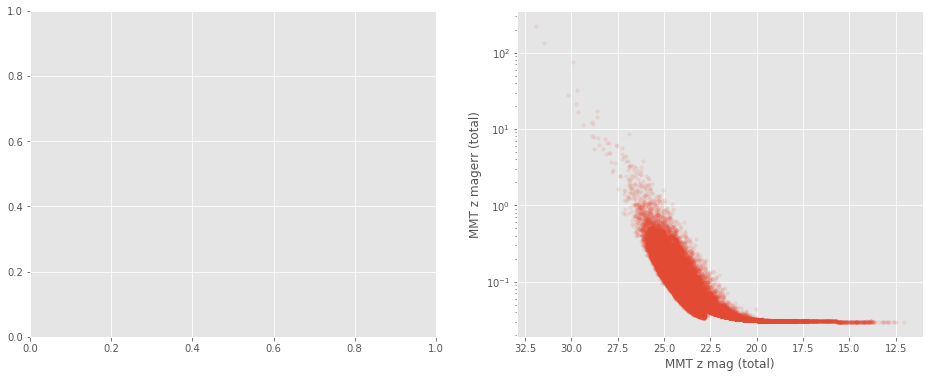

SUPRIME y mag (aperture)
    Error max: 409165004800
    magerr > 10: Number of objects = 15693, min mag = 27.3
    magerr > 100: Number of objects = 5063, min mag = 30.1
    magerr > 1000: Number of objects = 1389, min mag = 32.7

SUPRIME y mag (total)
    Error max: 2543456512
    magerr > 10: Number of objects = 9385, min mag = 25.1
    magerr > 100: Number of objects = 2237, min mag = 28.4
    magerr > 1000: Number of objects = 570, min mag = 31.7



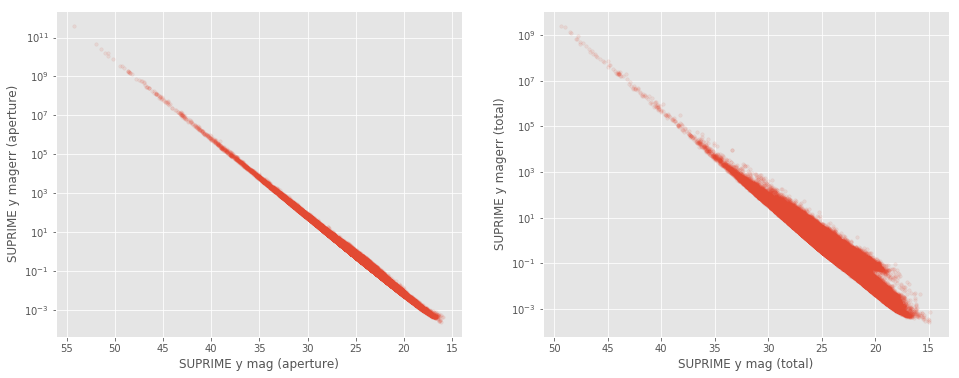

GPC1 y mag (aperture)
    Error max: 68328
    magerr > 10: Number of objects = 211, min mag = 22.6
    magerr > 100: Number of objects = 20, min mag = 25.0
    magerr > 1000: Number of objects = 1, min mag = 34.1

GPC1 y mag (total)
    Error max: 186325
    magerr > 10: Number of objects = 273, min mag = 21.4
    magerr > 100: Number of objects = 20, min mag = 25.8
    magerr > 1000: Number of objects = 3, min mag = 28.4



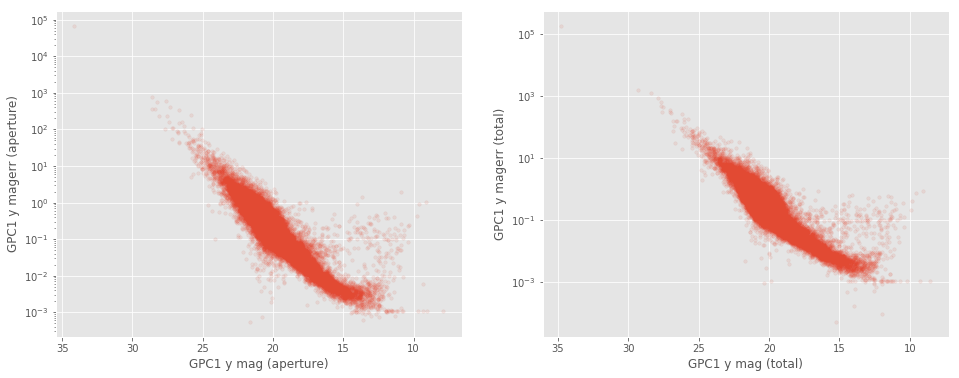

WIRCAM J mag (aperture)
    Error max: 89
    magerr > 10: Number of objects = 414, min mag = 26.7
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

WIRCAM J mag (total)
    Error max: 52404
    magerr > 10: Number of objects = 1224, min mag = 25.9
    magerr > 100: Number of objects = 71, min mag = 31.2
    magerr > 1000: Number of objects = 4, min mag = 34.3



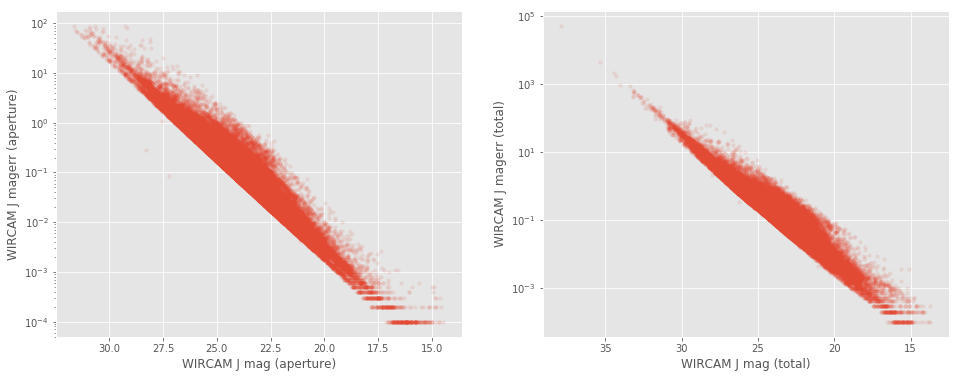

WIRCS J mag (aperture)
No sources have WIRCS J mag (aperture) values.

WIRCS J mag (total)
    Error max: 470
    magerr > 10: Number of objects = 1, min mag = 21.9
    magerr > 100: Number of objects = 1, min mag = 21.9
    magerr > 1000: Number of objects = 0, min mag = nan



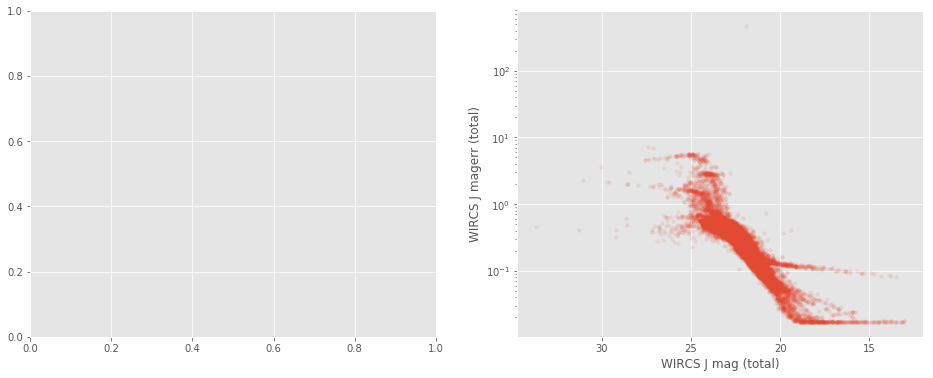

UKIDSS J mag (aperture)
    Error max: 7
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

UKIDSS J mag (total)
    Error max: 248
    magerr > 10: Number of objects = 4, min mag = 23.9
    magerr > 100: Number of objects = 1, min mag = 27.9
    magerr > 1000: Number of objects = 0, min mag = nan



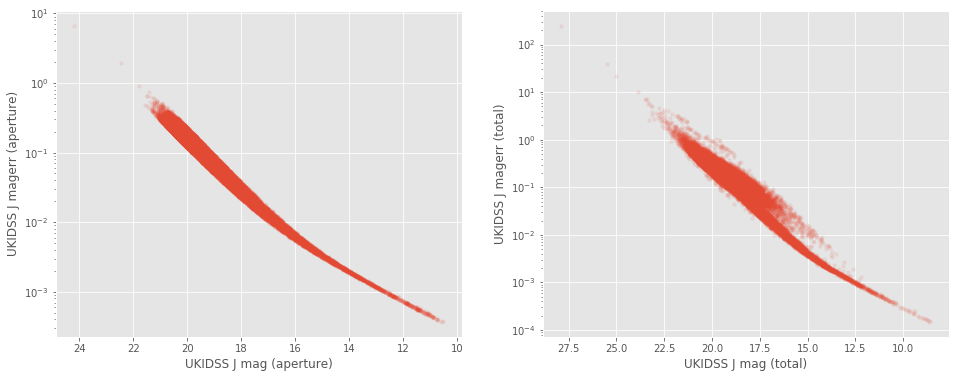

OMEGA2000 J mag (aperture)
No sources have OMEGA2000 J mag (aperture) values.

OMEGA2000 J mag (total)
    Error max: 378
    magerr > 10: Number of objects = 11, min mag = 25.7
    magerr > 100: Number of objects = 1, min mag = 30.4
    magerr > 1000: Number of objects = 0, min mag = nan



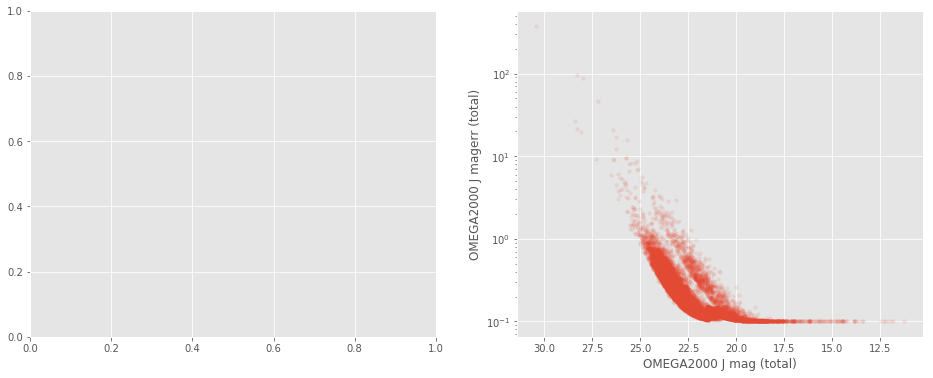

WIRCAM H mag (aperture)
    Error max: 88
    magerr > 10: Number of objects = 408, min mag = 27.0
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

WIRCAM H mag (total)
    Error max: 17025
    magerr > 10: Number of objects = 1124, min mag = 26.1
    magerr > 100: Number of objects = 87, min mag = 31.2
    magerr > 1000: Number of objects = 13, min mag = 33.7



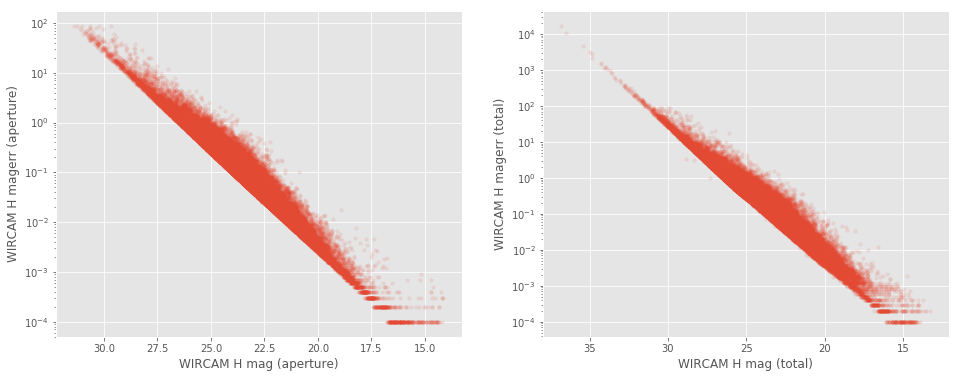

WIRCAM Ks mag (aperture)
    Error max: 87
    magerr > 10: Number of objects = 48, min mag = 26.8
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

WIRCAM Ks mag (total)
    Error max: 10212
    magerr > 10: Number of objects = 859, min mag = 26.6
    magerr > 100: Number of objects = 88, min mag = 31.1
    magerr > 1000: Number of objects = 12, min mag = 33.4



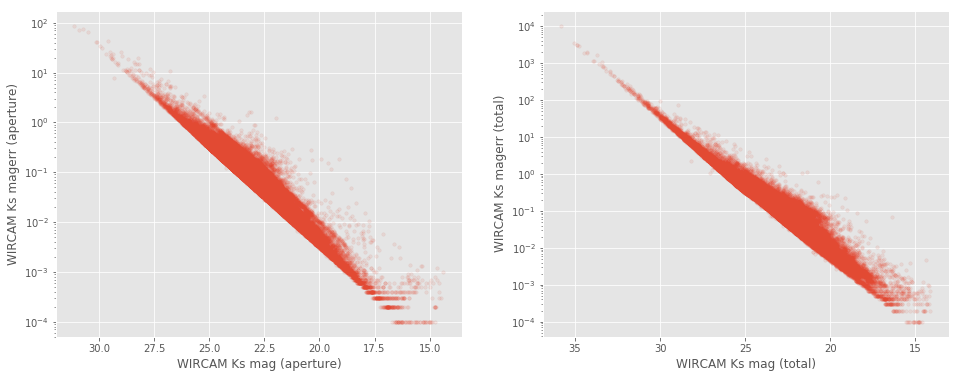

WIRCS K mag (aperture)
    Error max: 460
    magerr > 10: Number of objects = 10, min mag = 25.3
    magerr > 100: Number of objects = 8, min mag = 100.8
    magerr > 1000: Number of objects = 0, min mag = nan

WIRCS K mag (total)
    Error max: 957
    magerr > 10: Number of objects = 34, min mag = 25.0
    magerr > 100: Number of objects = 29, min mag = 100.8
    magerr > 1000: Number of objects = 0, min mag = nan



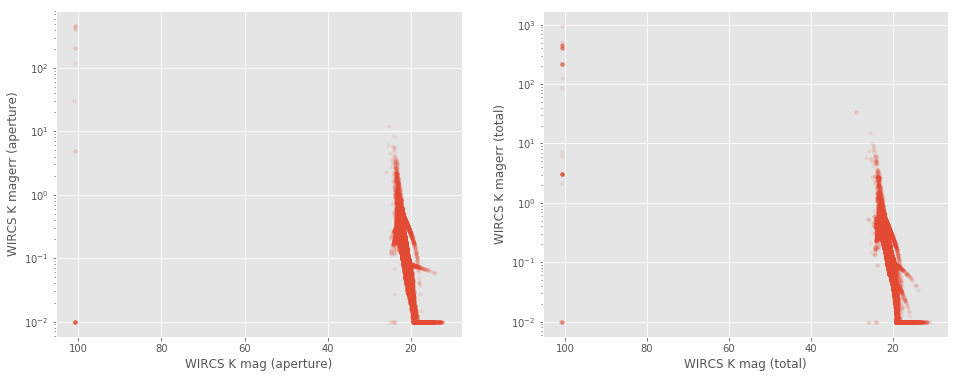

NEWFIRM K mag (aperture)
No sources have NEWFIRM K mag (aperture) values.

NEWFIRM K mag (total)
    Error max: 100712067
    magerr > 10: Number of objects = 2980, min mag = 16.6
    magerr > 100: Number of objects = 2640, min mag = 19.3
    magerr > 1000: Number of objects = 2566, min mag = 20.8



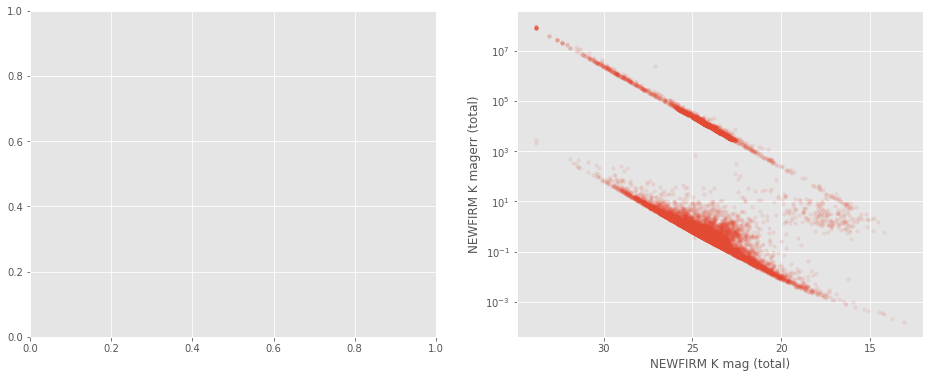

OMEGA2000 Ks mag (aperture)
No sources have OMEGA2000 Ks mag (aperture) values.

OMEGA2000 Ks mag (total)
    Error max: 2
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



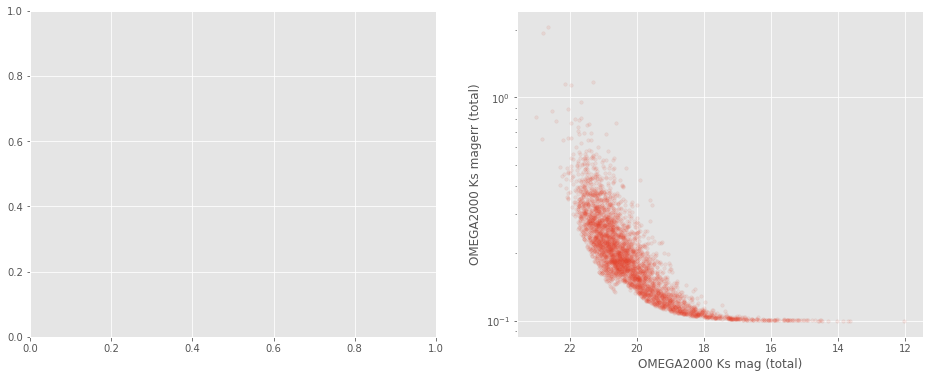

IRAC i1 mag (aperture)
No sources have IRAC i1 mag (aperture) values.

IRAC i1 mag (total)
    Error max: 889
    magerr > 10: Number of objects = 507, min mag = 24.4
    magerr > 100: Number of objects = 34, min mag = 30.2
    magerr > 1000: Number of objects = 0, min mag = nan



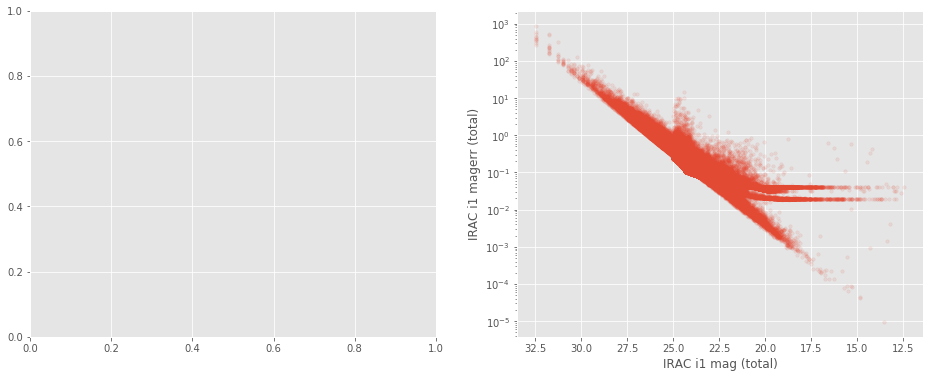

IRAC i2 mag (aperture)
No sources have IRAC i2 mag (aperture) values.

IRAC i2 mag (total)
    Error max: 687
    magerr > 10: Number of objects = 1305, min mag = 24.5
    magerr > 100: Number of objects = 113, min mag = 30.3
    magerr > 1000: Number of objects = 0, min mag = nan



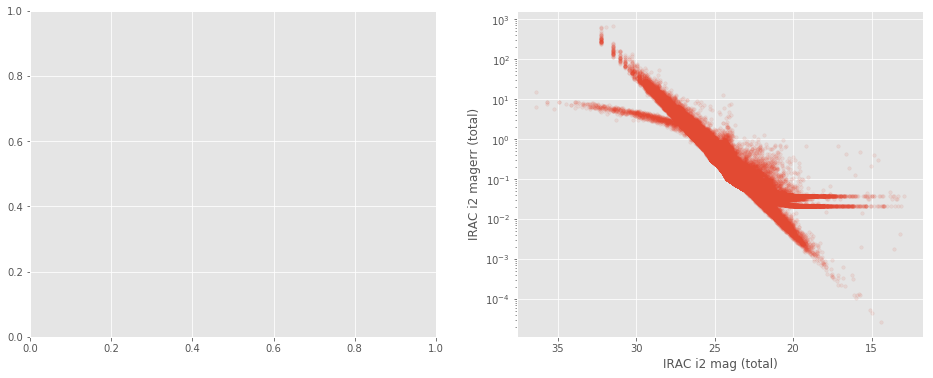

IRAC i3 mag (aperture)
No sources have IRAC i3 mag (aperture) values.

IRAC i3 mag (total)
    Error max: 6830
    magerr > 10: Number of objects = 2624, min mag = 22.9
    magerr > 100: Number of objects = 174, min mag = 25.3
    magerr > 1000: Number of objects = 2, min mag = 29.4



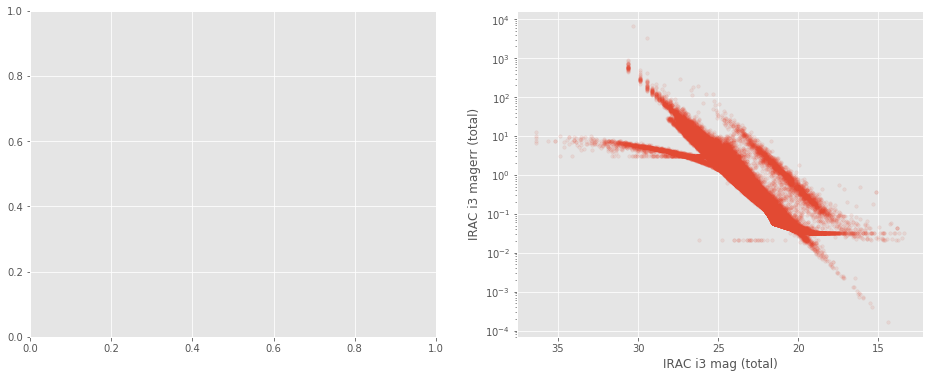

IRAC i4 mag (aperture)
No sources have IRAC i4 mag (aperture) values.

IRAC i4 mag (total)
    Error max: 3634
    magerr > 10: Number of objects = 2532, min mag = 23.1
    magerr > 100: Number of objects = 175, min mag = 25.8
    magerr > 1000: Number of objects = 3, min mag = 28.7



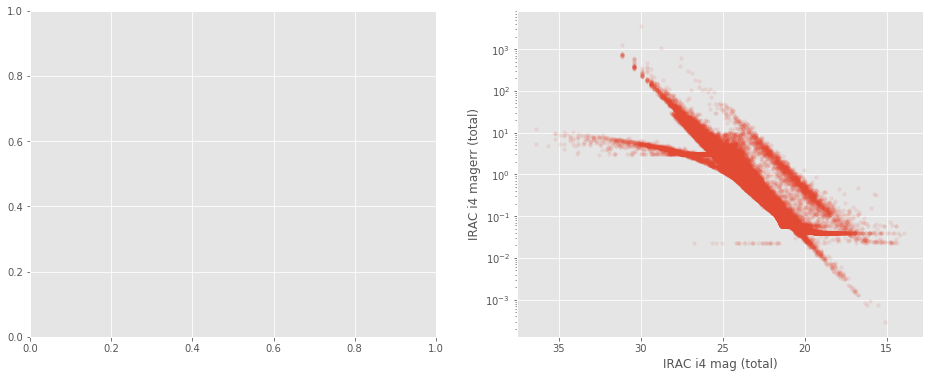

WFC3 F140W mag (aperture)
    Error max: 1436
    magerr > 10: Number of objects = 369, min mag = 23.2
    magerr > 100: Number of objects = 36, min mag = 26.6
    magerr > 1000: Number of objects = 3, min mag = 29.5

WFC3 F140W mag (total)
    Error max: 5509
    magerr > 10: Number of objects = 170, min mag = 23.5
    magerr > 100: Number of objects = 17, min mag = 27.0
    magerr > 1000: Number of objects = 2, min mag = 31.9



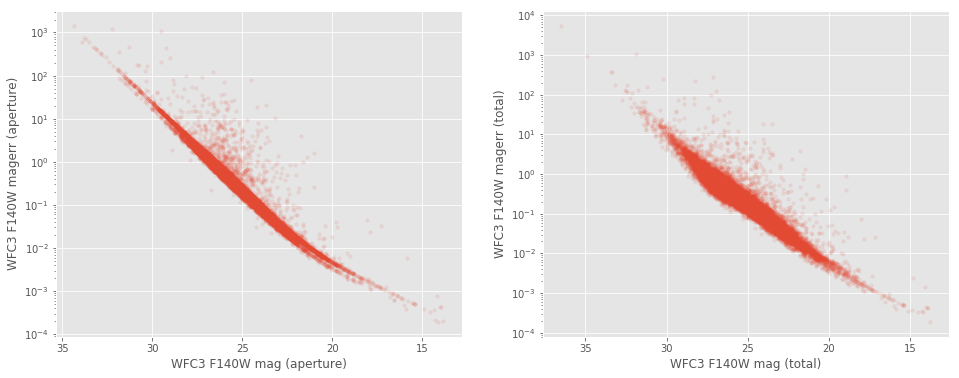

WFC3 F160W mag (aperture)
    Error max: 866
    magerr > 10: Number of objects = 153, min mag = 24.8
    magerr > 100: Number of objects = 15, min mag = 26.2
    magerr > 1000: Number of objects = 0, min mag = nan

WFC3 F160W mag (total)
    Error max: 700
    magerr > 10: Number of objects = 19, min mag = 25.7
    magerr > 100: Number of objects = 3, min mag = 26.9
    magerr > 1000: Number of objects = 0, min mag = nan



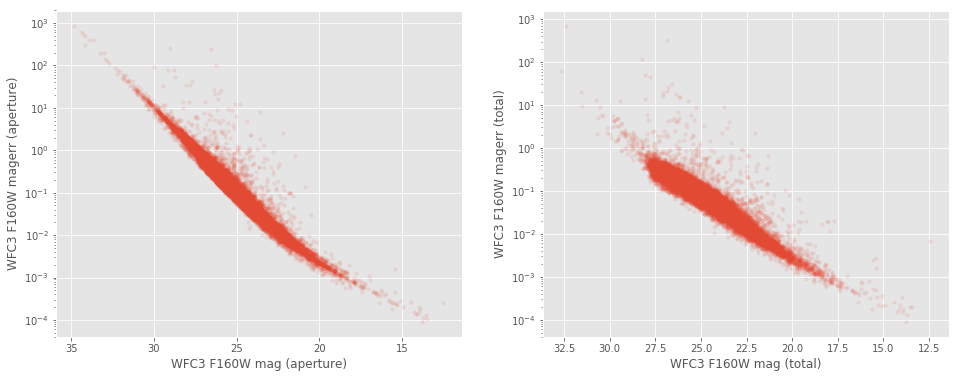

WFC3 F125W mag (aperture)
    Error max: 2010
    magerr > 10: Number of objects = 249, min mag = 23.8
    magerr > 100: Number of objects = 21, min mag = 25.4
    magerr > 1000: Number of objects = 1, min mag = 35.6

WFC3 F125W mag (total)
    Error max: 6608
    magerr > 10: Number of objects = 79, min mag = 23.9
    magerr > 100: Number of objects = 11, min mag = 26.0
    magerr > 1000: Number of objects = 3, min mag = 29.4



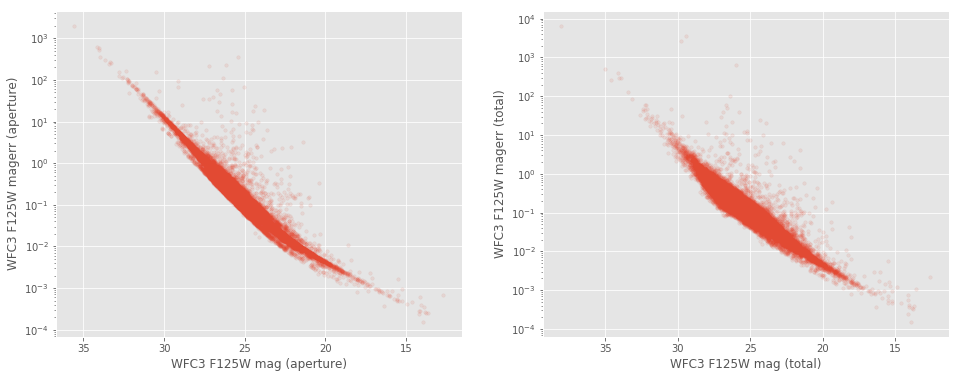

ACS F606W mag (aperture)
    Error max: 4194
    magerr > 10: Number of objects = 253, min mag = 30.0
    magerr > 100: Number of objects = 27, min mag = 32.5
    magerr > 1000: Number of objects = 4, min mag = 35.7

ACS F606W mag (total)
    Error max: 3225
    magerr > 10: Number of objects = 132, min mag = 29.8
    magerr > 100: Number of objects = 16, min mag = 32.9
    magerr > 1000: Number of objects = 2, min mag = 35.8



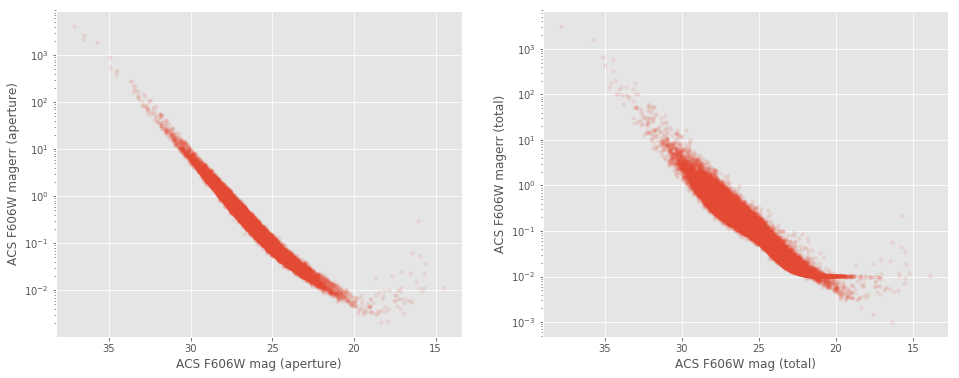

ACS F814W mag (aperture)
    Error max: 2904
    magerr > 10: Number of objects = 221, min mag = 29.4
    magerr > 100: Number of objects = 23, min mag = 31.9
    magerr > 1000: Number of objects = 3, min mag = 35.3

ACS F814W mag (total)
    Error max: 1119
    magerr > 10: Number of objects = 122, min mag = 29.5
    magerr > 100: Number of objects = 8, min mag = 32.2
    magerr > 1000: Number of objects = 1, min mag = 34.9



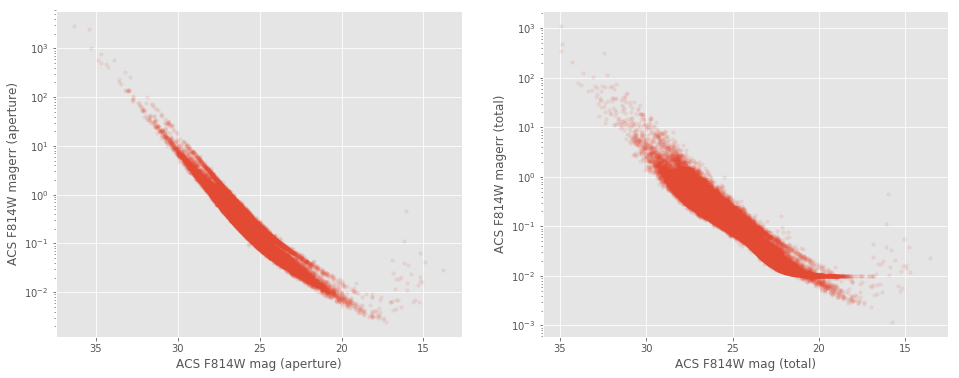

NEWFIRM J1 mag (aperture)
No sources have NEWFIRM J1 mag (aperture) values.

NEWFIRM J1 mag (total)
    Error max: 1609959421
    magerr > 10: Number of objects = 3268, min mag = 16.3
    magerr > 100: Number of objects = 2926, min mag = 16.3
    magerr > 1000: Number of objects = 2875, min mag = 16.3



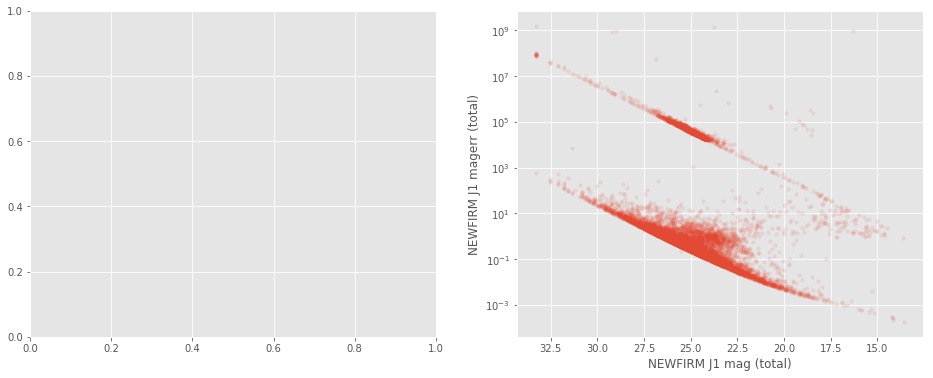

NEWFIRM J2 mag (aperture)
No sources have NEWFIRM J2 mag (aperture) values.

NEWFIRM J2 mag (total)
    Error max: 1065530641
    magerr > 10: Number of objects = 2841, min mag = 16.3
    magerr > 100: Number of objects = 2530, min mag = 18.4
    magerr > 1000: Number of objects = 2491, min mag = 21.2



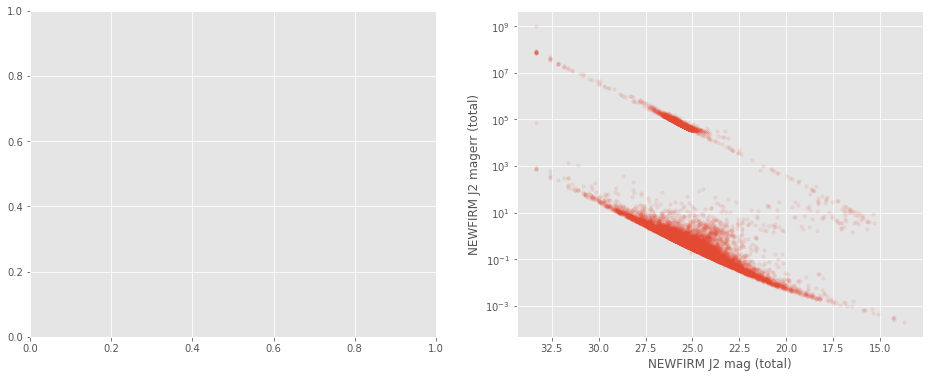

NEWFIRM J3 mag (aperture)
No sources have NEWFIRM J3 mag (aperture) values.

NEWFIRM J3 mag (total)
    Error max: 91061636
    magerr > 10: Number of objects = 2562, min mag = 16.3
    magerr > 100: Number of objects = 2271, min mag = 18.7
    magerr > 1000: Number of objects = 2232, min mag = 20.9



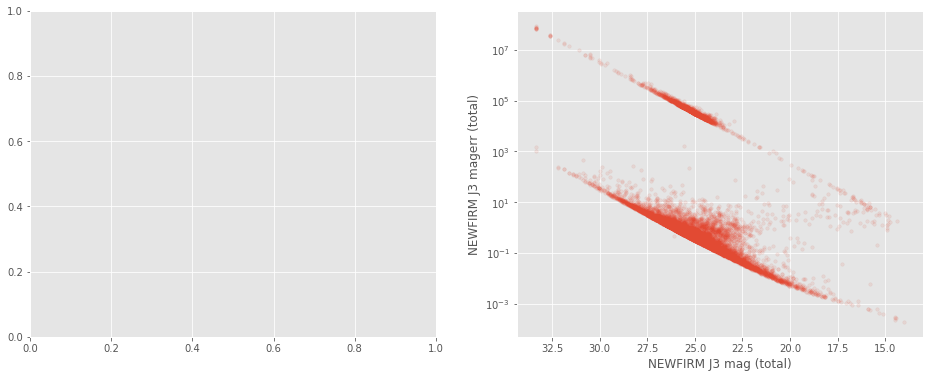

NEWFIRM H1 mag (aperture)
No sources have NEWFIRM H1 mag (aperture) values.

NEWFIRM H1 mag (total)
    Error max: 76933580618
    magerr > 10: Number of objects = 3393, min mag = 11.6
    magerr > 100: Number of objects = 3025, min mag = 11.6
    magerr > 1000: Number of objects = 2973, min mag = 11.6



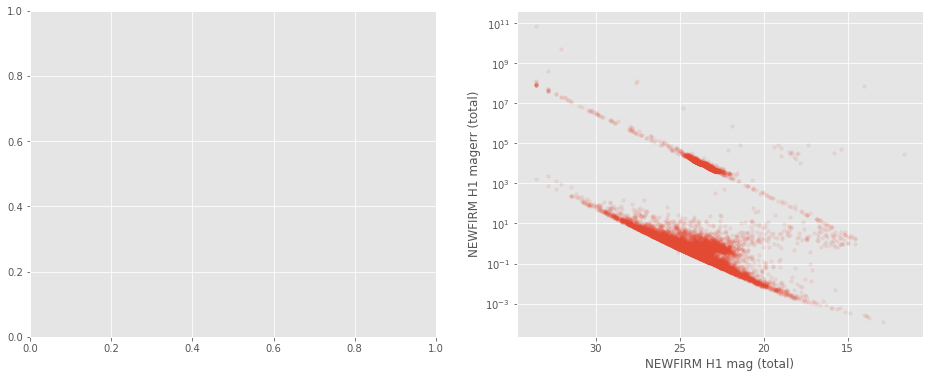

NEWFIRM H2 mag (aperture)
No sources have NEWFIRM H2 mag (aperture) values.

NEWFIRM H2 mag (total)
    Error max: 77054984
    magerr > 10: Number of objects = 3179, min mag = 16.7
    magerr > 100: Number of objects = 2870, min mag = 19.0
    magerr > 1000: Number of objects = 2826, min mag = 21.6



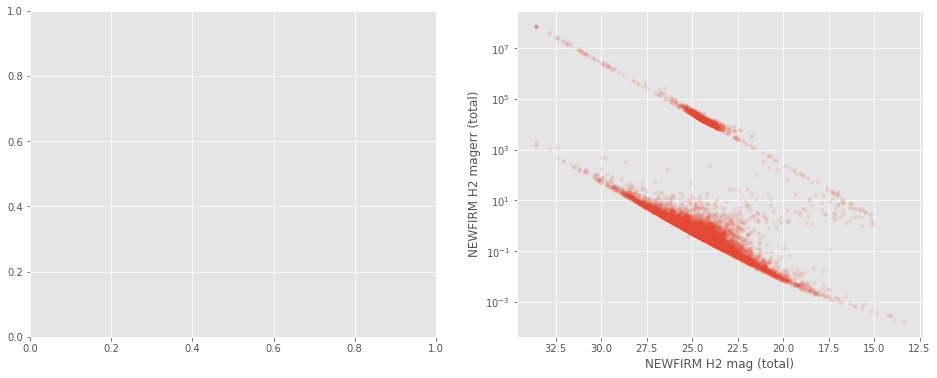

In [21]:
for mag in all_mags:
    
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))
        
    basecol = mag.replace(" ", "_").lower()
    
    if basecol == "megacam_u":
        savefig = True
    else:
        savefig=False
        
    col, ecol = "m_ap_{}".format(basecol), "merr_ap_{}".format(basecol)
    mag_vs_err(master_catalogue[col], master_catalogue[ecol], fig, ax1,
               labels=("{} mag (aperture)".format(mag), "{} magerr (aperture)".format(mag)), savefig=False)

    
    col, ecol = "m_{}".format(basecol), "merr_{}".format(basecol)
    mag_vs_err(master_catalogue[col], master_catalogue[ecol], fig, ax2,
               labels=("{} mag (total)".format(mag), "{} magerr (total)".format(mag)), savefig=savefig)
    
    display(fig)
    plt.close()


## 2. Magnitude and error issues

In [33]:
def flag_mag(mask, x1, y1, x2, y2, mask2=None, x3=None, y3=None, mask3=None,
             labels1=("x", "y"), labels2=("x", "y"), labels3=("x", "y"), nb=2,
             irac=False, savefig=False):

    if nb == 1 and not irac:
        fig, (ax1) = plt.subplots(ncols=1, figsize=(6, 6))
    elif nb == 2 or (nb == 1 and irac and x3 is None):
        fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))
    elif nb > 2 or (nb == 1 and x3 is not None):
        fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(16, 6))
    
    # mag vs magerr
    ax1.set_yscale('log')    # to place before scatter to avoid issues
    ax1.scatter(x1, y1, marker='.', alpha=0.1, s=50)
    ax1.plot(x1[mask], y1[mask], 'b.')
    if mask2 is not None and nb >= 2:
        ax1.plot(x1[mask2], y1[mask2], 'g.')
    ax1.invert_xaxis()
    ax1.set_xlabel(labels1[0])
    ax1.set_ylabel(labels1[1])
    
    if nb == 1 and irac:
        # IRAC mag
        ax2.set_yscale('log')    # to place before scatter to avoid issues
        ax2.scatter(x2, y2, marker='.', alpha=0.1, s=50)
        ax2.plot(x2[mask2], y2[mask2], 'b.')
        ax2.invert_xaxis()
        ax2.set_xlabel(labels2[0])
        ax2.set_ylabel(labels2[1])
        
    if nb == 1 and x3 is not None:
        # IRAC mag with i3
        ax3.set_yscale('log')    # to place before scatter to avoid issues
        ax3.scatter(x3, y3, marker='.', alpha=0.1, s=50)
        ax3.plot(x3[mask3], y3[mask3], 'b.')
        ax3.invert_xaxis()
        ax3.set_xlabel(labels3[0])
        ax3.set_ylabel(labels3[1])
    
    # Comparing magnitudes
    if nb >= 2:
        ax2.scatter(x2, y2, marker='.', alpha=0.1, s=50)
        ax2.plot(x2[mask], y2[mask], 'b.')
        if mask2 is not None:
            ax2.plot(x2[mask2], y2[mask2], 'g.')
        ax2.invert_xaxis()
        ax2.invert_yaxis()
        ax2.set_xlabel(labels2[0])
        ax2.set_ylabel(labels2[1])
    
    if nb >= 3:
        ax3.scatter(x3, y3, marker='.', alpha=0.1, s=50)
        ax3.plot(x3[mask], y3[mask], 'b.')
        if mask2 is not None:
            ax3.plot(x3[mask2], y3[mask2], 'g.')
        ax3.invert_xaxis()
        ax3.invert_yaxis()
        ax3.set_xlabel(labels3[0])
        ax3.set_ylabel(labels3[1])
    
    # Save ex. fig
    if savefig:
        survey_label = ((labels1[0].replace(" ", "_")).replace("(", "")).replace(")", "")
        if "GPC1 " in labels1[0]:
            figname = field + "_gpc1Issues_" + survey_label + ".png"
        elif "DECam" in labels1[0]:
            figname = field + "_decamIssues_" + survey_label + ".png"
        elif "IRAC" in labels1[0]:
            figname = field + "_iracIssues_i1_i2.png"
        elif "WIRCS" in labels1[0]:
            figname = field + "_wircsIssues.png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')
        
    display(fig)
    plt.close()

### 2.a Pan-STARRS Aperture and Total magnitudes

GPC1 g
   Number of flagged objects: 34


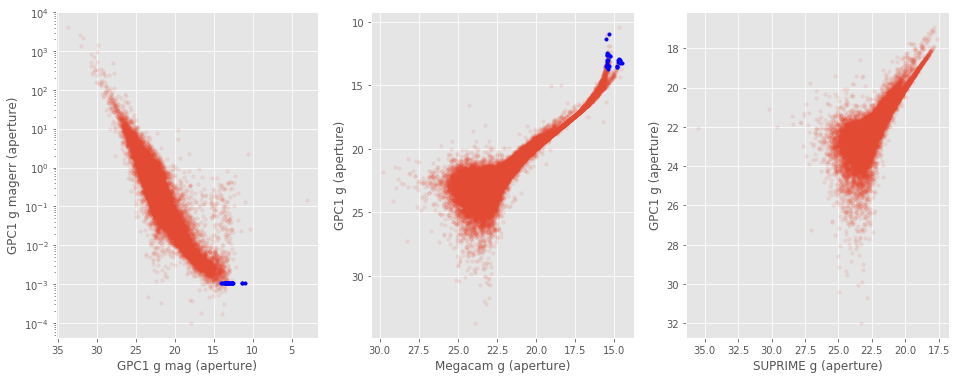

GPC1 r
   Number of flagged objects: 56


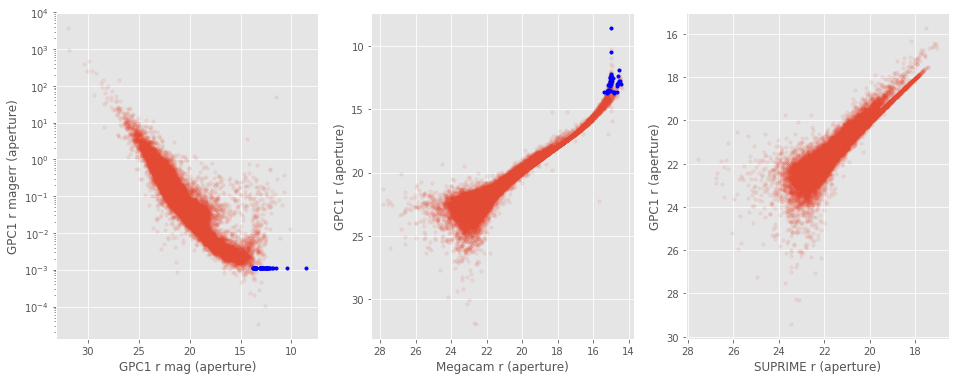

GPC1 i
   Number of flagged objects: 53


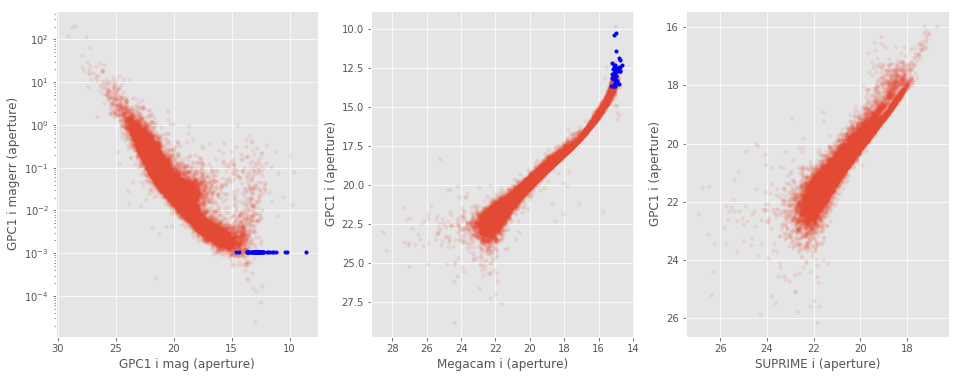

GPC1 z
   Number of flagged objects: 37


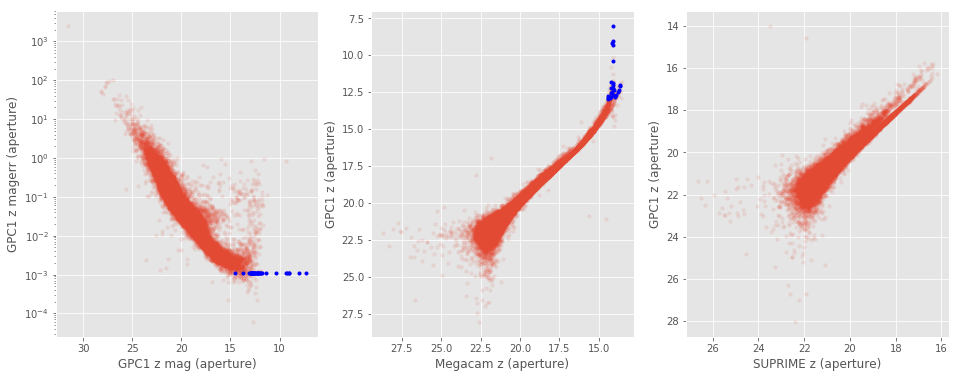

GPC1 y
   Number of flagged objects: 16


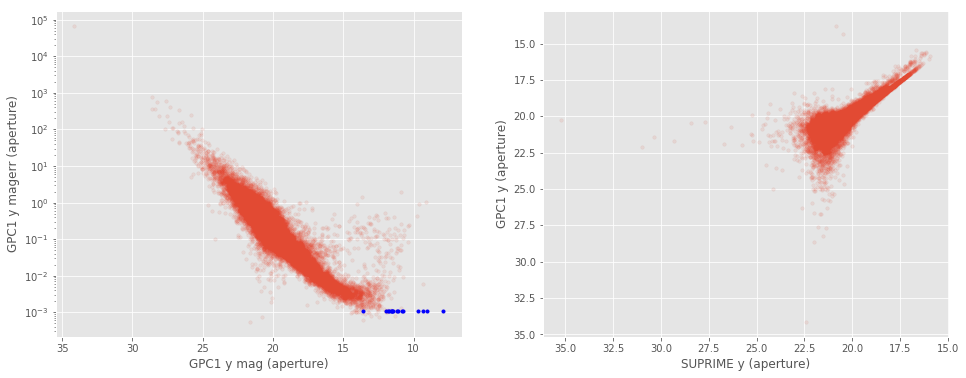

In [32]:
# PanSTARRS forced photometry catalogue
ps1_err = 0.0010860000038519502

bands = ['g', 'r', 'i', 'z', 'y']

for i, surveys in enumerate([g_bands, r_bands, i_bands, z_bands, y_bands]):
    surveys.insert(0, surveys.pop(surveys.index('GPC1 '+ bands[i])))
    print(surveys[0])
    
    if len(surveys) == 1:
        basecol1 = surveys[0].replace(" ", "_").lower()
        col1 = "m_ap_{}".format(basecol1)
        x2, labels2 = None, None
    else:
        basecol1, basecol2 = surveys[0].replace(" ", "_").lower(), surveys[1].replace(" ", "_").lower()
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
        x2 = master_catalogue[col2]
        labels2 = ("{} (aperture)".format(surveys[1]), "{} (aperture)".format(surveys[0]))
    ecol1 = "merr_ap_{}".format(basecol1)
    
    if len(surveys) >= 3:
        basecol3 = surveys[2].replace(" ", "_").lower()
        col3 = "m_ap_{}".format(basecol3)
        x3, y3 = master_catalogue[col3], master_catalogue[col1]
        labels3 = ("{} (aperture)".format(surveys[2]), "{} (aperture)".format(surveys[0]))
    else:
        x3, y3, labels3 = None, None, None
        
    if basecol1 == 'gpc1_g':
        savefig = True
    else:
        savefig = False

        
    mask = np.where(master_catalogue[ecol1] == ps1_err)    
    print ('   Number of flagged objects:', len(master_catalogue[ecol1][mask]))

    flag_mag(mask, master_catalogue[col1], master_catalogue[ecol1],
                    x2, master_catalogue[col1], 
                    x3=x3, y3=y3,
                    labels1=("{} mag (aperture)".format(surveys[0]), "{} magerr (aperture)".format(surveys[0])),
                    labels2=labels2,
                    labels3=labels3, nb=len(surveys), savefig=savefig)

### 2.d WIRCS K magnitude

/data/vault/epons/conda_envs/herschelhelp_internal/lib/python3.6/site-packages/astropy/table/column.py:929: RuntimeWarning: invalid value encountered in greater_equal
  return getattr(self.data, oper)(other)


WIRCS Ks, aperture mag: Number of flagged objects: 26
WIRCS Ks, total mag: Number of flagged objects: 58


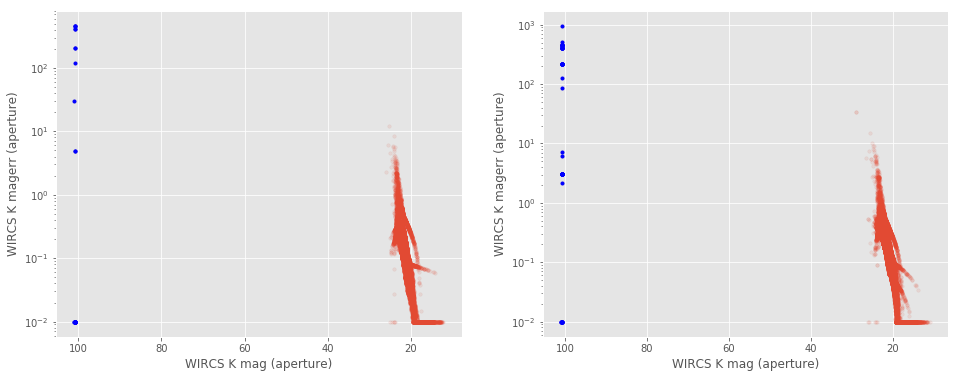

In [34]:
wircs_mag = 100.0

bands = ["WIRCS K"]
    
basecol = bands[0].replace(" ", "_").lower()
col1, col2 = "m_ap_{}".format(basecol), "m_{}".format(basecol)
ecol1, ecol2 = "merr_ap_{}".format(basecol), "merr_{}".format(basecol)
    
mask1 = np.where(master_catalogue[col1] >= wircs_mag)[0]   
print ('WIRCS Ks, aperture mag: Number of flagged objects:', len(master_catalogue[col1][mask1]))

mask2 = np.where(master_catalogue[col2] >= wircs_mag)[0]  
print ('WIRCS Ks, total mag: Number of flagged objects:', len(master_catalogue[col2][mask2]))

flag_mag(mask1, master_catalogue[col1], master_catalogue[ecol1],
         master_catalogue[col2], master_catalogue[ecol2], mask2=mask2,
         labels1=("{} mag (aperture)".format(bands[0]), "{} magerr (aperture)".format(bands[0])),
         labels2=("{} mag (aperture)".format(bands[0]), "{} magerr (aperture)".format(bands[0])),
         nb=1, irac=True, savefig=True)



## 3/ Outliers

$$chi^2 = \frac{(mag_{1}-mag_{2})^2}{magerr_{1}^2 + magerr_{2}^2}$$ 
<br>
__Interquartile range (IQR) and outliers:__<br>
We consider as outliers objects which have a high $chi^2$, about $5\sigma$ away from the mean.<br>
$25th, 75th \;percentile = 0.6745\sigma$<br>
$IQR = (75th \;percentile - 25th \;percentile) = 0.6745\sigma * 2 = 1.349\sigma$<br>
$75th \;percentile + 3.2\times IQR = 0.6745\sigma + 3.2\times1.349\sigma = 5\sigma$
<br><br>
$$outliers == [chi^2 >  (75th \;percentile + 3.2\times (75th \;percentile - 25th \;percentile))]$$
<br><br>
__NB:__<br>
Bright sources tend to have their errors underestimated with values as low as $10^{-6}$, which is unrealistic. So to avoid high $chi^2$ due to unrealistic small errors, we clip the error to get a minimum value of 0.1% (i.e. all errors smaller then $10^{-3}$ are set to $10^{-3}$).

In [35]:
def outliers(x, y, xerr, yerr, labels=["x", "y"], savefig=False):
    
    import matplotlib
    import matplotlib.gridspec as gridspec
    from astropy import visualization as vz
    
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :-1])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    ax3 = plt.subplot(gs2[:, -1], sharey=ax2)

    
    # Use only finite values
    #mask = np.isfinite(x) & np.isfinite(y) & np.isfinite(xerr) & np.isfinite(yerr)
    mask = np.isfinite(x) & np.isfinite(y) & np.isfinite(xerr) & np.isfinite(yerr) & (x<100) & (y<100)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
    xerr = np.copy(xerr[mask])
    yerr = np.copy(yerr[mask])
    
    # mag1 - mag2
    diff = y - x

    x_label, y_label = labels
    
    # If the difference is all NaN there is nothing to compare.
    if np.isnan(diff).all():
        print("No sources have both {} and {} values.".format(
            x_label, y_label))
        print("")
        return
    
    # Set the minimum error to 10^-3
    np.clip(xerr, 1e-3, np.max(xerr), out=xerr)
    np.clip(yerr, 1e-3, np.max(yerr), out=yerr)

    # Median, Median absolute deviation and 1% and 99% percentiles
    diff_median = np.median(diff)
    diff_mad = np.median(np.abs(diff - diff_median))
    diff_1p, diff_99p = np.percentile(diff, [1., 99.])
    diff_25p, diff_75p = np.percentile(diff, [25., 75.])
    
    
    diff_label = "{} - {}".format(y_label, x_label)

    print("{} ({} sources):".format(diff_label, len(x)))
    print("- Median: {:.2f}".format(diff_median))
    print("- Median Absolute Deviation: {:.2f}".format(diff_mad))
    print("- 1% percentile: {}".format(diff_1p))
    print("- 99% percentile: {}".format(diff_99p))

    
    # Chi2 (Normalized difference)   
    ichi2 = np.power(diff, 2) / (np.power(xerr, 2) + np.power(yerr, 2))
    
    # Use only non-null values of ichi2
    mask2 = ichi2 != 0.0
    diff, ichi2 = np.copy(diff[mask2]), np.copy(ichi2[mask2])
    x, y, xerr, yerr = np.copy(x[mask2]), np.copy(y[mask2]), np.copy(xerr[mask2]), np.copy(yerr[mask2])

    # Outliers (5sigma)
    log_ichi2_25p, log_ichi2_75p = np.percentile(np.log10(ichi2), [25., 75.])
    out_lim = log_ichi2_75p + 3.2*abs(log_ichi2_25p-log_ichi2_75p)
    
    outliers = np.log10(ichi2) > out_lim 
    nb_outliers = len(x[outliers])
    
    print("Outliers separation: log(chi2) = {:.2f}".format(out_lim))
    print("Number of outliers: {}".format(nb_outliers))

    print("")

    # Comparing mag
    ax1.scatter(x, y, marker='.', alpha=0.1, s=50)
    ax1.scatter(x[outliers], y[outliers], marker='.', c='b', alpha=0.3, s=50, label='Outliers ({})'.format(nb_outliers))
    min_val = np.min(np.r_[x, y])
    max_val = np.max(np.r_[x, y])
    ax1.autoscale(False)
    ax1.plot([min_val, max_val], [min_val, max_val], "k:")
    ax1.invert_xaxis()
    ax1.invert_yaxis()
    ax1.set_xlabel(x_label)
    ax1.set_ylabel(y_label)
    ax1.legend(loc='lower right', numpoints=1)
    

    # Chi2 vs Diff
    #ax1.set_yscale('log')    # to place before scatter to avoid issues
    ax2.scatter(diff, np.log10(ichi2), marker='.', alpha=0.1, s=50)
    if nb_outliers != 0:
        ax2.scatter(diff[outliers], np.log10(ichi2[outliers]), marker='.', alpha=0.3, s=50, color='b',\
                    label='Outliers ({})'.format(nb_outliers))
    ax2.axhline(out_lim, color='grey', linestyle=':')
    ax2.set_xlabel(diff_label)
    ax2.set_ylabel('log(chi2)')
    ax2.legend(loc='lower right', numpoints=1)
    
    # Hist
    n, bins, patches = vz.hist(np.log10(ichi2), ax=ax3, bins='knuth', facecolor='red', lw = 2, alpha=0.5,\
                                   orientation="horizontal")
    if nb_outliers > 3:
        n, bins, patches = vz.hist(np.log10(ichi2[outliers]), ax=ax3, bins='knuth', facecolor='b', lw = 2, alpha=0.7,\
                                   orientation="horizontal")
    ax3.axhline(out_lim, color='grey', linestyle=':')
    ax3.yaxis.set_tick_params(labelleft=False)
    
    # Save ex. fig
    if savefig:
        survey_label = ((diff_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_outliers_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')


    display(fig)
    plt.close()

/data/vault/epons/conda_envs/herschelhelp_internal/lib/python3.6/site-packages/astropy/table/column.py:929: RuntimeWarning: invalid value encountered in less
  return getattr(self.data, oper)(other)


No sources have both Megacam u (aperture) and MMT u (aperture) values.

MMT u (total) - Megacam u (total) (100371 sources):
- Median: 0.25
- Median Absolute Deviation: 0.32
- 1% percentile: -3.2728607355774866
- 99% percentile: 3.409961629999195
Outliers separation: log(chi2) = 6.38
Number of outliers: 1980



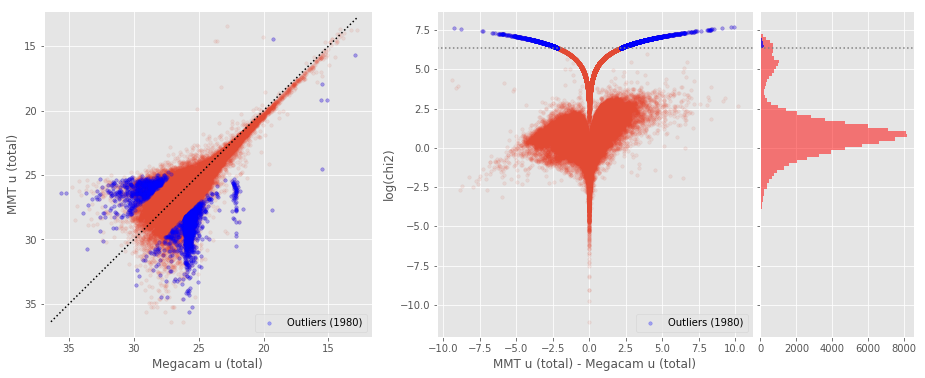

Megacam g (aperture) - GPC1 g (aperture) (51316 sources):
- Median: 0.28
- Median Absolute Deviation: 0.32
- 1% percentile: -2.2309391975402835
- 99% percentile: 2.947250843048094
Outliers separation: log(chi2) = 6.78
Number of outliers: 3



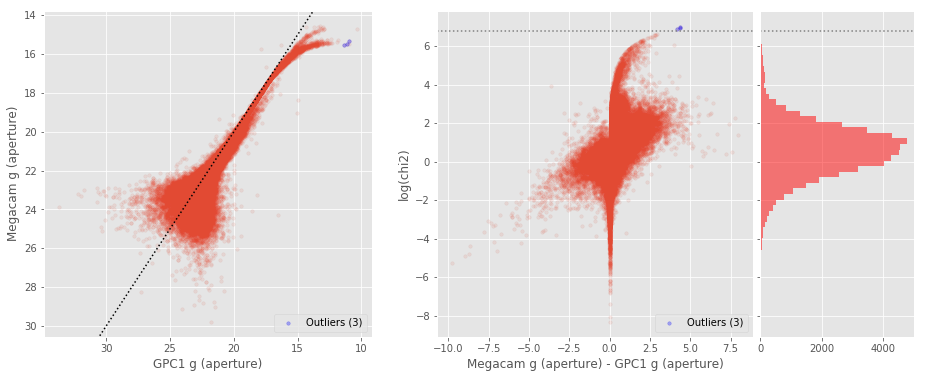

Megacam g (total) - GPC1 g (total) (51670 sources):
- Median: 0.01
- Median Absolute Deviation: 0.27
- 1% percentile: -1.7023037338256837
- 99% percentile: 2.972661113739013
Outliers separation: log(chi2) = 5.25
Number of outliers: 78



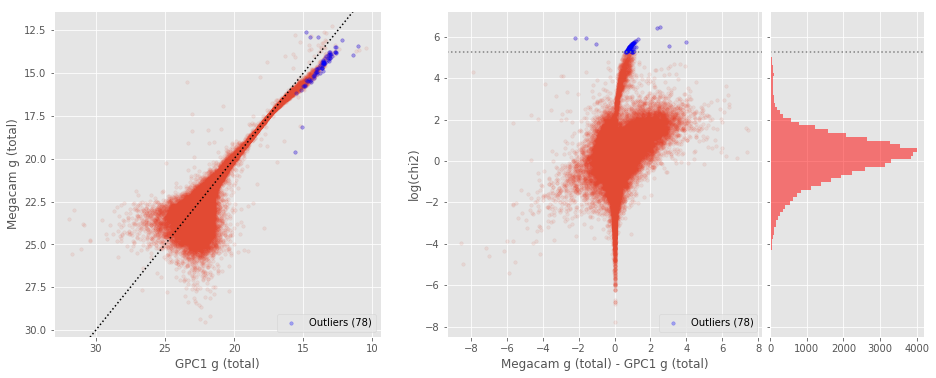

SUPRIME g (aperture) - GPC1 g (aperture) (17284 sources):
- Median: 0.37
- Median Absolute Deviation: 0.42
- 1% percentile: -2.291838264465332
- 99% percentile: 3.1368252754211428
Outliers separation: log(chi2) = 6.82
Number of outliers: 0



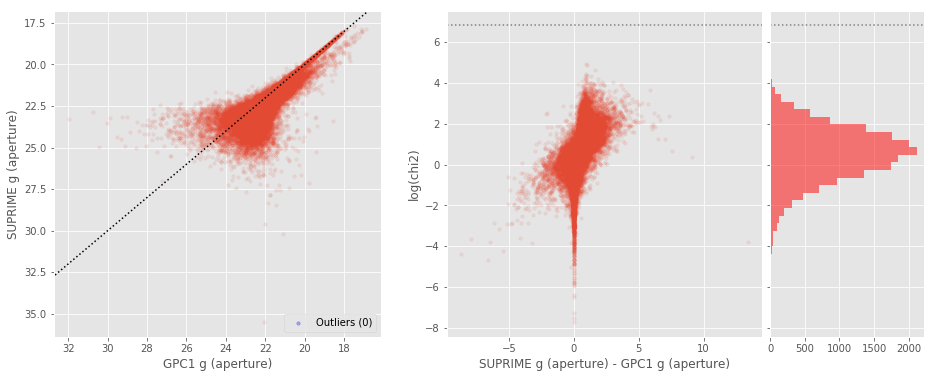

SUPRIME g (total) - GPC1 g (total) (17427 sources):
- Median: 0.10
- Median Absolute Deviation: 0.31
- 1% percentile: -1.6446651077270509
- 99% percentile: 3.2804692077636775
Outliers separation: log(chi2) = 5.44
Number of outliers: 0



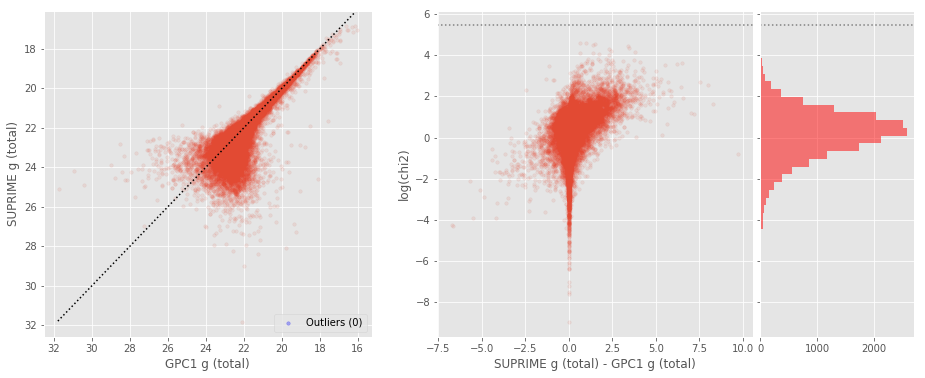

BASS g (aperture) - GPC1 g (aperture) (46104 sources):
- Median: 0.16
- Median Absolute Deviation: 0.29
- 1% percentile: -2.3205015373229982
- 99% percentile: 4.473019647598266
Outliers separation: log(chi2) = 5.90
Number of outliers: 187



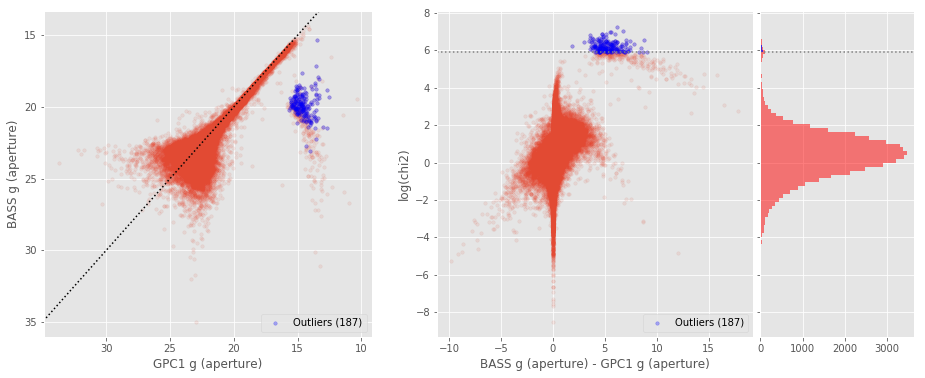

BASS g (total) - GPC1 g (total) (46871 sources):
- Median: 0.02
- Median Absolute Deviation: 0.27
- 1% percentile: -1.8934118270874025
- 99% percentile: 3.1747922897338956
Outliers separation: log(chi2) = 5.32
Number of outliers: 54



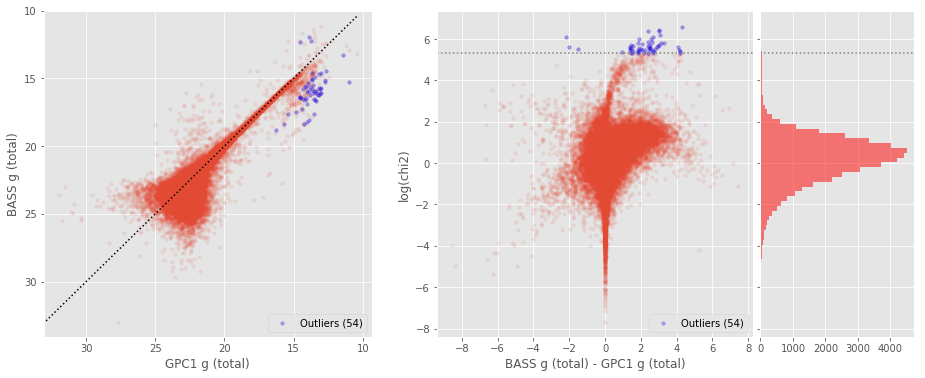

No sources have both GPC1 g (aperture) and MMT g (aperture) values.

MMT g (total) - GPC1 g (total) (7146 sources):
- Median: 0.12
- Median Absolute Deviation: 0.30
- 1% percentile: -1.5742402814634908
- 99% percentile: 3.0949938687719176
Outliers separation: log(chi2) = 5.35
Number of outliers: 4



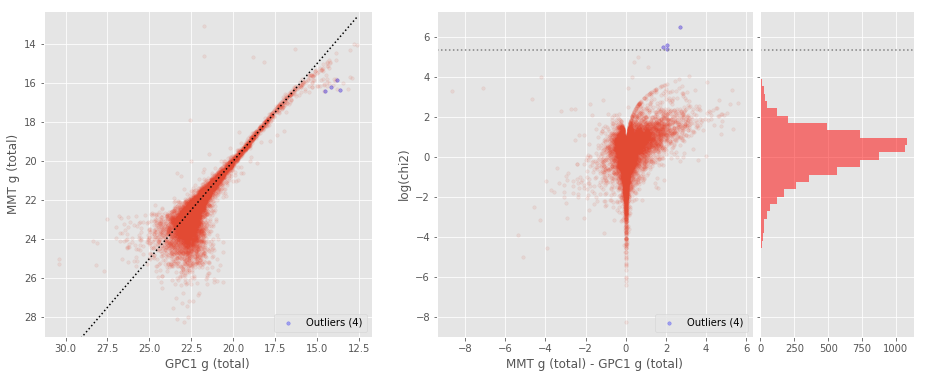

SUPRIME g (aperture) - Megacam g (aperture) (310245 sources):
- Median: -0.03
- Median Absolute Deviation: 0.16
- 1% percentile: -1.2310950469970703
- 99% percentile: 1.737319641113281
Outliers separation: log(chi2) = 4.70
Number of outliers: 99



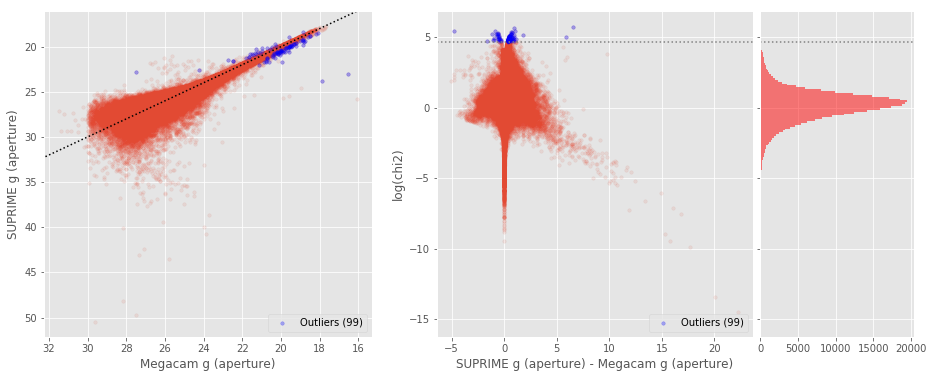

SUPRIME g (total) - Megacam g (total) (284153 sources):
- Median: 0.04
- Median Absolute Deviation: 0.23
- 1% percentile: -1.9584777069091797
- 99% percentile: 2.3146370697021394
Outliers separation: log(chi2) = 5.18
Number of outliers: 45



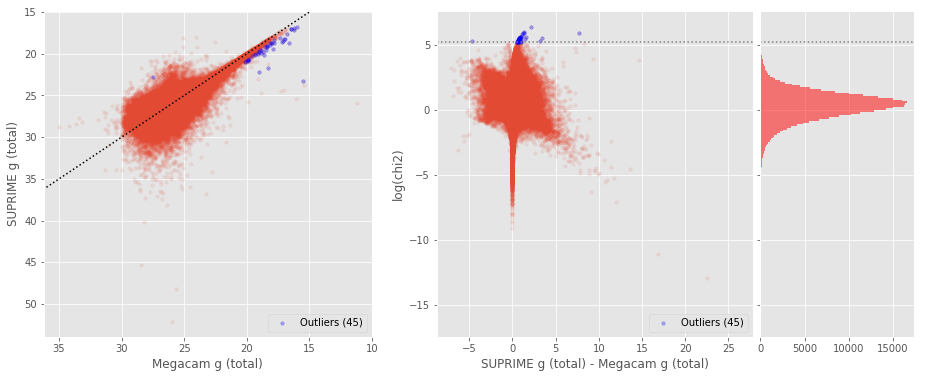

BASS g (aperture) - Megacam g (aperture) (148099 sources):
- Median: -0.07
- Median Absolute Deviation: 0.16
- 1% percentile: -1.1429281997680663
- 99% percentile: 1.9096522521972639
Outliers separation: log(chi2) = 5.22
Number of outliers: 438



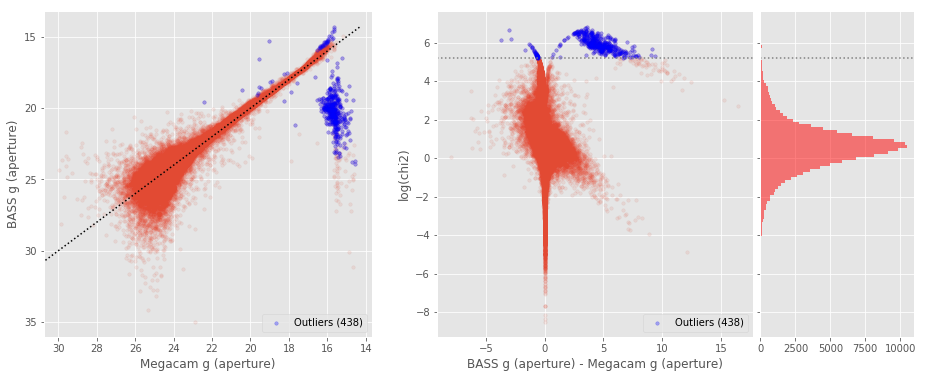

BASS g (total) - Megacam g (total) (150086 sources):
- Median: 0.04
- Median Absolute Deviation: 0.14
- 1% percentile: -1.4339696884155273
- 99% percentile: 1.3585274696350096
Outliers separation: log(chi2) = 4.66
Number of outliers: 425



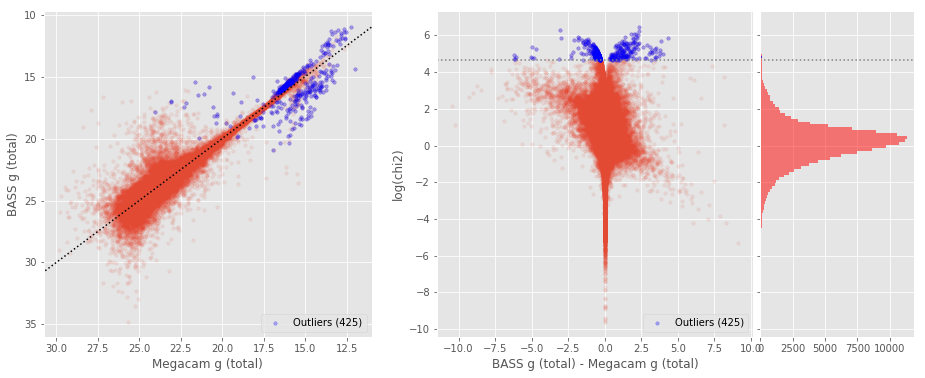

No sources have both Megacam g (aperture) and MMT g (aperture) values.

MMT g (total) - Megacam g (total) (100963 sources):
- Median: 0.24
- Median Absolute Deviation: 0.19
- 1% percentile: -2.1791828663102693
- 99% percentile: 2.3286005087663084
Outliers separation: log(chi2) = 5.15
Number of outliers: 2602



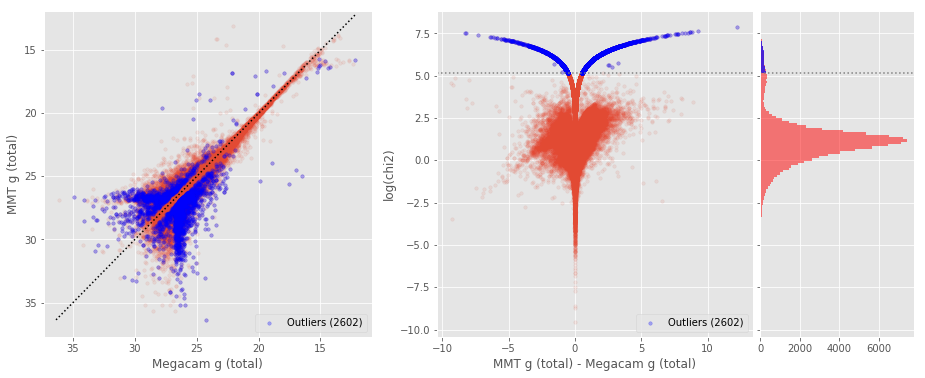

BASS g (aperture) - SUPRIME g (aperture) (57686 sources):
- Median: -0.05
- Median Absolute Deviation: 0.22
- 1% percentile: -1.5654241561889648
- 99% percentile: 1.614810657501221
Outliers separation: log(chi2) = 5.60
Number of outliers: 11



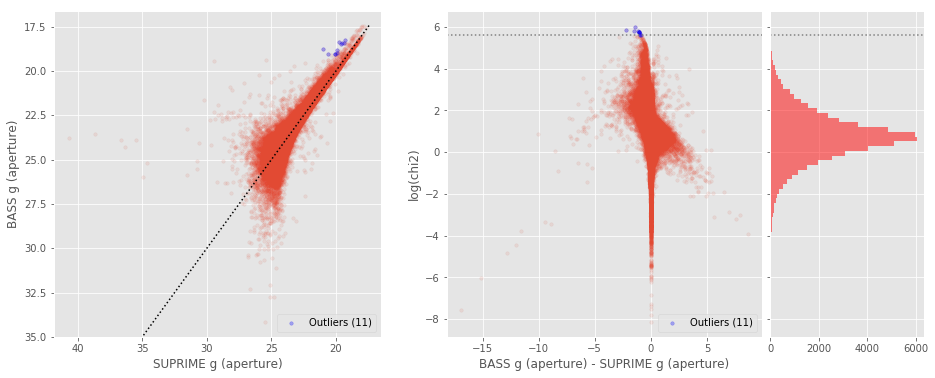

BASS g (total) - SUPRIME g (total) (57794 sources):
- Median: 0.01
- Median Absolute Deviation: 0.16
- 1% percentile: -1.962066135406494
- 99% percentile: 1.1228723907470701
Outliers separation: log(chi2) = 5.08
Number of outliers: 23



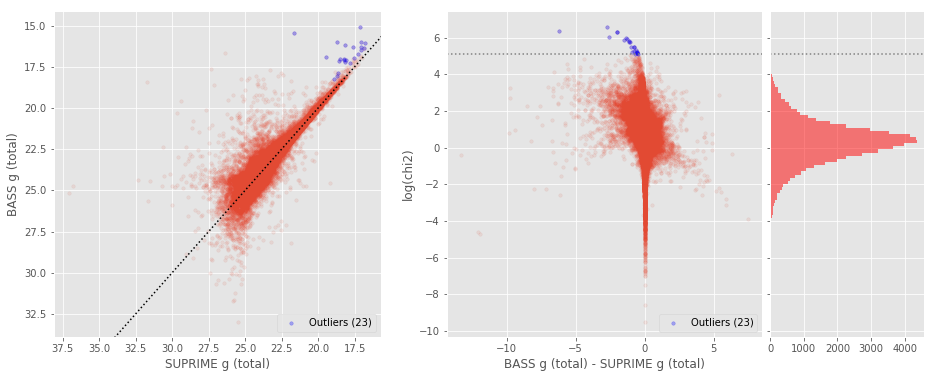

No sources have both SUPRIME g (aperture) and MMT g (aperture) values.

MMT g (total) - SUPRIME g (total) (61314 sources):
- Median: 0.15
- Median Absolute Deviation: 0.22
- 1% percentile: -2.3145910038291477
- 99% percentile: 2.096782485539089
Outliers separation: log(chi2) = 4.84
Number of outliers: 2



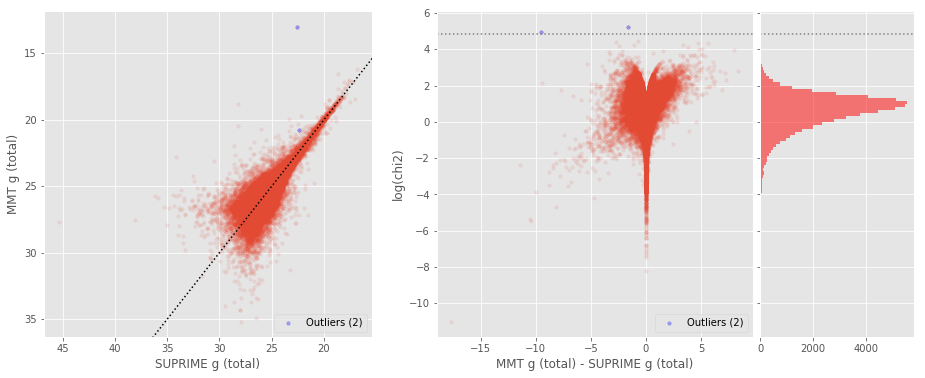

No sources have both BASS g (aperture) and MMT g (aperture) values.

MMT g (total) - BASS g (total) (22890 sources):
- Median: 0.10
- Median Absolute Deviation: 0.16
- 1% percentile: -1.095342900827938
- 99% percentile: 1.258911388463151
Outliers separation: log(chi2) = 4.93
Number of outliers: 8



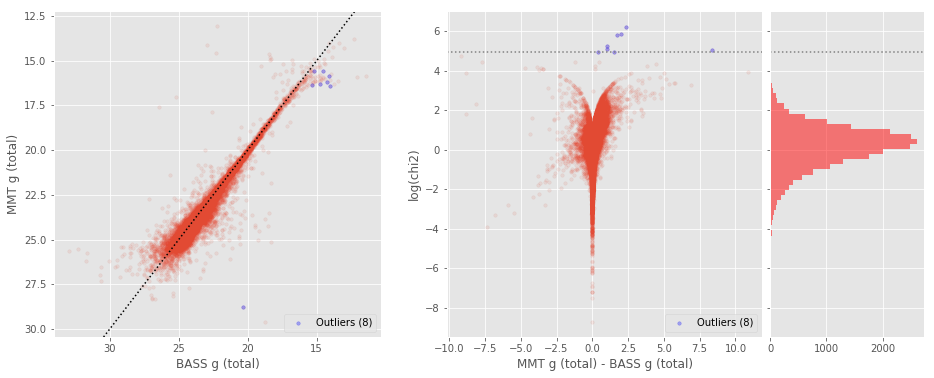

Megacam r (aperture) - GPC1 r (aperture) (53831 sources):
- Median: 0.17
- Median Absolute Deviation: 0.17
- 1% percentile: -1.2671497344970704
- 99% percentile: 1.625689983367918
Outliers separation: log(chi2) = 6.20
Number of outliers: 29



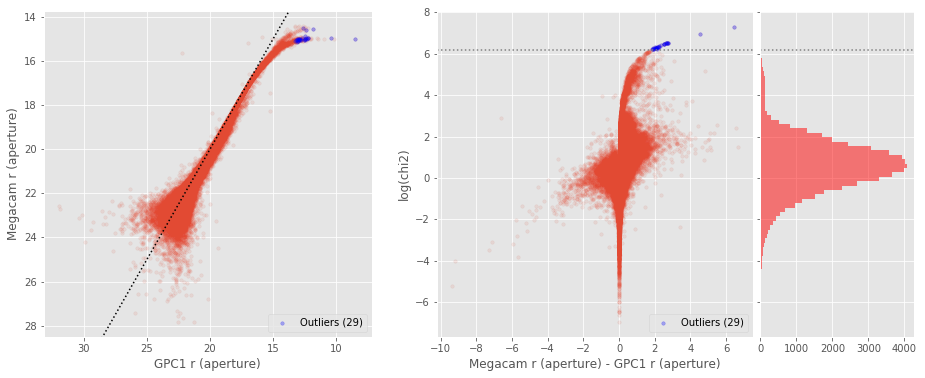

Megacam r (total) - GPC1 r (total) (53870 sources):
- Median: -0.08
- Median Absolute Deviation: 0.14
- 1% percentile: -1.002986240386963
- 99% percentile: 1.6144099235534644
Outliers separation: log(chi2) = 4.90
Number of outliers: 106



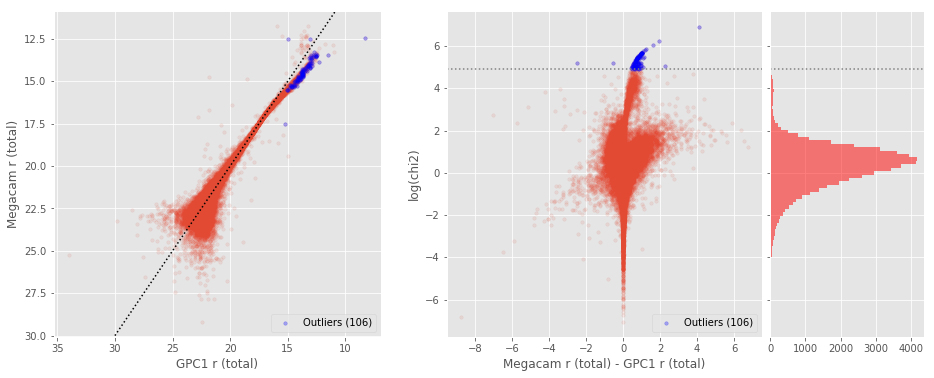

SUPRIME r (aperture) - GPC1 r (aperture) (18236 sources):
- Median: 0.20
- Median Absolute Deviation: 0.25
- 1% percentile: -1.2223506927490235
- 99% percentile: 1.6523344993591438
Outliers separation: log(chi2) = 6.18
Number of outliers: 0



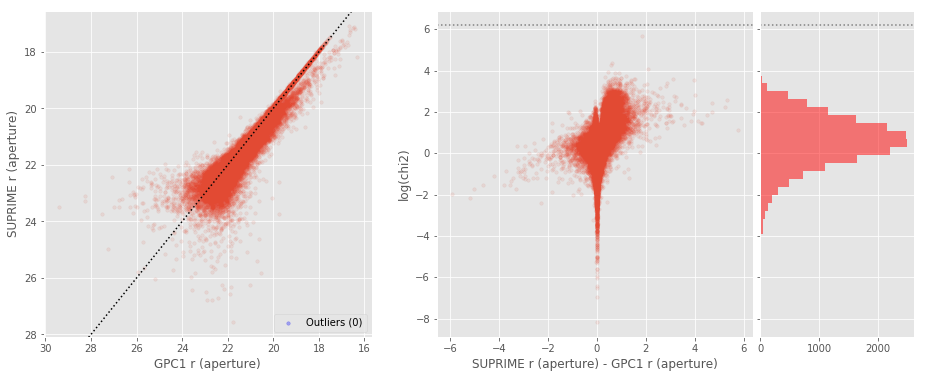

SUPRIME r (total) - GPC1 r (total) (13140 sources):
- Median: -0.09
- Median Absolute Deviation: 0.15
- 1% percentile: -0.9431807708740234
- 99% percentile: 1.8134276199340826
Outliers separation: log(chi2) = 4.82
Number of outliers: 0



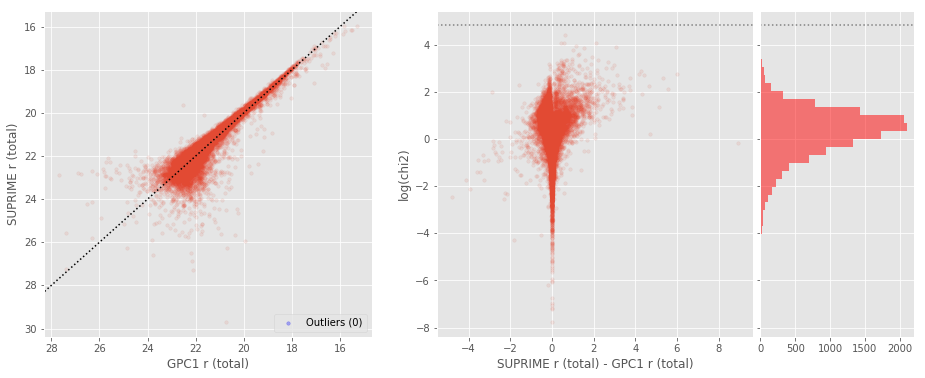

BASS r (aperture) - GPC1 r (aperture) (48425 sources):
- Median: -0.07
- Median Absolute Deviation: 0.16
- 1% percentile: -1.485422134399414
- 99% percentile: 4.48196273803712
Outliers separation: log(chi2) = 4.89
Number of outliers: 501



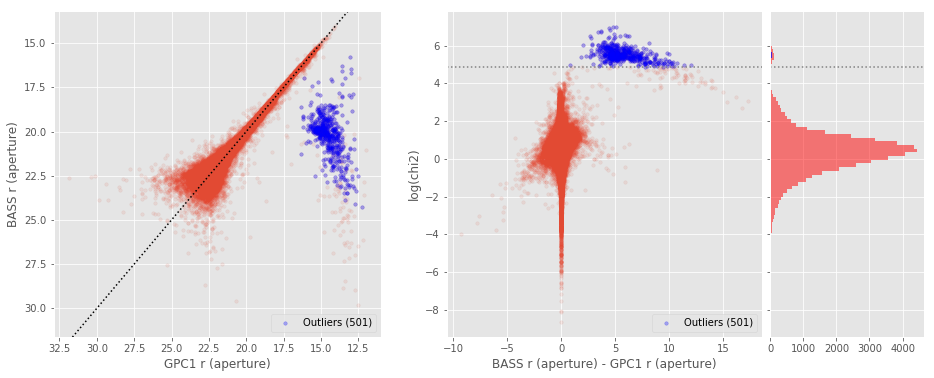

BASS r (total) - GPC1 r (total) (48552 sources):
- Median: -0.20
- Median Absolute Deviation: 0.15
- 1% percentile: -1.518271484375
- 99% percentile: 1.5365567207336404
Outliers separation: log(chi2) = 5.63
Number of outliers: 6



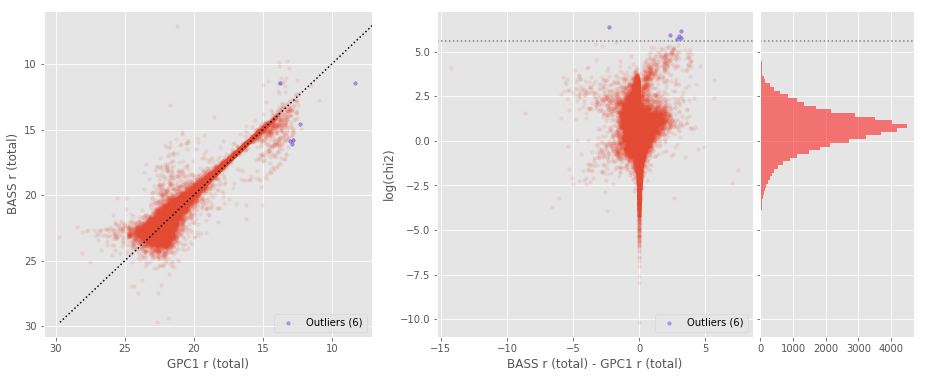

SUPRIME r (aperture) - Megacam r (aperture) (312560 sources):
- Median: -0.01
- Median Absolute Deviation: 0.18
- 1% percentile: -1.3007946014404297
- 99% percentile: 1.773109951019285
Outliers separation: log(chi2) = 4.47
Number of outliers: 157



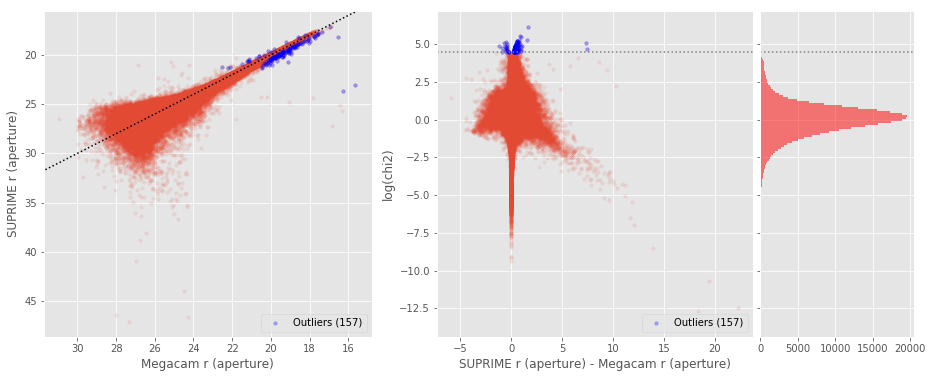

SUPRIME r (total) - Megacam r (total) (230867 sources):
- Median: 0.01
- Median Absolute Deviation: 0.26
- 1% percentile: -2.2060433197021485
- 99% percentile: 2.455700645446777
Outliers separation: log(chi2) = 4.90
Number of outliers: 2367



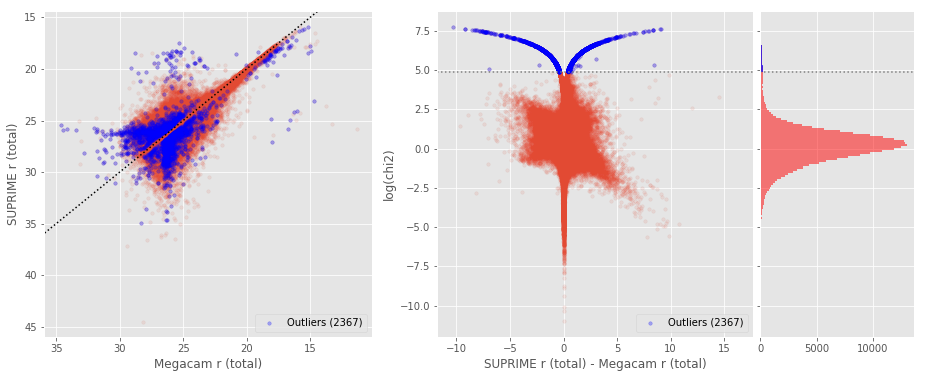

BASS r (aperture) - Megacam r (aperture) (147515 sources):
- Median: -0.20
- Median Absolute Deviation: 0.18
- 1% percentile: -1.2824085235595704
- 99% percentile: 2.3281039810180655
Outliers separation: log(chi2) = 6.58
Number of outliers: 9



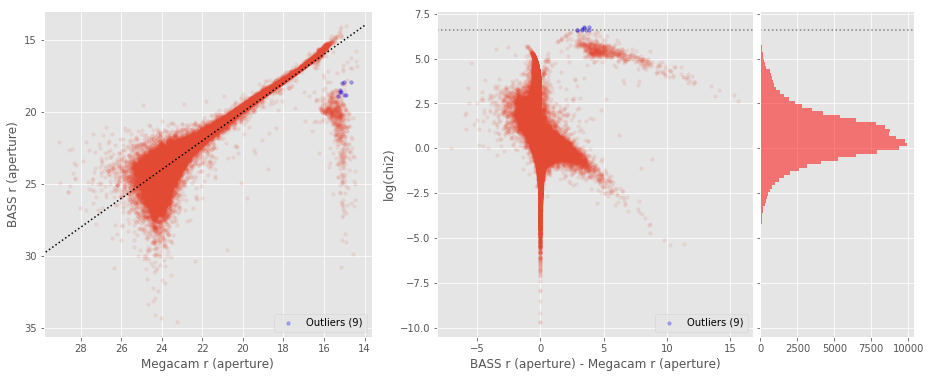

BASS r (total) - Megacam r (total) (149557 sources):
- Median: -0.08
- Median Absolute Deviation: 0.17
- 1% percentile: -1.5235447692871094
- 99% percentile: 1.4148318481445314
Outliers separation: log(chi2) = 5.21
Number of outliers: 47



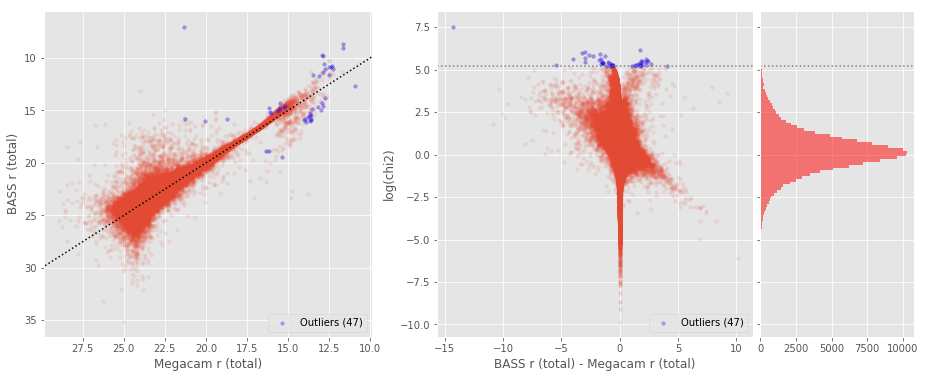

BASS r (aperture) - SUPRIME r (aperture) (57188 sources):
- Median: -0.21
- Median Absolute Deviation: 0.24
- 1% percentile: -1.515523910522461
- 99% percentile: 2.057665939331054
Outliers separation: log(chi2) = 6.80
Number of outliers: 0



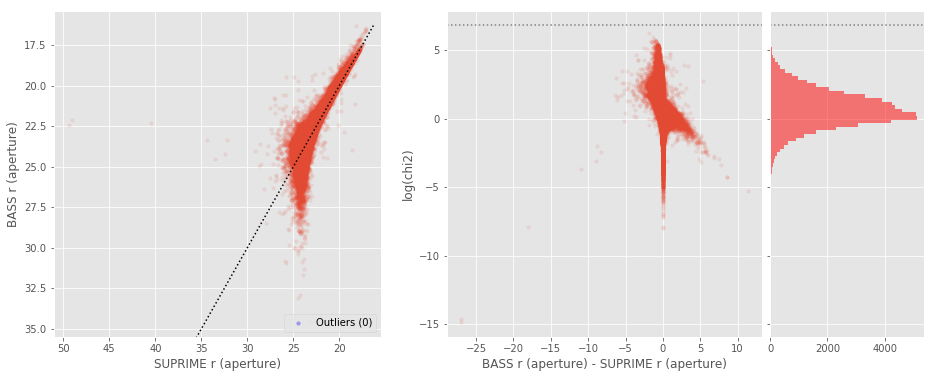

BASS r (total) - SUPRIME r (total) (41472 sources):
- Median: -0.06
- Median Absolute Deviation: 0.19
- 1% percentile: -2.051137161254883
- 99% percentile: 1.3736961174011233
Outliers separation: log(chi2) = 5.15
Number of outliers: 14



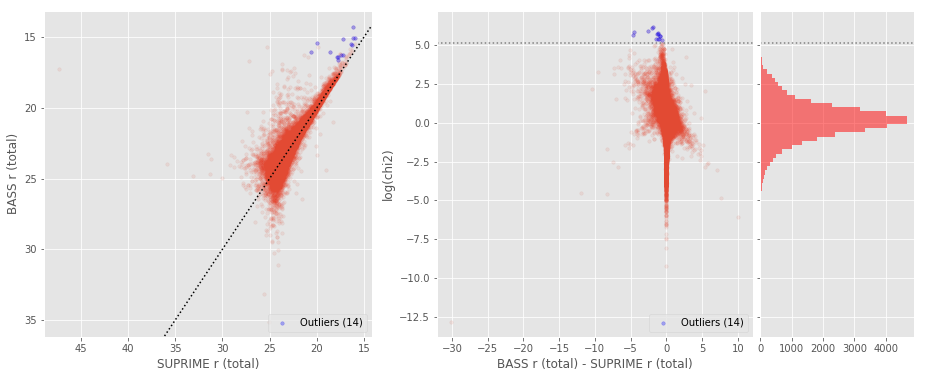

Megacam i (aperture) - GPC1 i (aperture) (54281 sources):
- Median: 0.08
- Median Absolute Deviation: 0.12
- 1% percentile: -0.7077011108398439
- 99% percentile: 1.0892204284667966
Outliers separation: log(chi2) = 5.76
Number of outliers: 119



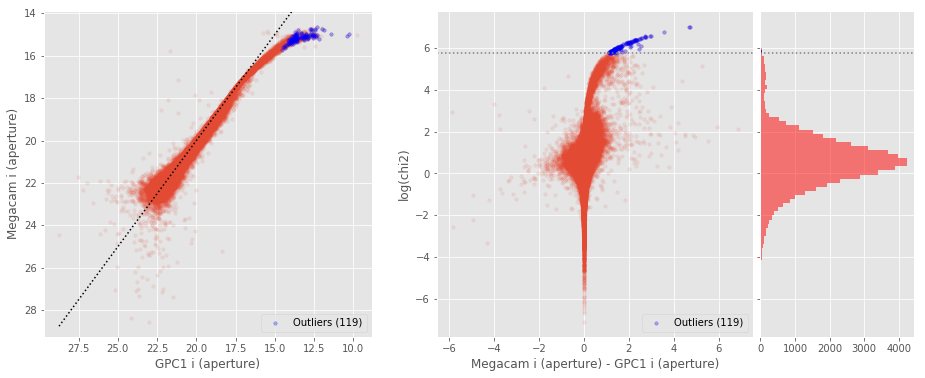

Megacam i (total) - GPC1 i (total) (54310 sources):
- Median: -0.14
- Median Absolute Deviation: 0.09
- 1% percentile: -0.7253468513488769
- 99% percentile: 0.8035373115539524
Outliers separation: log(chi2) = 5.06
Number of outliers: 125



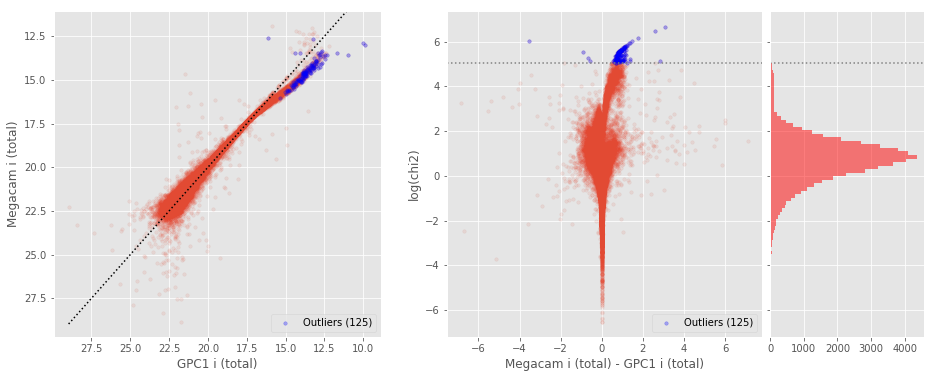

SUPRIME i (aperture) - GPC1 i (aperture) (18377 sources):
- Median: 0.11
- Median Absolute Deviation: 0.20
- 1% percentile: -0.7960177612304687
- 99% percentile: 1.2585309600830148
Outliers separation: log(chi2) = 6.55
Number of outliers: 0



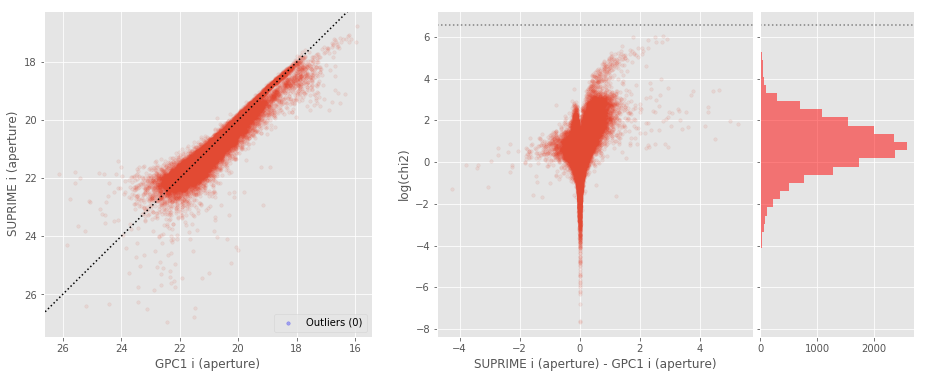

SUPRIME i (total) - GPC1 i (total) (18330 sources):
- Median: -0.19
- Median Absolute Deviation: 0.11
- 1% percentile: -0.7346679306030274
- 99% percentile: 1.0757511711120604
Outliers separation: log(chi2) = 4.81
Number of outliers: 21



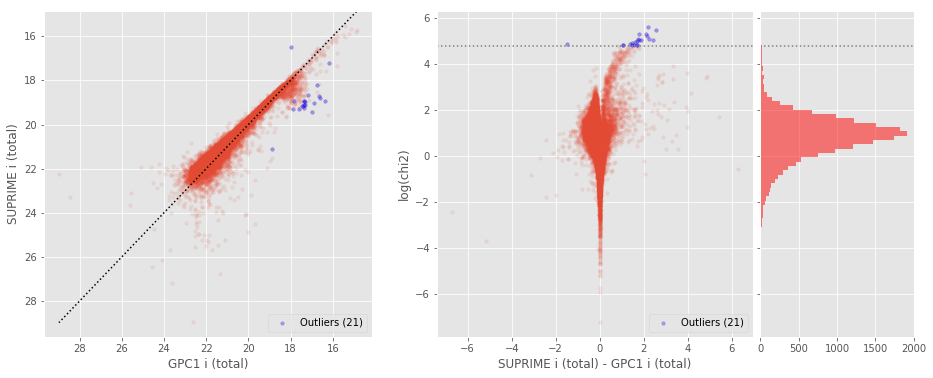

No sources have both GPC1 i (aperture) and MMT i (aperture) values.

MMT i (total) - GPC1 i (total) (7729 sources):
- Median: -0.21
- Median Absolute Deviation: 0.11
- 1% percentile: -0.7663004000520917
- 99% percentile: 0.6834318520914264
Outliers separation: log(chi2) = 4.60
Number of outliers: 5



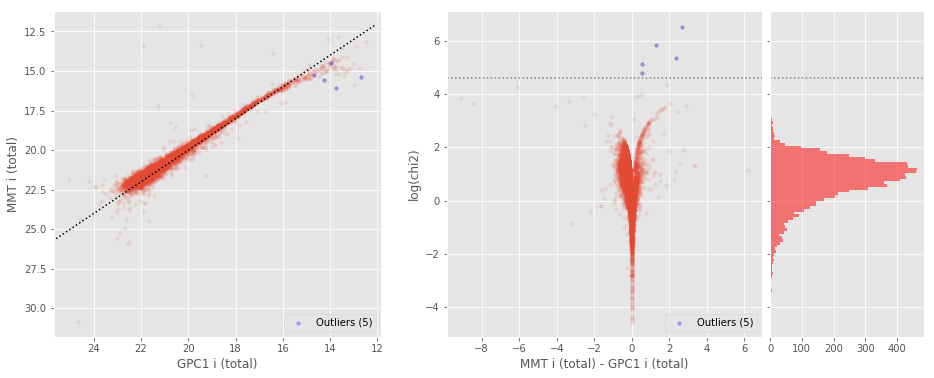

SUPRIME i (aperture) - Megacam i (aperture) (313881 sources):
- Median: -0.02
- Median Absolute Deviation: 0.16
- 1% percentile: -1.4580886840820313
- 99% percentile: 1.3433338165283222
Outliers separation: log(chi2) = 4.74
Number of outliers: 311



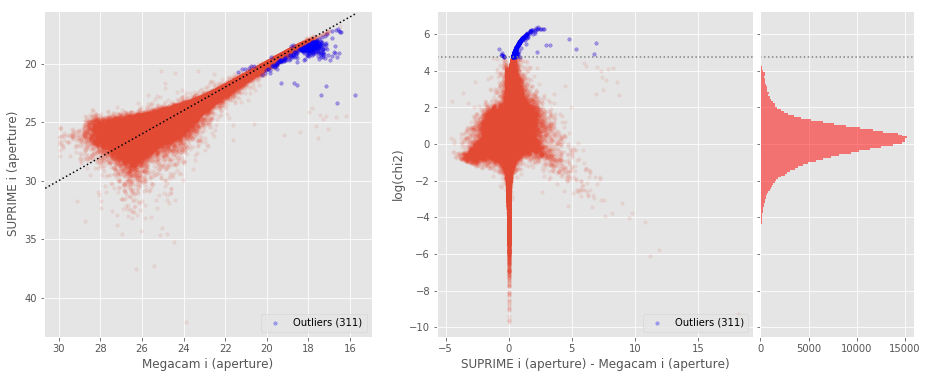

SUPRIME i (total) - Megacam i (total) (280062 sources):
- Median: -0.07
- Median Absolute Deviation: 0.21
- 1% percentile: -2.21152193069458
- 99% percentile: 2.071895027160648
Outliers separation: log(chi2) = 5.22
Number of outliers: 176



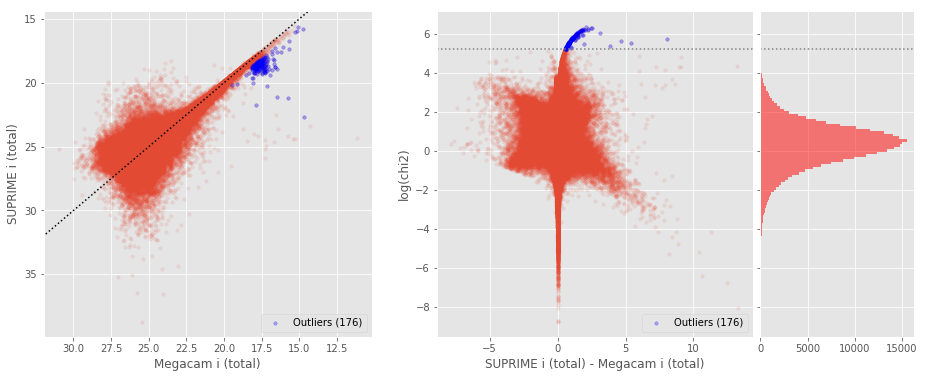

No sources have both Megacam i (aperture) and MMT i (aperture) values.

MMT i (total) - Megacam i (total) (103011 sources):
- Median: 0.01
- Median Absolute Deviation: 0.22
- 1% percentile: -2.3588428758062587
- 99% percentile: 2.41018860089009
Outliers separation: log(chi2) = 5.98
Number of outliers: 1243



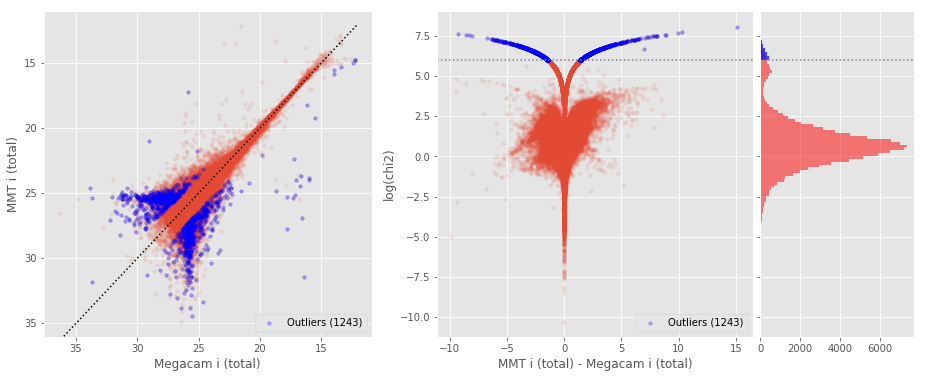

No sources have both SUPRIME i (aperture) and MMT i (aperture) values.

MMT i (total) - SUPRIME i (total) (61602 sources):
- Median: 0.06
- Median Absolute Deviation: 0.22
- 1% percentile: -1.9879575912101857
- 99% percentile: 2.430333454777546
Outliers separation: log(chi2) = 5.00
Number of outliers: 2



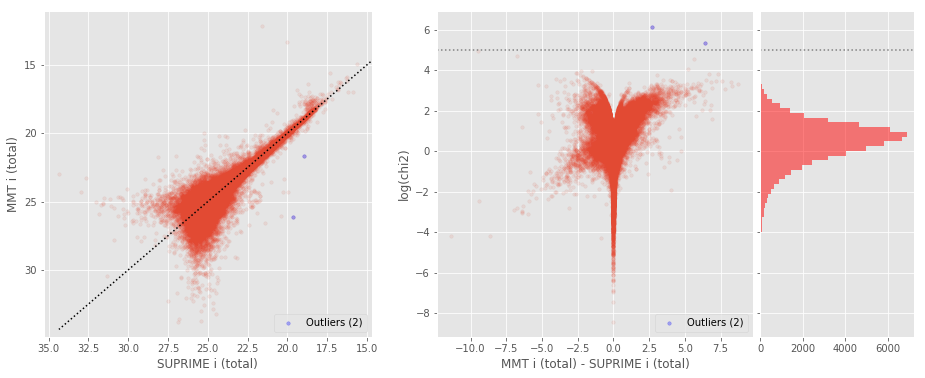

Megacam z (aperture) - GPC1 z (aperture) (54241 sources):
- Median: 0.13
- Median Absolute Deviation: 0.12
- 1% percentile: -0.8210201263427734
- 99% percentile: 1.018880462646484
Outliers separation: log(chi2) = 5.97
Number of outliers: 35



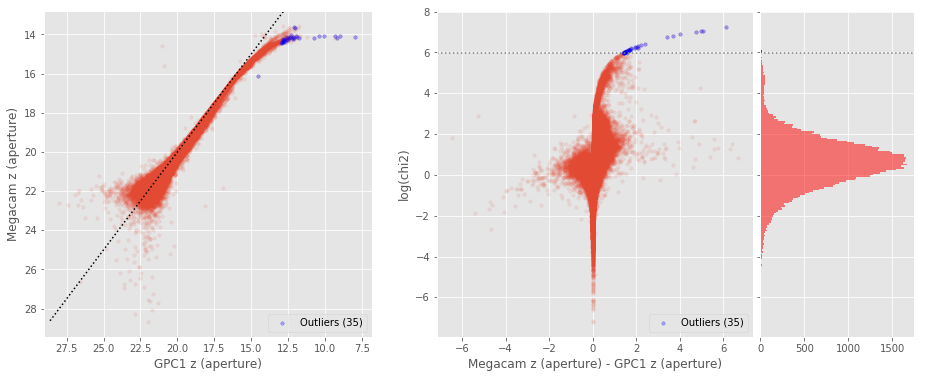

Megacam z (total) - GPC1 z (total) (54248 sources):
- Median: -0.09
- Median Absolute Deviation: 0.11
- 1% percentile: -0.7753526496887206
- 99% percentile: 0.8405802231147735
Outliers separation: log(chi2) = 4.89
Number of outliers: 117



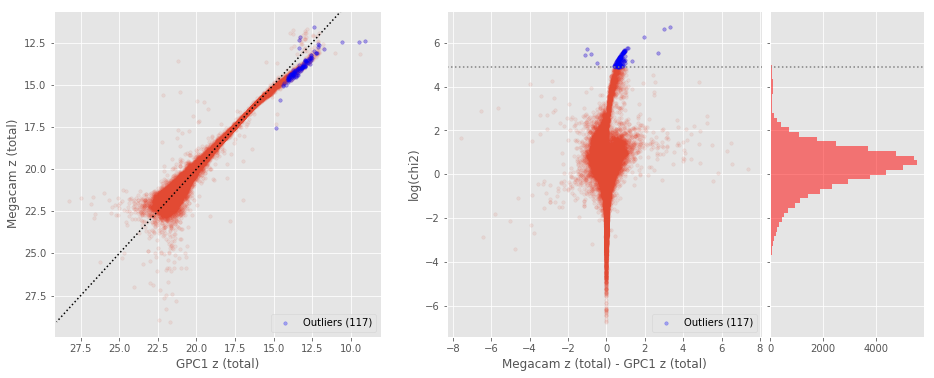

SUPRIME z (aperture) - GPC1 z (aperture) (18357 sources):
- Median: 0.10
- Median Absolute Deviation: 0.21
- 1% percentile: -0.9145635223388673
- 99% percentile: 1.1059716796874963
Outliers separation: log(chi2) = 6.11
Number of outliers: 0



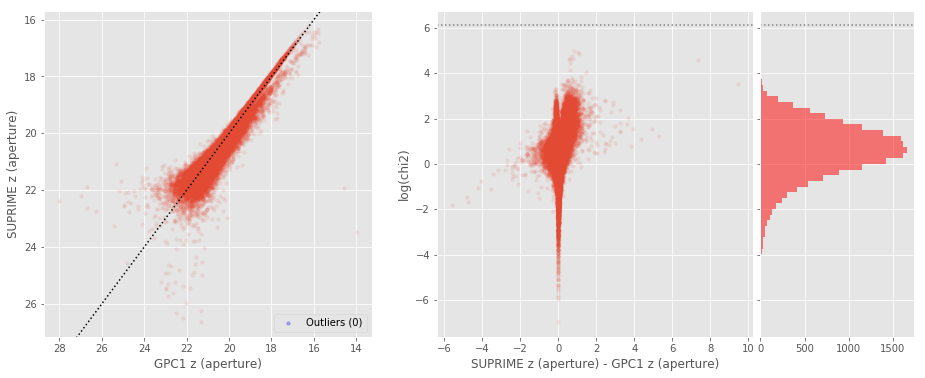

SUPRIME z (total) - GPC1 z (total) (18306 sources):
- Median: -0.14
- Median Absolute Deviation: 0.12
- 1% percentile: -0.8064228057861328
- 99% percentile: 0.991533565521241
Outliers separation: log(chi2) = 4.76
Number of outliers: 2



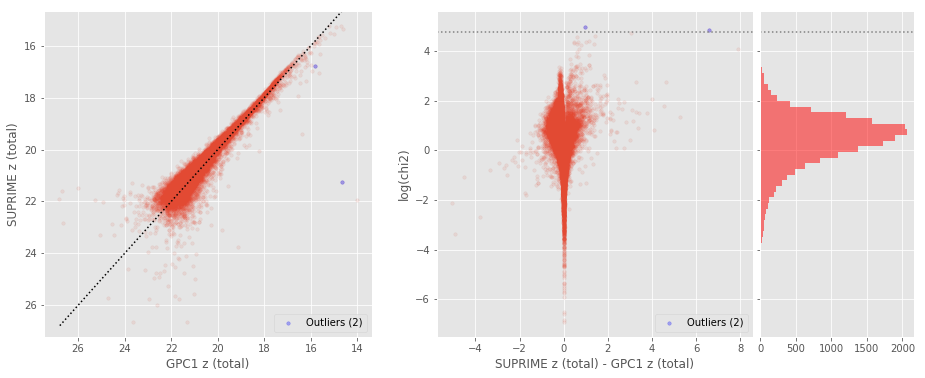

BASS z (aperture) - GPC1 z (aperture) (34579 sources):
- Median: -0.12
- Median Absolute Deviation: 0.13
- 1% percentile: -1.0750649642944334
- 99% percentile: 3.547717075347901
Outliers separation: log(chi2) = 5.07
Number of outliers: 510



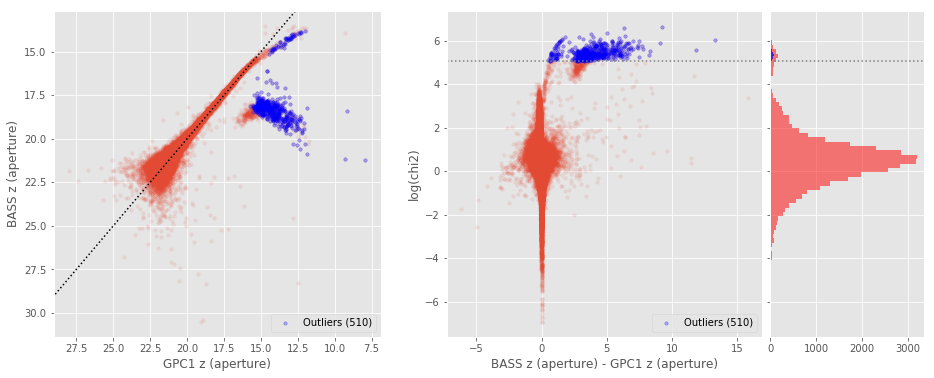

BASS z (total) - GPC1 z (total) (34739 sources):
- Median: -0.27
- Median Absolute Deviation: 0.15
- 1% percentile: -1.3680257034301757
- 99% percentile: 1.1284795379638703
Outliers separation: log(chi2) = 5.93
Number of outliers: 8



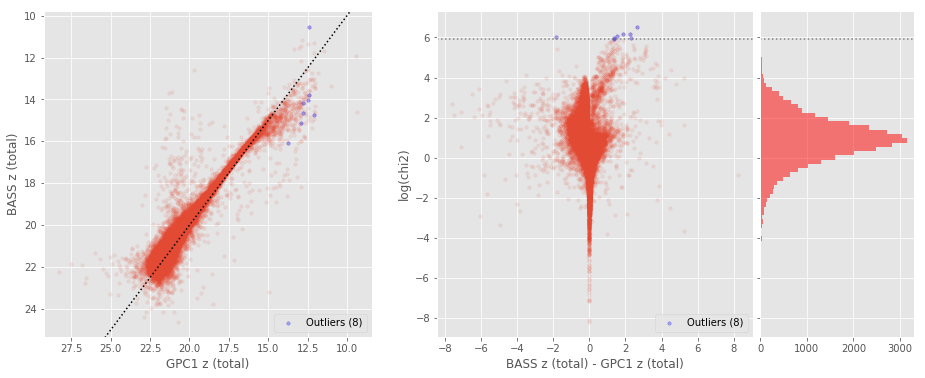

No sources have both GPC1 z (aperture) and MMT z (aperture) values.

MMT z (total) - GPC1 z (total) (7600 sources):
- Median: -0.07
- Median Absolute Deviation: 0.13
- 1% percentile: -0.6994217699766534
- 99% percentile: 0.8636131653919541
Outliers separation: log(chi2) = 4.59
Number of outliers: 2



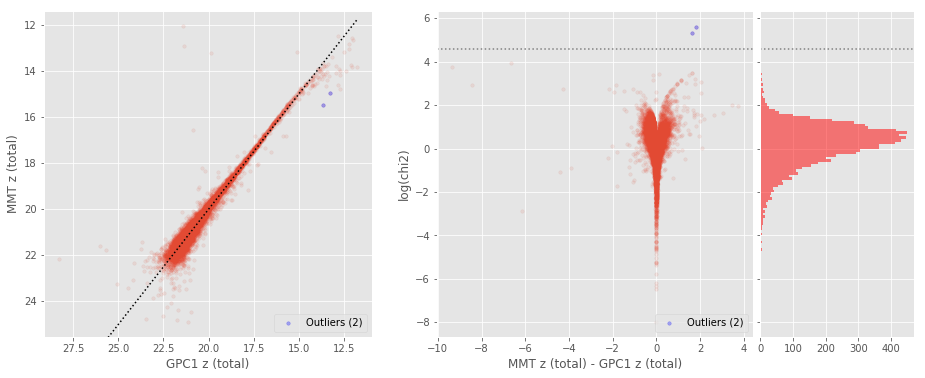

SUPRIME z (aperture) - Megacam z (aperture) (294883 sources):
- Median: -0.04
- Median Absolute Deviation: 0.25
- 1% percentile: -2.159938545227051
- 99% percentile: 2.59332706451416
Outliers separation: log(chi2) = 4.62
Number of outliers: 46



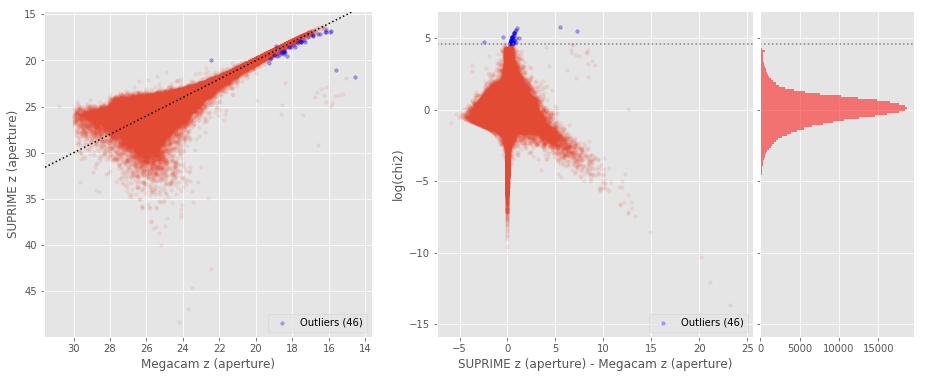

SUPRIME z (total) - Megacam z (total) (261569 sources):
- Median: -0.03
- Median Absolute Deviation: 0.31
- 1% percentile: -2.6481025695800784
- 99% percentile: 2.738444061279298
Outliers separation: log(chi2) = 4.95
Number of outliers: 44



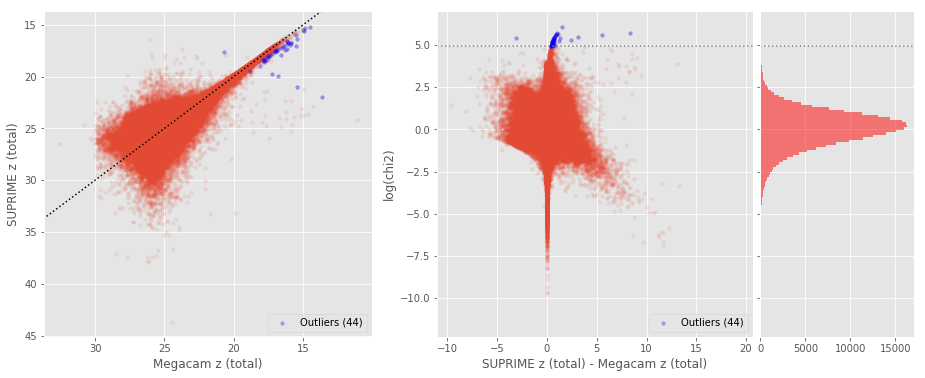

BASS z (aperture) - Megacam z (aperture) (100478 sources):
- Median: -0.27
- Median Absolute Deviation: 0.24
- 1% percentile: -1.9307139205932617
- 99% percentile: 2.980490236282348
Outliers separation: log(chi2) = 6.68
Number of outliers: 0



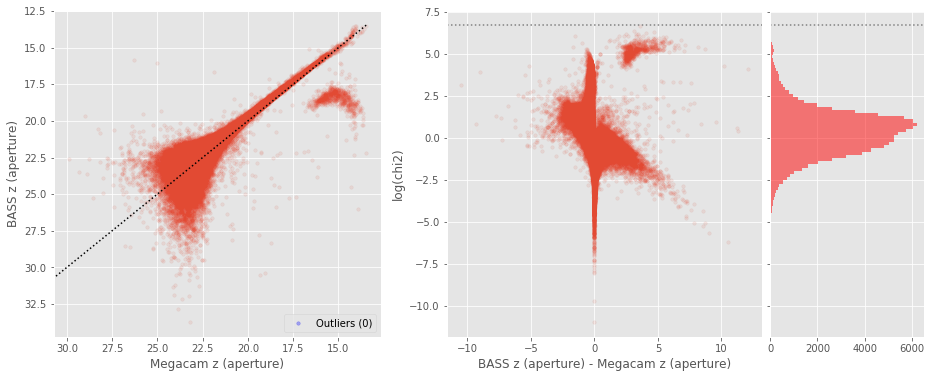

BASS z (total) - Megacam z (total) (106103 sources):
- Median: -0.17
- Median Absolute Deviation: 0.22
- 1% percentile: -2.2553145980834963
- 99% percentile: 1.9777140045165917
Outliers separation: log(chi2) = 5.90
Number of outliers: 11



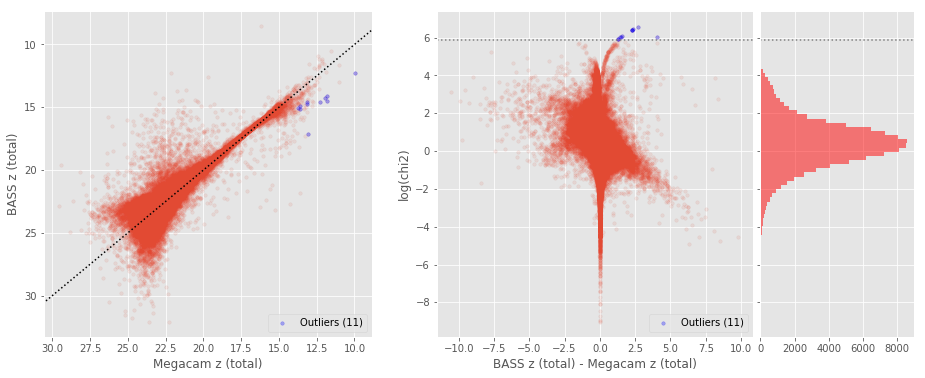

No sources have both Megacam z (aperture) and MMT z (aperture) values.

MMT z (total) - Megacam z (total) (100627 sources):
- Median: 0.18
- Median Absolute Deviation: 0.30
- 1% percentile: -2.424363076598387
- 99% percentile: 3.2065720875835337
Outliers separation: log(chi2) = 5.92
Number of outliers: 2893



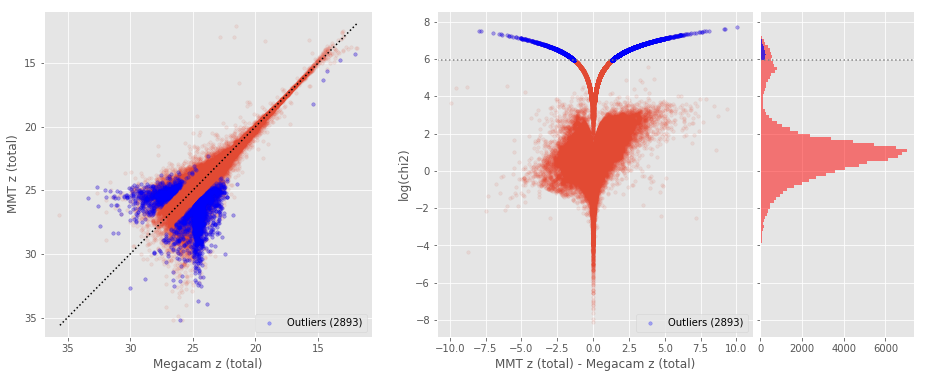

BASS z (aperture) - SUPRIME z (aperture) (37978 sources):
- Median: -0.25
- Median Absolute Deviation: 0.31
- 1% percentile: -2.062076530456543
- 99% percentile: 2.7850425529479987
Outliers separation: log(chi2) = 6.41
Number of outliers: 0



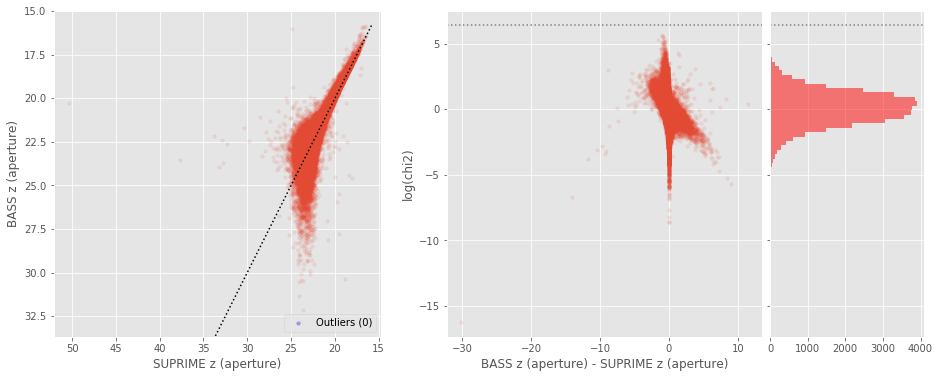

BASS z (total) - SUPRIME z (total) (40350 sources):
- Median: -0.12
- Median Absolute Deviation: 0.24
- 1% percentile: -2.3780652236938478
- 99% percentile: 2.1067596435546894
Outliers separation: log(chi2) = 5.51
Number of outliers: 4



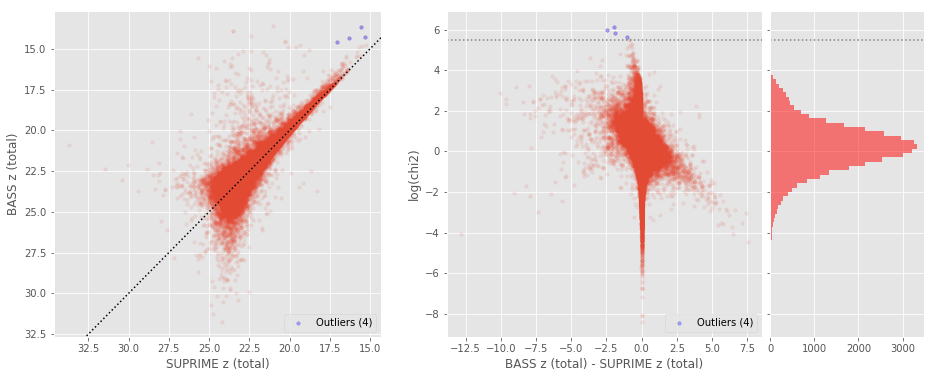

No sources have both SUPRIME z (aperture) and MMT z (aperture) values.

MMT z (total) - SUPRIME z (total) (59830 sources):
- Median: 0.19
- Median Absolute Deviation: 0.26
- 1% percentile: -2.1359279624037466
- 99% percentile: 2.7942930360262253
Outliers separation: log(chi2) = 5.26
Number of outliers: 0



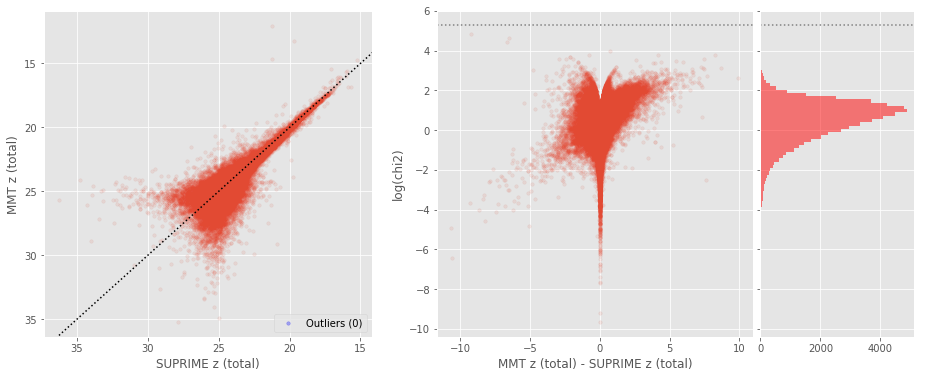

No sources have both BASS z (aperture) and MMT z (aperture) values.

MMT z (total) - BASS z (total) (18054 sources):
- Median: 0.23
- Median Absolute Deviation: 0.22
- 1% percentile: -1.7755073254872755
- 99% percentile: 1.9523116424071487
Outliers separation: log(chi2) = 5.84
Number of outliers: 0



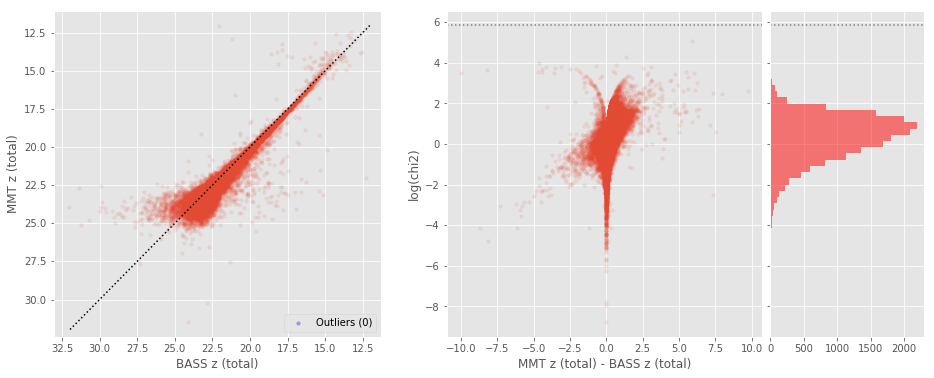

SUPRIME y (aperture) - GPC1 y (aperture) (18048 sources):
- Median: 0.24
- Median Absolute Deviation: 0.31
- 1% percentile: -1.7521905326843261
- 99% percentile: 2.0714528083801205
Outliers separation: log(chi2) = 5.67
Number of outliers: 0



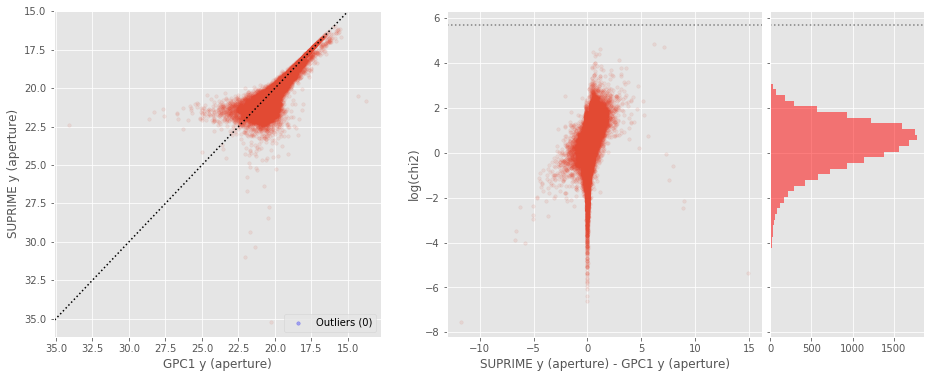

SUPRIME y (total) - GPC1 y (total) (17742 sources):
- Median: -0.05
- Median Absolute Deviation: 0.28
- 1% percentile: -1.5493675613403322
- 99% percentile: 2.2786521530151367
Outliers separation: log(chi2) = 5.28
Number of outliers: 1



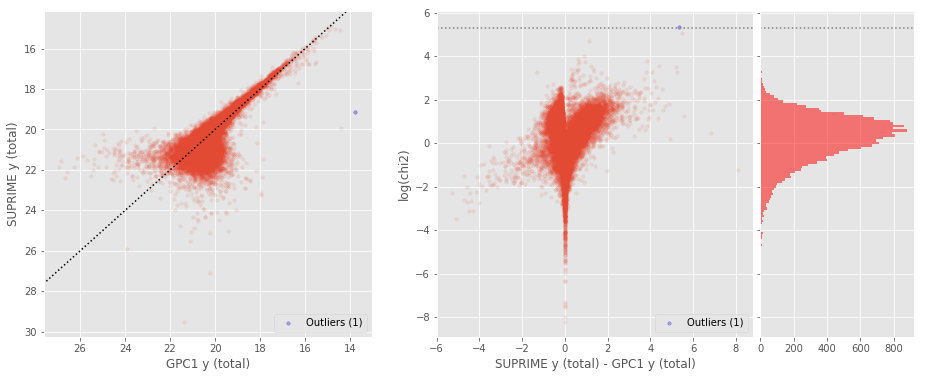

No sources have both WIRCAM J (aperture) and WIRCS J (aperture) values.

WIRCS J (total) - WIRCAM J (total) (8709 sources):
- Median: -0.07
- Median Absolute Deviation: 0.19
- 1% percentile: -2.17553723343571
- 99% percentile: 1.3230694812733537
Outliers separation: log(chi2) = 4.35
Number of outliers: 5



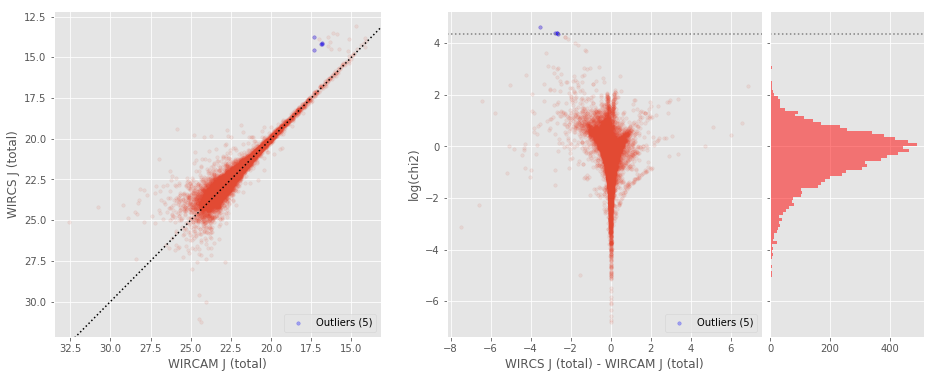

UKIDSS J (aperture) - WIRCAM J (aperture) (3659 sources):
- Median: -0.17
- Median Absolute Deviation: 0.11
- 1% percentile: -4.793179264068604
- 99% percentile: 0.26811653137207075
Outliers separation: log(chi2) = 5.72
Number of outliers: 20



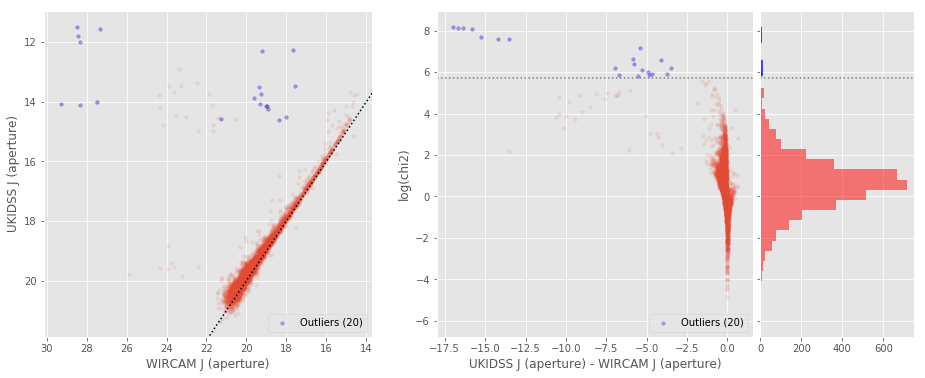

UKIDSS J (total) - WIRCAM J (total) (3696 sources):
- Median: 0.04
- Median Absolute Deviation: 0.14
- 1% percentile: -2.7405741691589354
- 99% percentile: 1.0240702629089358
Outliers separation: log(chi2) = 4.24
Number of outliers: 77



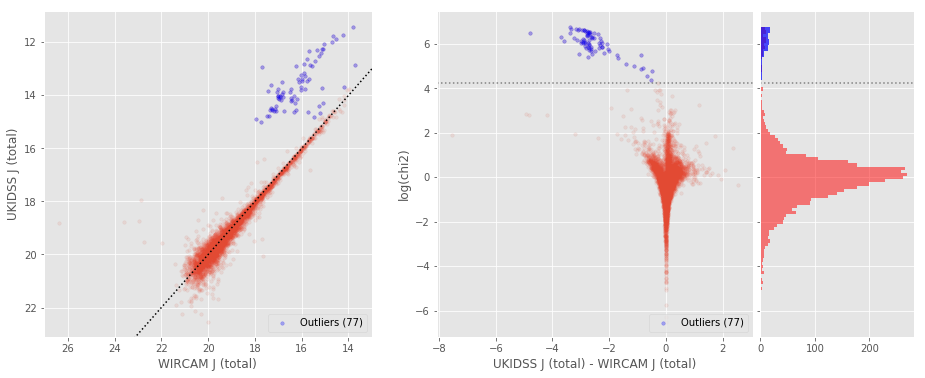

No sources have both WIRCAM J (aperture) and OMEGA2000 J (aperture) values.

OMEGA2000 J (total) - WIRCAM J (total) (17146 sources):
- Median: 0.13
- Median Absolute Deviation: 0.28
- 1% percentile: -3.4638885305440543
- 99% percentile: 2.574635988387519
Outliers separation: log(chi2) = 5.17
Number of outliers: 4



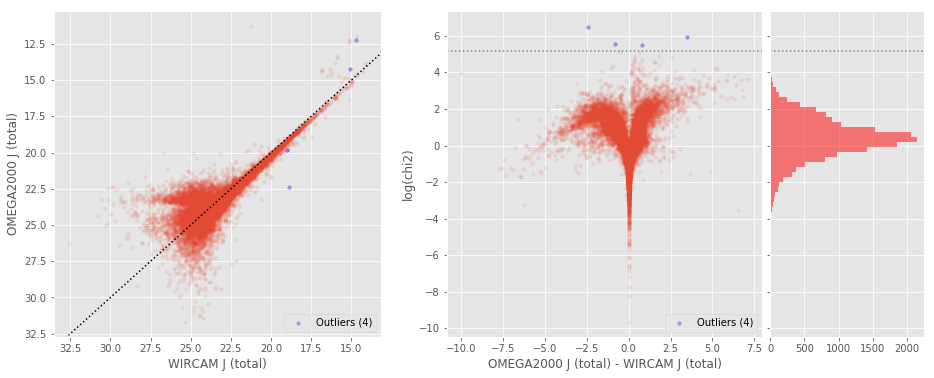

No sources have both WIRCS J (aperture) and UKIDSS J (aperture) values.

UKIDSS J (total) - WIRCS J (total) (1200 sources):
- Median: 0.05
- Median Absolute Deviation: 0.16
- 1% percentile: -0.7326684272432907
- 99% percentile: 1.0222941231513343
Outliers separation: log(chi2) = 4.04
Number of outliers: 1



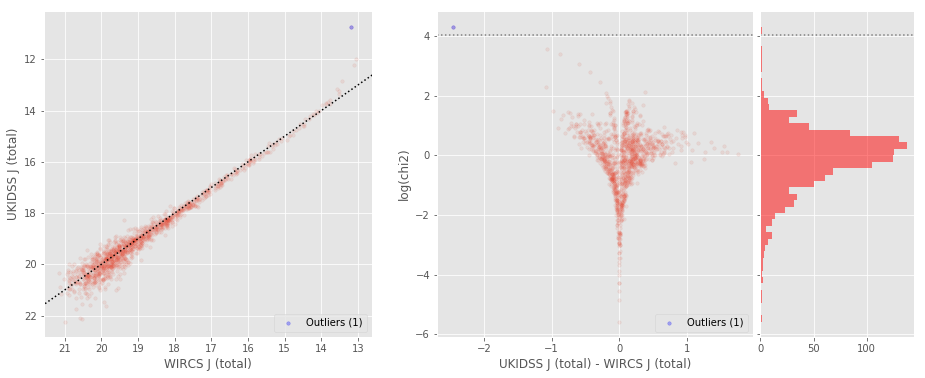

No sources have both WIRCS J (aperture) and OMEGA2000 J (aperture) values.

OMEGA2000 J (total) - WIRCS J (total) (7049 sources):
- Median: 0.25
- Median Absolute Deviation: 0.26
- 1% percentile: -2.7778746810021477
- 99% percentile: 2.511969500930081
Outliers separation: log(chi2) = 4.63
Number of outliers: 0



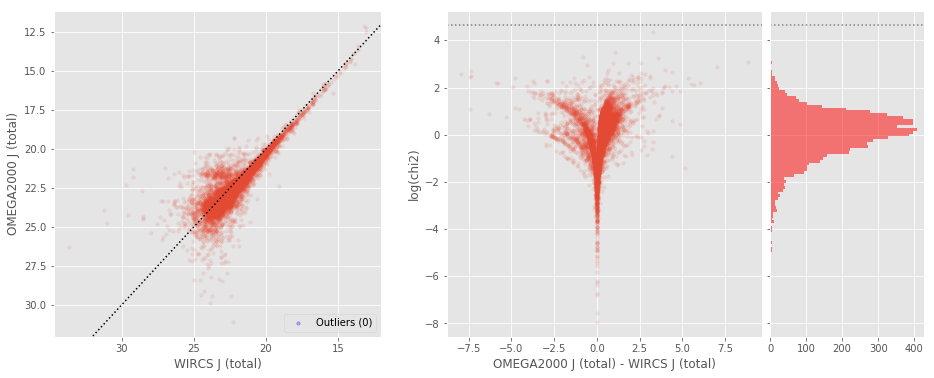

No sources have both UKIDSS J (aperture) and OMEGA2000 J (aperture) values.

OMEGA2000 J (total) - UKIDSS J (total) (1066 sources):
- Median: 0.17
- Median Absolute Deviation: 0.18
- 1% percentile: -0.9172623350937272
- 99% percentile: 1.277964303811214
Outliers separation: log(chi2) = 4.31
Number of outliers: 3



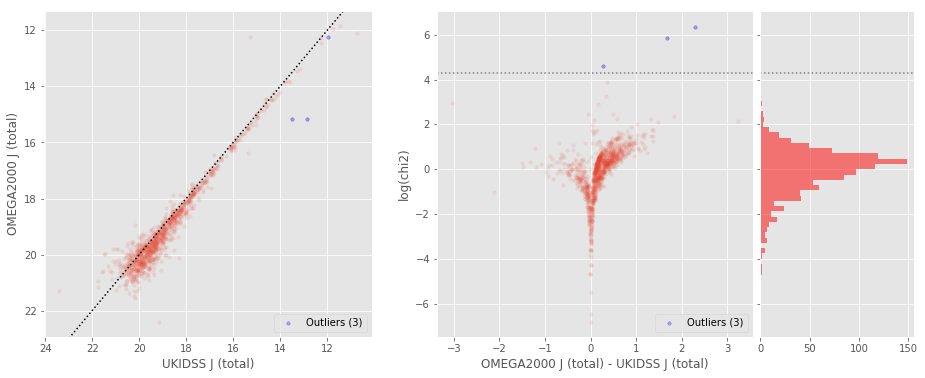

WIRCS K (aperture) - WIRCAM Ks (aperture) (18335 sources):
- Median: 0.10
- Median Absolute Deviation: 0.13
- 1% percentile: -1.1783287811279297
- 99% percentile: 0.6700547027587891
Outliers separation: log(chi2) = 4.61
Number of outliers: 21



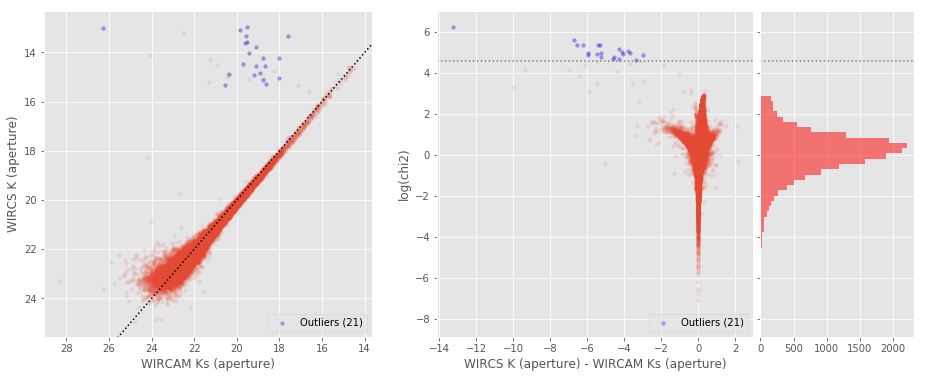

WIRCS K (total) - WIRCAM Ks (total) (19551 sources):
- Median: -0.04
- Median Absolute Deviation: 0.18
- 1% percentile: -2.2274558829791324
- 99% percentile: 0.9906730651855469
Outliers separation: log(chi2) = 4.73
Number of outliers: 12



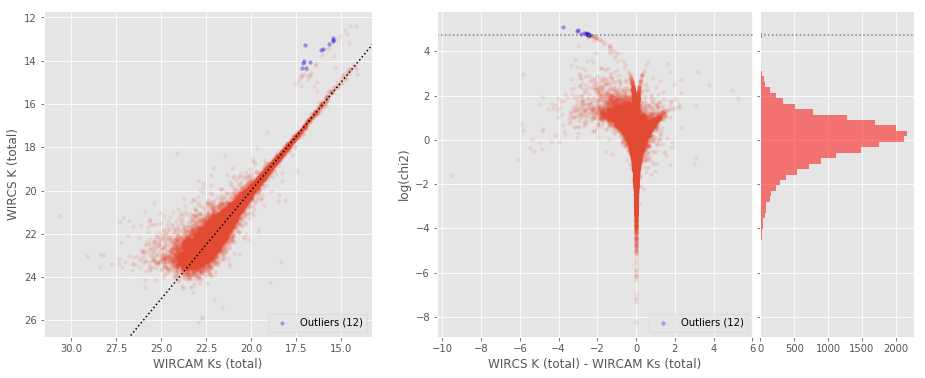

No sources have both WIRCAM Ks (aperture) and NEWFIRM K (aperture) values.

NEWFIRM K (total) - WIRCAM Ks (total) (11481 sources):
- Median: -0.31
- Median Absolute Deviation: 0.71
- 1% percentile: -7.585097407337646
- 99% percentile: 5.169086832208437
Outliers separation: log(chi2) = 8.25
Number of outliers: 0



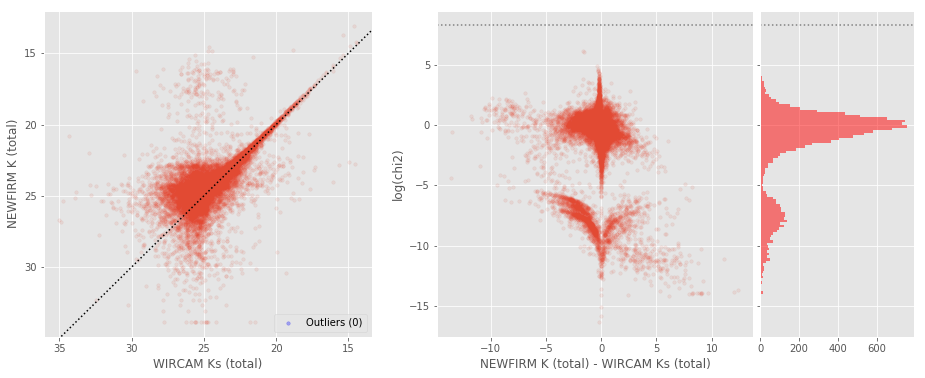

No sources have both WIRCAM Ks (aperture) and OMEGA2000 Ks (aperture) values.

OMEGA2000 Ks (total) - WIRCAM Ks (total) (11908 sources):
- Median: -0.17
- Median Absolute Deviation: 0.82
- 1% percentile: -4.466180583106244
- 99% percentile: 3.324799970738235
Outliers separation: log(chi2) = 7.46
Number of outliers: 0



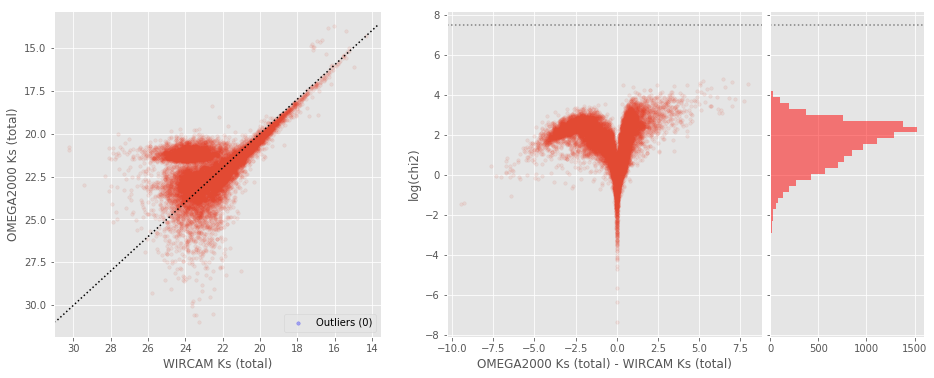

No sources have both WIRCS K (aperture) and NEWFIRM K (aperture) values.

NEWFIRM K (total) - WIRCS K (total) (1943 sources):
- Median: 0.04
- Median Absolute Deviation: 0.28
- 1% percentile: -1.5555142259608936
- 99% percentile: 5.924062481208353
Outliers separation: log(chi2) = 6.18
Number of outliers: 0



/data/vault/epons/conda_envs/herschelhelp_internal/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


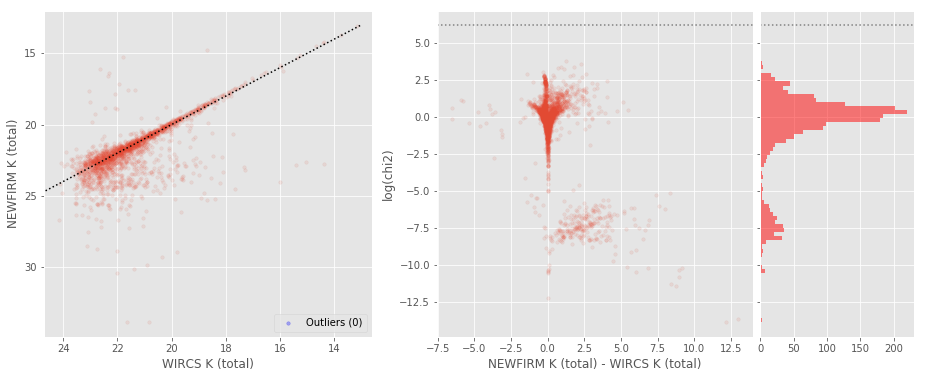

No sources have both WIRCS K (aperture) and OMEGA2000 Ks (aperture) values.

OMEGA2000 Ks (total) - WIRCS K (total) (10794 sources):
- Median: 0.19
- Median Absolute Deviation: 0.39
- 1% percentile: -2.635142871450819
- 99% percentile: 3.362779480613591
Outliers separation: log(chi2) = 5.44
Number of outliers: 0



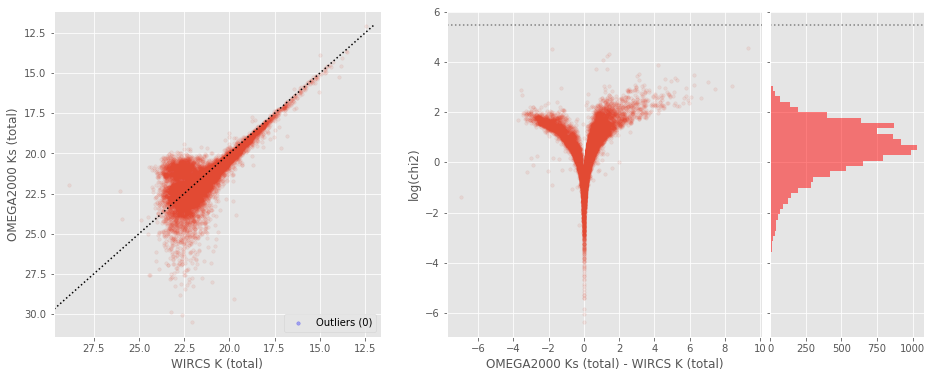

No sources have both NEWFIRM K (aperture) and OMEGA2000 Ks (aperture) values.

OMEGA2000 Ks (total) - NEWFIRM K (total) (1484 sources):
- Median: -0.66
- Median Absolute Deviation: 1.23
- 1% percentile: -5.164295023082615
- 99% percentile: 2.688437592059834
Outliers separation: log(chi2) = 6.08
Number of outliers: 0



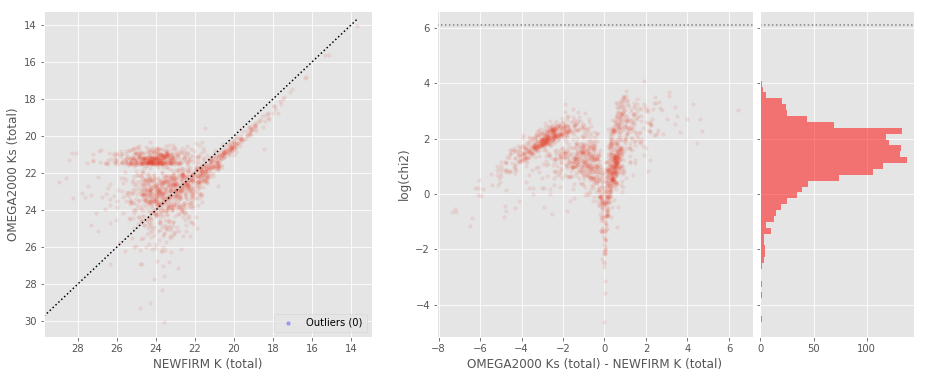

In [37]:
for band_of_a_kind in all_bands:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):

        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
        
        if basecol1 == "gpc1_g" and basecol2 == "megacam_g":
            savefig = True
        else:
            savefig = False
        
        # Aperture mag
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
        ecol1, ecol2 = "merr_ap_{}".format(basecol1), "merr_ap_{}".format(basecol2)
        outliers(master_catalogue[col1], master_catalogue[col2],
                 master_catalogue[ecol1], master_catalogue[ecol2],
                 labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)))
        
        # Tot mag
        col1, col2 = "m_{}".format(basecol1), "m_{}".format(basecol2)
        ecol1, ecol2 = "merr_{}".format(basecol1), "merr_{}".format(basecol2)
        outliers(master_catalogue[col1], master_catalogue[col2], 
                 master_catalogue[ecol1], master_catalogue[ecol2],
                 labels=("{} (total)".format(band1), "{} (total)".format(band2)), savefig=savefig)
        
for j in range(40):
    plt.close()

## 4/ Aperture correction issues

In [38]:
def apcor_check(x, y, stellarity, labels=["x", "y"], savefig=False):
    import matplotlib.gridspec as gridspec
    from astropy import visualization as vz
    
    #fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))   # 
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :-1])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    ax3 = plt.subplot(gs2[:, -1], sharey=ax2)

    
    # Use only finite values
    #mask = np.isfinite(x) & np.isfinite(y) & np.isfinite(stellarity)
    mask = np.isfinite(x) & np.isfinite(y) & np.isfinite(stellarity) & (x<100) & (y<100)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
    stellarity = np.copy(stellarity[mask])


    diff = y - x

    x_label, y_label = labels
    
    # If the difference is all NaN there is nothing to compare.
    if np.isnan(diff).all():
        print("No sources have both {} and {} values.".format(
            x_label, y_label))
        print("")
        return
    
    
    diff_label = "{} - {}".format(y_label, x_label)
    print("{}:".format(diff_label))
    
    # Subsample
    zoom = (x > 16) & (x < 20)


    # Comparing mag
    ax1.scatter(x, diff, marker='.', alpha=0.1, s=50)
    ax1.invert_xaxis()
    ax1.set_ylabel(diff_label)
    ax1.set_xlabel(x_label)
    

    # Zoom Plot
    y_min, y_max = np.percentile(diff[zoom], [1., 99.])
    y_delta = .1 * (y_max - y_min)
    y_min -= y_delta
    y_max += y_delta

    if len(x[zoom]) < 1000:
        alpha = 0.4
    else:
        alpha = 0.1
    print(len(x[zoom]))
    pl = ax2.scatter(x[zoom], diff[zoom], marker='.', alpha=alpha, s=50, c=stellarity[zoom], cmap="jet")
    ax2.invert_xaxis()
    ax2.set_ylabel(diff_label)
    ax2.set_xlabel(x_label)
    ax2.set_ylim([y_min, y_max])
    fig.colorbar(pl, label="stellarity (1=star)")
    
    #ax2.legend(loc='lower right', numpoints=1)
    
    # Hist
    n, bins, patches = vz.hist(diff[zoom], ax=ax3, bins='knuth', facecolor='black', lw = 2, alpha=0.5,\
                                   orientation="horizontal")
    ax3.yaxis.set_tick_params(labelleft=False)
    
    # Save ex. fig
    if savefig:
        survey_label = ((diff_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_apcorrIssues_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')


    display(fig)
    plt.close()

/data/vault/epons/conda_envs/herschelhelp_internal/lib/python3.6/site-packages/astropy/table/column.py:929: RuntimeWarning: invalid value encountered in less
  return getattr(self.data, oper)(other)


No sources have both Megacam u (aperture) and MMT u (aperture) values.

Megacam g (aperture) - GPC1 g (aperture):
4435


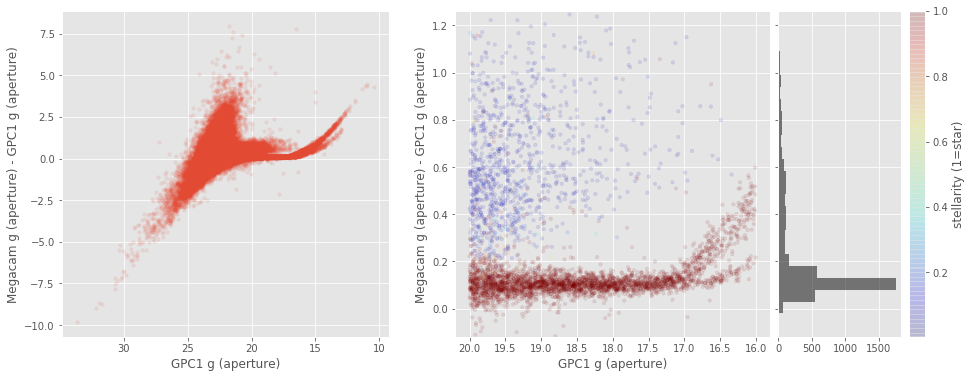

SUPRIME g (aperture) - GPC1 g (aperture):
904


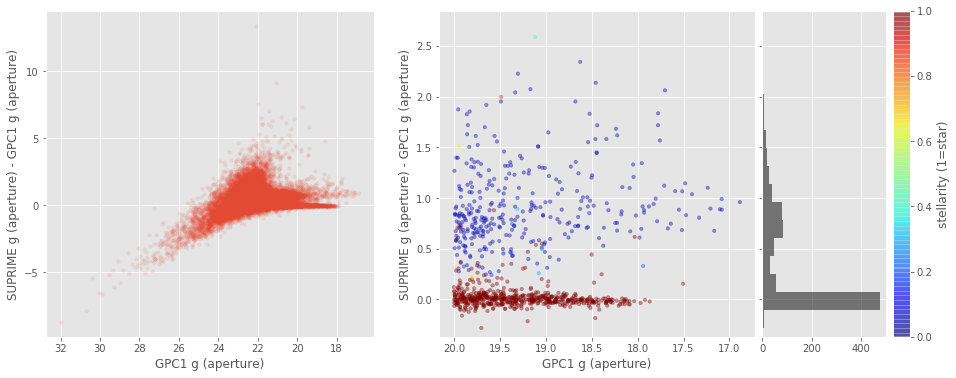

BASS g (aperture) - GPC1 g (aperture):
4243


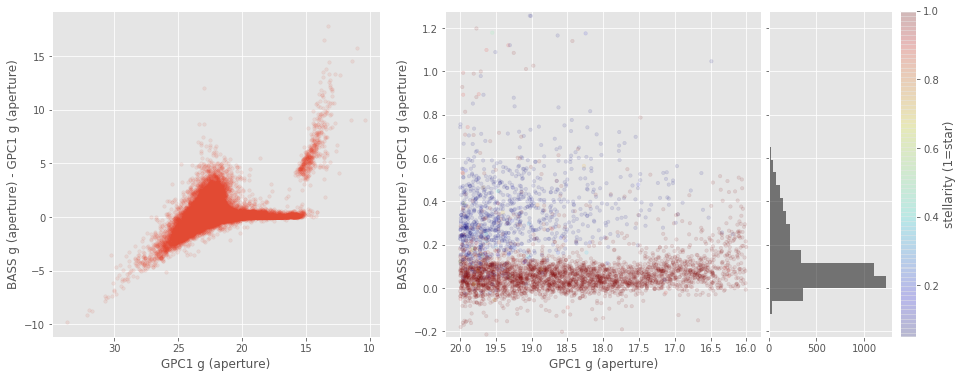

No sources have both GPC1 g (aperture) and MMT g (aperture) values.

SUPRIME g (aperture) - Megacam g (aperture):
648


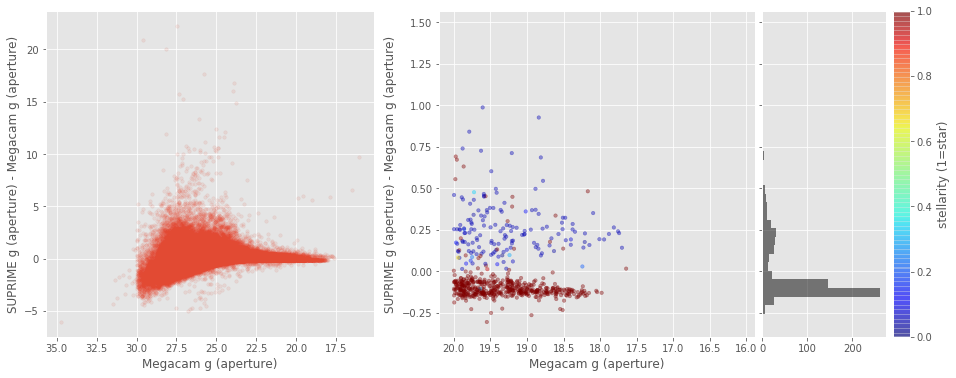

BASS g (aperture) - Megacam g (aperture):
3782


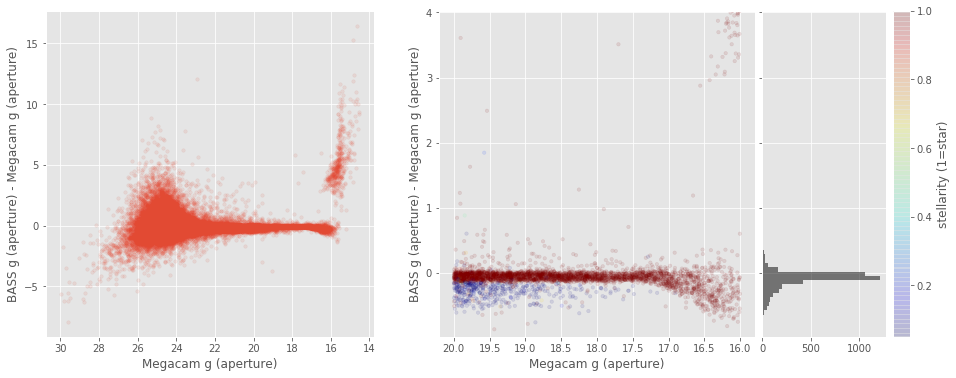

No sources have both Megacam g (aperture) and MMT g (aperture) values.

BASS g (aperture) - SUPRIME g (aperture):
627


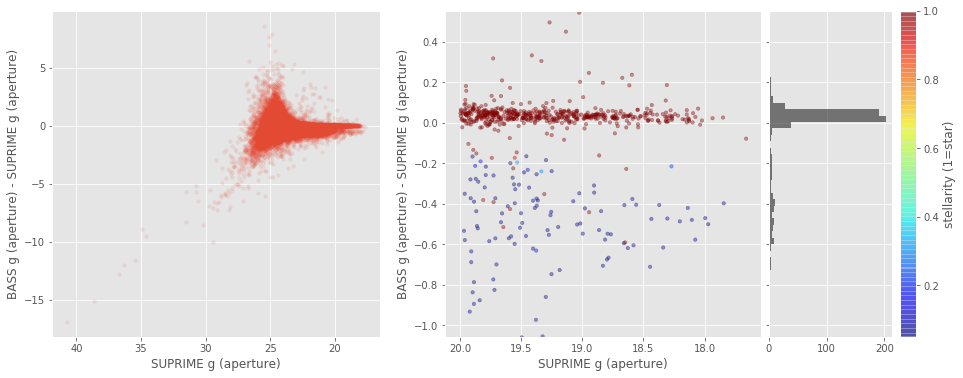

No sources have both SUPRIME g (aperture) and MMT g (aperture) values.

No sources have both BASS g (aperture) and MMT g (aperture) values.

Megacam r (aperture) - GPC1 r (aperture):
7533


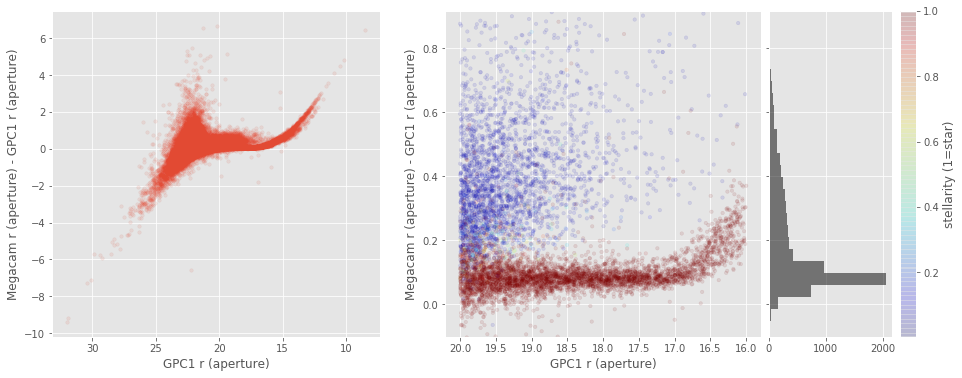

SUPRIME r (aperture) - GPC1 r (aperture):
2087


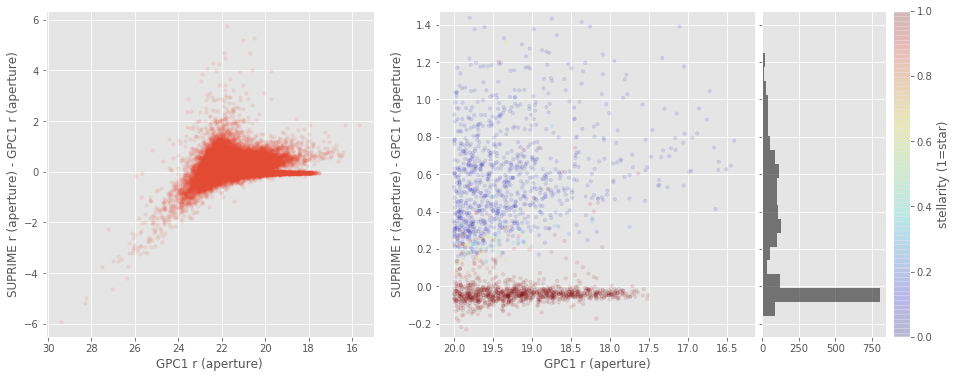

BASS r (aperture) - GPC1 r (aperture):
7104


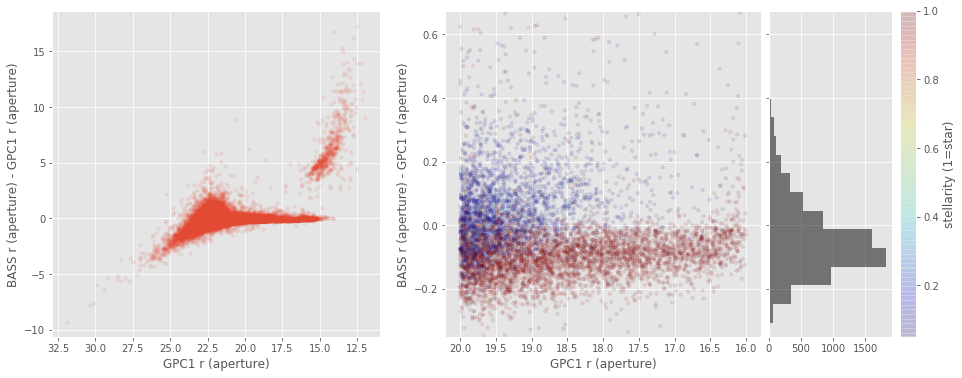

SUPRIME r (aperture) - Megacam r (aperture):
1672


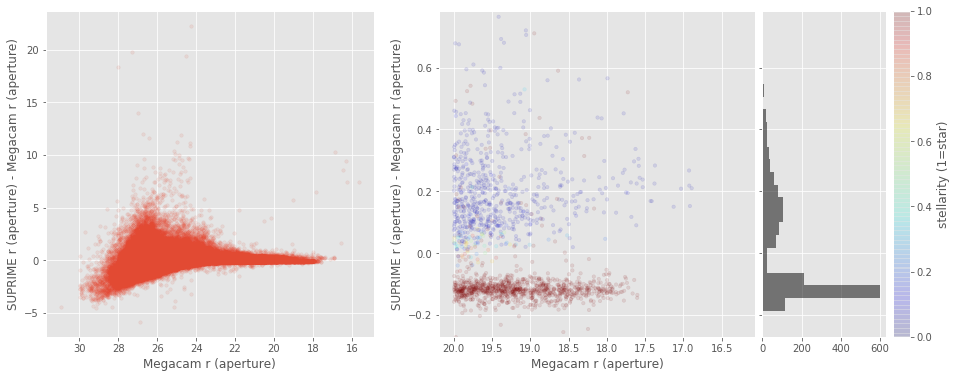

BASS r (aperture) - Megacam r (aperture):
6233


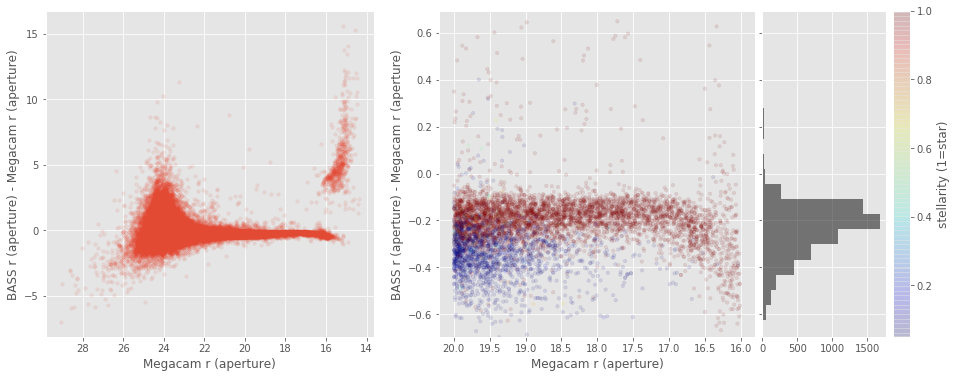

BASS r (aperture) - SUPRIME r (aperture):
1540


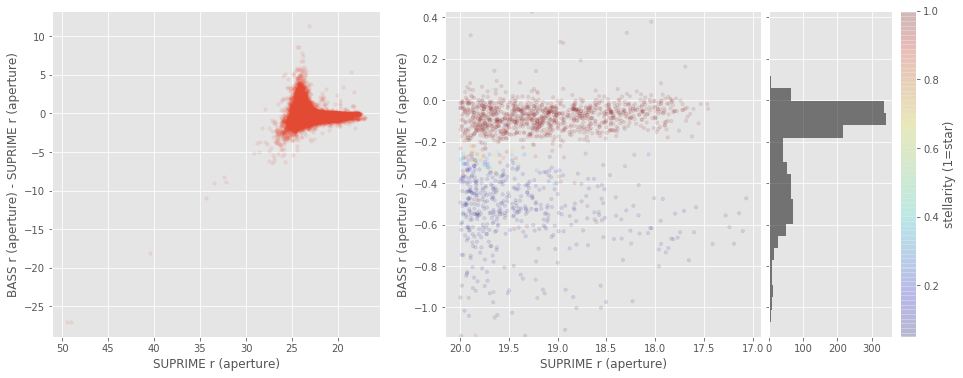

Megacam i (aperture) - GPC1 i (aperture):
11134


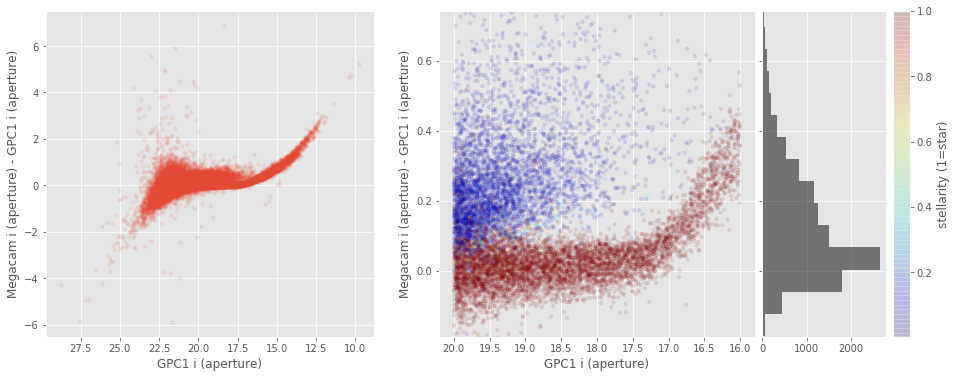

SUPRIME i (aperture) - GPC1 i (aperture):
3475


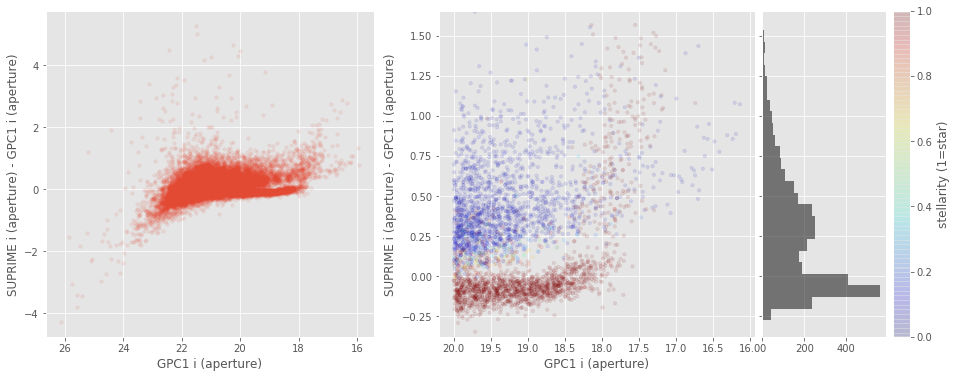

No sources have both GPC1 i (aperture) and MMT i (aperture) values.

SUPRIME i (aperture) - Megacam i (aperture):
3017


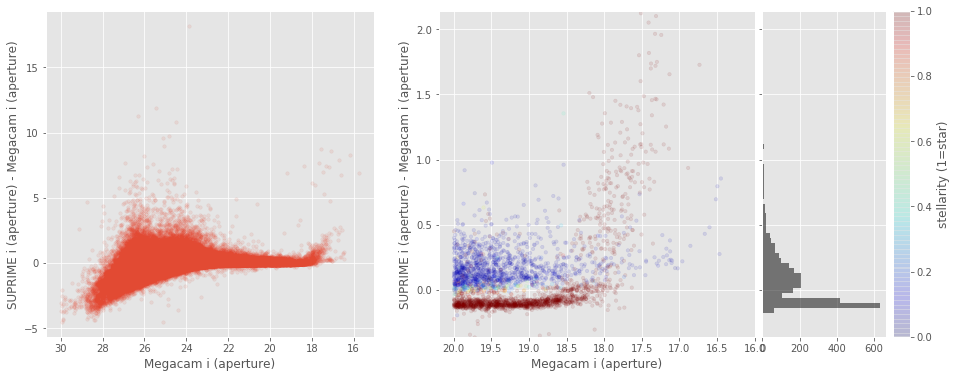

No sources have both Megacam i (aperture) and MMT i (aperture) values.

No sources have both SUPRIME i (aperture) and MMT i (aperture) values.

Megacam z (aperture) - GPC1 z (aperture):
14028


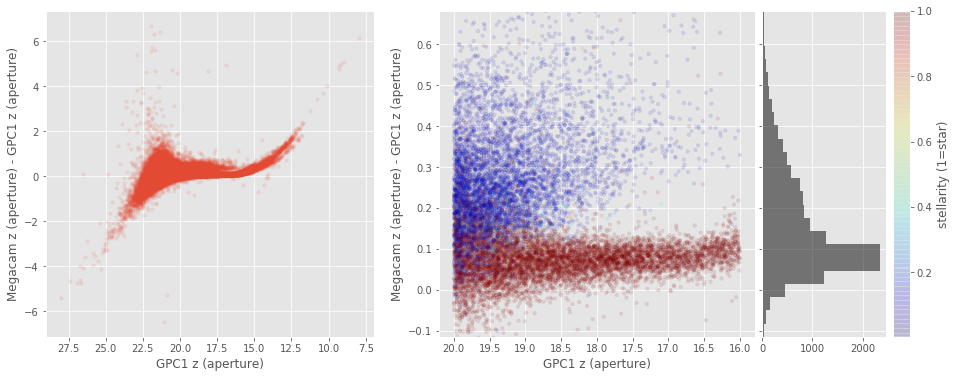

SUPRIME z (aperture) - GPC1 z (aperture):
4540


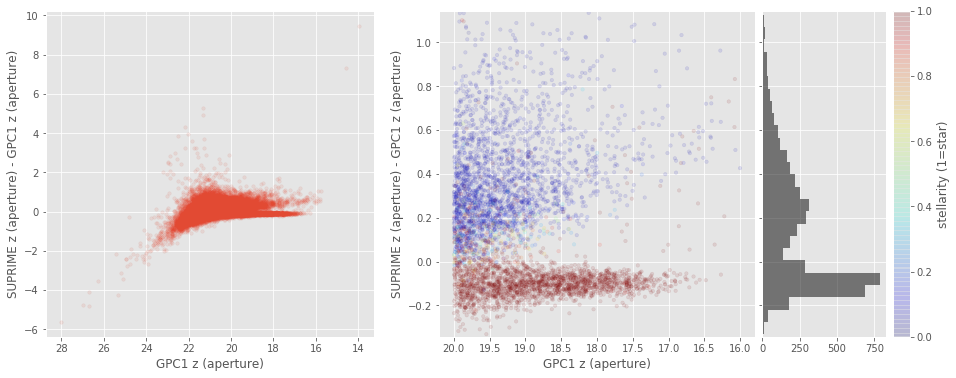

BASS z (aperture) - GPC1 z (aperture):
9189


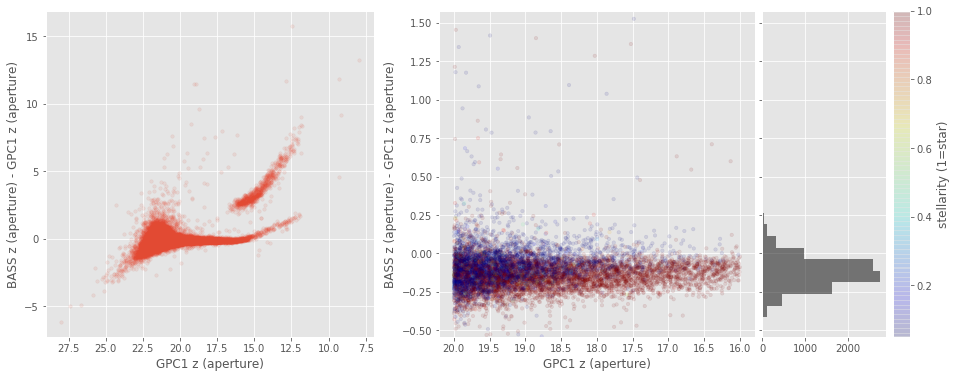

No sources have both GPC1 z (aperture) and MMT z (aperture) values.

SUPRIME z (aperture) - Megacam z (aperture):
3863


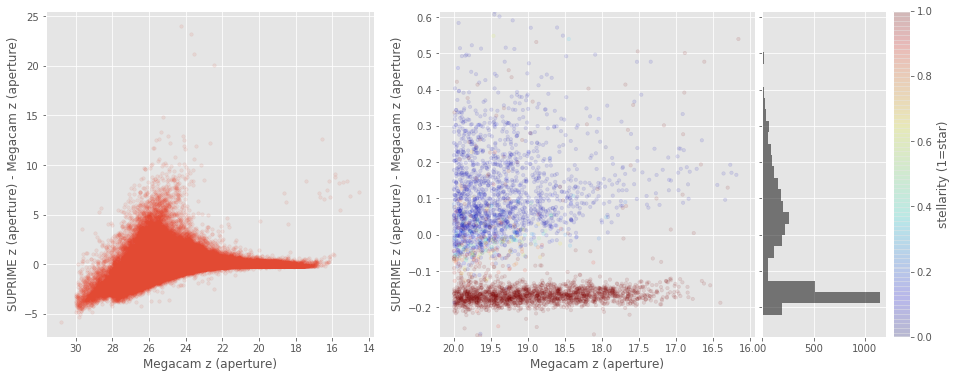

BASS z (aperture) - Megacam z (aperture):
8141


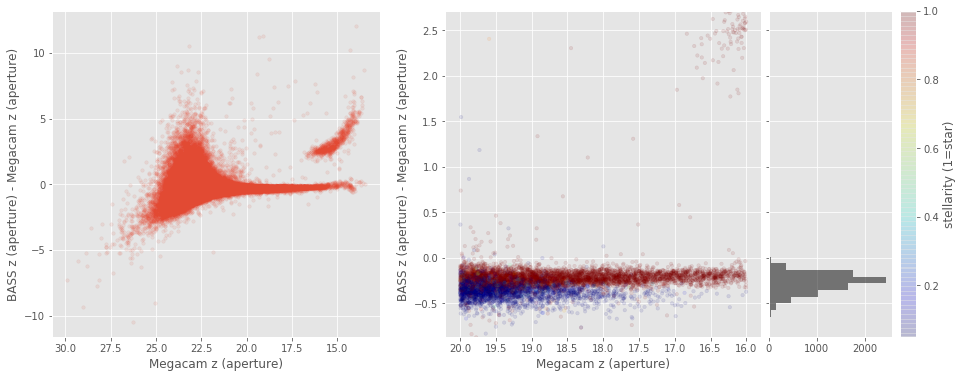

No sources have both Megacam z (aperture) and MMT z (aperture) values.

BASS z (aperture) - SUPRIME z (aperture):
2603


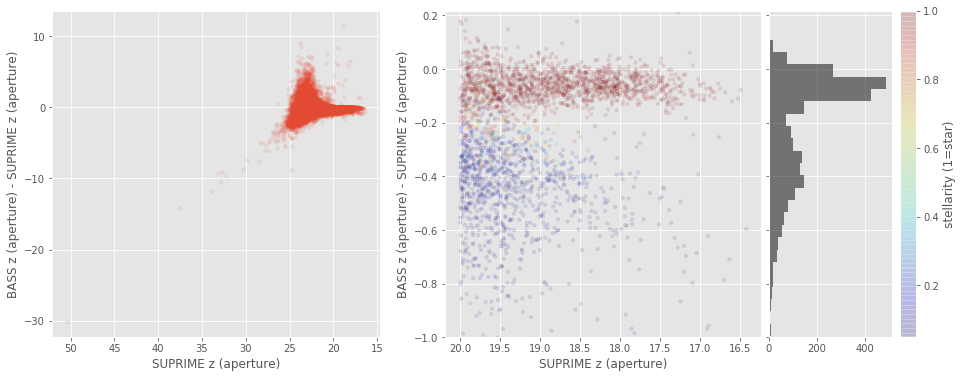

No sources have both SUPRIME z (aperture) and MMT z (aperture) values.

No sources have both BASS z (aperture) and MMT z (aperture) values.

SUPRIME y (aperture) - GPC1 y (aperture):
5986


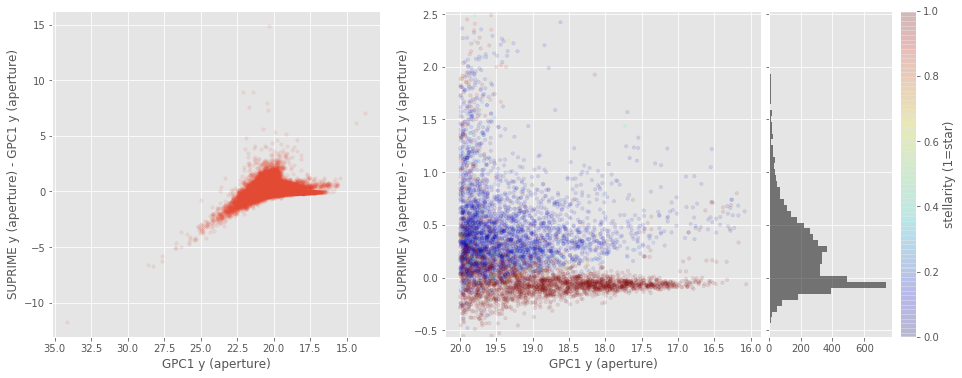

No sources have both WIRCAM J (aperture) and WIRCS J (aperture) values.

UKIDSS J (aperture) - WIRCAM J (aperture):
2038


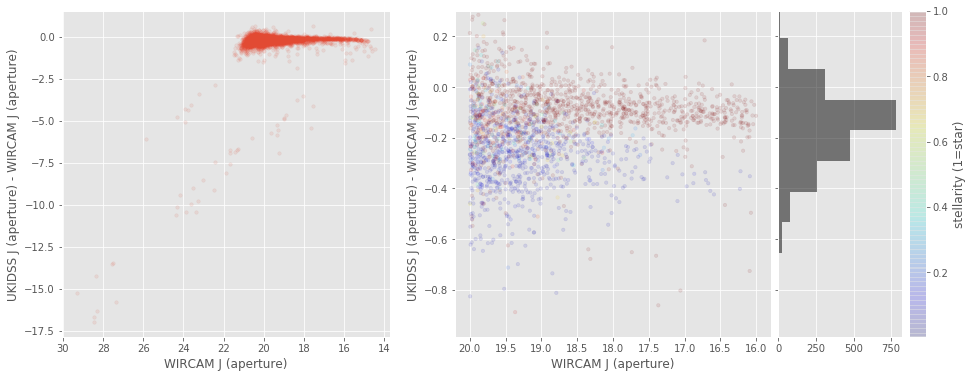

No sources have both WIRCAM J (aperture) and OMEGA2000 J (aperture) values.

No sources have both WIRCS J (aperture) and UKIDSS J (aperture) values.

No sources have both WIRCS J (aperture) and OMEGA2000 J (aperture) values.

No sources have both UKIDSS J (aperture) and OMEGA2000 J (aperture) values.

WIRCS K (aperture) - WIRCAM Ks (aperture):
2064


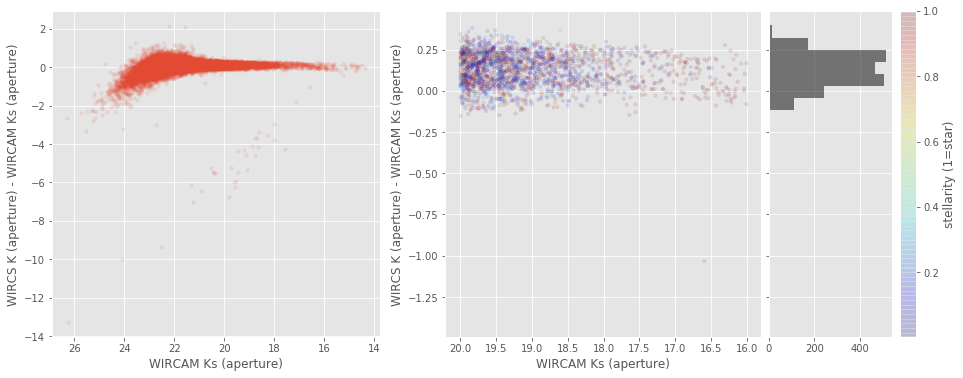

No sources have both WIRCAM Ks (aperture) and NEWFIRM K (aperture) values.

No sources have both WIRCAM Ks (aperture) and OMEGA2000 Ks (aperture) values.

No sources have both WIRCS K (aperture) and NEWFIRM K (aperture) values.

No sources have both WIRCS K (aperture) and OMEGA2000 Ks (aperture) values.

No sources have both NEWFIRM K (aperture) and OMEGA2000 Ks (aperture) values.



/data/vault/epons/conda_envs/herschelhelp_internal/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


In [40]:
for band_of_a_kind in all_bands:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):

        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
       
        if basecol1 == "gpc1_z" and basecol2 == "megacam_z":
            savefig = True
        else:
            savefig = False
        
        # Aperture mag
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)

        apcor_check(master_catalogue[col1], master_catalogue[col2], master_catalogue['stellarity'],
                 labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)), savefig=savefig)

for j in range(40):
    plt.close()